# To do:


# 1. Code set-up

In [ ]:
# Set folders
from pathlib import Path

data_folder = '.....'

In [2]:
# Import modules

import pandas as pd
import geopandas as gpd
import matplotlib
matplotlib.use('TkAgg')
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from matplotlib import patheffects
from IPython.display import IFrame
from shapely.geometry import Point
from shapely.geometry import box
import folium
import os
import numpy as np
import xarray as xr
import rioxarray
import hvplot.xarray  
import osmnx as ox

%matplotlib inline

# 2 Import Data

## 2.1 TNUoS Regions

In [6]:
# TNUoS Regions
# tnuos_regions = gpd.read_file(data_folder + 'tnuosgenzones/TNUoSGenZones.shp')
tnuos_regions = gpd.read_file(data_folder+'tnuosgenzones/tnuosgenzones_geojs.geojson')
# https://www.neso.energy/data-portal/gis-boundaries-gb-generation-charging-zones

/Users/martinkelly/Documents/Coding/.venv/lib/python3.13/site-packages/pyogrio/raw.py:198: RuntimeWarning: Several features with id = 1 have been found. Altering it to be unique. This warning will not be emitted anymore for this layer
  return ogr_read(


In [7]:
# Import TNUoS Charges
# https://www.neso.energy/industry-information/charging/tnuos-charges
tnuos_charges = pd.read_excel(data_folder+'tnuosgenzones/Public_2026-27 Draft TNUoS Tariff Tables_V1.xlsx', sheet_name='T2', header=3)
tnuos_charges_temp1 = tnuos_charges.drop(index=[0, 1]).reset_index(drop=True)

In [8]:
tnuos_charges.columns

Index(['Generation Tariffs ', 'Unnamed: 1', 'System Peak Tariff',
       'Shared Year Round Tariff', 'Not Shared Year Round Tariff',
       'Adjustment Tariff', 'Conventional Carbon \n40%',
       'Conventional Low Carbon \n75%', 'Intermittent \n45%'],
      dtype='object')

In [9]:
# Simplify df to wind
tnuos_charges_temp2 = tnuos_charges_temp1.loc[:,('Generation Tariffs ', 'Unnamed: 1', 'Shared Year Round Tariff', 'Not Shared Year Round Tariff',
       'Adjustment Tariff')] # https://www.neso.energy/document/130271/download p.11 for TNUoS formula for intermittent generation
tnuos_charges_wind = tnuos_charges_temp2.rename(columns={'Unnamed: 1': 'Zone Name',
                                      'Generation Tariffs ': 'Zone'})

## 2.2 Long, 1-time imports

#### Scottish network (~9 mins)

In [ ]:
# Import Scottish network data 

# 1. Define the place and custom tags
place_name = "Scotland"

# Define the custom tags to retrieve power infrastructure
# 'power=line' is used for high voltage lines carried on towers
# 'power=substation' is used for substations
# We use a union filter syntax to get both types of elements
custom_filter = '["power"~"line|substation"]'

# 2. Retrieve the relevant geospatial features (GeoDataFrames)
# Use ox.features_from_place to get non-network features like lines and substations
scot_power_features = ox.features_from_place(place_name, tags={"power": ["line", "substation"]})

# Separate lines and substations for distinct plotting/analysis if needed
gdf_lines = scot_power_features[scot_power_features['power'].isin(['line'])]
gdf_substations = scot_power_features[scot_power_features['power'] == 'substation']

gdf_lines.to_crs(epsg=27700).to_file(data_folder+"scot_lines.geojson", driver="GeoJSON")
gdf_substations.to_crs(epsg=4326).to_file(data_folder+"scot_substations.geojson", driver="GeoJSON")

/Users/martinkelly/Documents/Coding/.venv/lib/python3.13/site-packages/osmnx/_overpass.py:271: UserWarning: This area is 130 times your configured Overpass max query area size. It will automatically be divided up into multiple sub-queries accordingly. This may take a long time.
  multi_poly_proj = utils_geo._consolidate_subdivide_geometry(poly_proj)


#### GB Road network (~120 mins)

In [ ]:
### IMPORTANT: 
### This section downloaded road data for each TNUoS region. However one region had missing
### data, meaning the code couldn't associate any roads as being in an 'empty' region.
### This code is therefore repeated later on to fully download roads over a complete map of GB:
### See 'Roads' under '2.2 Process Data'

# # Map GB roads

# # Road types to filter for
# custom_filter = ('["highway"~"motorway|trunk|primary|secondary"]')

# # List to store road maps in
# edges_list = []

# # Create a road map for each TNUoS region; skip any region where the mapping fails.
# for i in range(len(tnuos_regions)):
#     poly = tnuos_regions.geometry.iloc[i]

#     try:
#         G = ox.graph_from_polygon(
#             poly,
#             custom_filter=custom_filter,
#             simplify=True
#         )

#         # Convert graph to GeoDataFrame
#         edges = ox.graph_to_gdfs(
#             G,
#             nodes=False,
#             edges=True
#         )

#         edges["tnuos_id"] = i
#         edges_list.append(edges)

#         print(f"Region {i}: {len(edges)} road segments")

#     except Exception as e:
#         print(f"Region {i}: skipped ({e})")

# # Combine the maps
# gb_roads = gpd.GeoDataFrame(pd.concat(edges_list), crs="EPSG:4326")

In [ ]:
# # Convert to BNG & save
# gb_roads.to_crs(epsg=27700).to_file(data_folder+"gb_roads.geojson", driver="GeoJSON")

## 2.3 Faster file imports

#### Scottish network

In [10]:
# Load scottish network data
gdf_lines = gpd.read_file(data_folder+"scot_lines.geojson")
gdf_substations = gpd.read_file(data_folder+"scot_substations.geojson")

/Users/martinkelly/Documents/Coding/.venv/lib/python3.13/site-packages/pyogrio/raw.py:198: RuntimeWarning: Several features with id = 27163143 have been found. Altering it to be unique. This warning will not be emitted anymore for this layer
  return ogr_read(
/Users/martinkelly/Documents/Coding/.venv/lib/python3.13/site-packages/pyogrio/raw.py:198: RuntimeWarning: Several features with id = 10377509 have been found. Altering it to be unique. This warning will not be emitted anymore for this layer
  return ogr_read(


#### Roads

In [11]:
# Load road network data
gb_roads = gpd.read_file(data_folder+"gb_roads.geojson")

Skipping field highway: unsupported OGR type: 5
Skipping field lanes: unsupported OGR type: 5
Skipping field maxspeed: unsupported OGR type: 5
Skipping field name: unsupported OGR type: 5
Skipping field ref: unsupported OGR type: 5
Skipping field width: unsupported OGR type: 5
Skipping field bridge: unsupported OGR type: 5
Skipping field junction: unsupported OGR type: 5
Skipping field tunnel: unsupported OGR type: 5
Skipping field est_width: unsupported OGR type: 5


In [12]:
gb_roads_bng = gb_roads.to_crs(epsg=27700)

#### UK Map

In [17]:
## IMPORT DATA

# UK boundary
uk_map = gpd.read_file(data_folder + 'UK boundary/CTRY_DEC_2023_UK_BFC.shp')
# https://geoportal.statistics.gov.uk

In [14]:
# Local authorities
la_map = gpd.read_file(data_folder + 'UK boundary/Local_Authority_Districts_May_2024_Boundaries_UK_BFE_-5285665645137523111.geojson')
# https://geoportal.statistics.gov.uk/datasets/ons::local-authority-districts-may-2024-boundaries-uk-bfe-2/about

#### REPD

In [15]:
# Renewable generation sites
repd = pd.read_csv(data_folder + 'REPD_Publication_Q3_2025.csv', encoding="cp1252")
# https://www.data.gov.uk/dataset/a5b0ed13-c960-49ce-b1f6-3a6bbe0db1b7/repd

#### Network

In [16]:
# NGET Network
nget_cables = gpd.read_file(data_folder + 'NGET/cable.shp')
nget_substations = gpd.read_file(data_folder + 'NGET/Substations.shp')
nget_oh_lines = gpd.read_file(data_folder + 'NGET/OHL.shp')
nget_towers = gpd.read_file(data_folder + 'NGET/Towers.shp')
# https://www.nationalgrid.com/electricity-transmission/network-and-infrastructure/network-route-maps

In [17]:
# SSEN Network
ssen_substations = gpd.read_file(data_folder + 'SSEN/ssen-transmission-substation-site-grid.shp')
ssen_substations_super = gpd.read_file(data_folder + 'SSEN/ssen-transmission-substation-site-supergrid.shp')
ssen_oh_lines = gpd.read_file(data_folder + 'SSEN/overhead-line-grid.shp')
ssen_oh_lines_super = gpd.read_file(data_folder + 'SSEN/ssen-transmission-overhead-line-supergrid.shp')

#### Terrain

In [18]:
# Terrain
terrain = xr.open_dataset(data_folder + 'terrain.tif')

#### Wind speed

In [19]:
wind_speed = xr.open_dataset(data_folder + 'wind_speed.nc')

#### Restricted Areas

In [20]:
# AONB
# Eng https://www.data.gov.uk/dataset/8e3ae3b9-a827-47f1-b025-f08527a4e84e/areas-of-outstanding-natural-beauty-england1
# Sco https://www.data.gov.uk/dataset/8d9d285a-985d-4524-90a0-3238bca9f8f8/national-scenic-areas-scotland
# Wal https://www.data.gov.uk/dataset/71b527aa-03e7-4fa2-9730-e6af6cdac81d/areas-of-outstanding-natural-beauty-aonbs1

eng_aonb = gpd.read_file(data_folder + 'AONB & NSA/Areas_of_Outstanding_Natural_Beauty_England.gpkg')
sco_aonb = gpd.read_file(data_folder + 'AONB & NSA/SG_NationalScenicAreas_1998/SG_NationalScenicAreas_1998.shp')
wal_aonb = gpd.read_file(data_folder + 'AONB & NSA/Area of Outstanding Natural Beauty (AONB) - spatial data.json')

In [21]:
# Green belt
# https://www.data.gov.uk/dataset/ccb505e0-67a8-4ace-b294-19a3cbff4861/english-local-authority-green-belt-dataset10
green_belt_eng = gpd.read_file(data_folder + 'Green Belt/England_Green_Belt_2024_25_WGS84.shp')
# https://data.spatialhub.scot/dataset/green_belt-is/resource/f3e73ad8-d1d6-4404-8028-989867e20847
green_belt_sco = gpd.read_file(data_folder + 'Green Belt/pub_grnblt.shp')

In [22]:
# Natural nature reserves
# https://www.data.gov.uk/dataset/726484b0-d14e-44a3-9621-29e79fc47bfc/national-nature-reserves-england1
nature_res_eng = gpd.read_file(data_folder + 'AONB & NSA/National_Nature_Reserves_England.geojson')
# https://www.data.gov.uk/dataset/5dae8e31-3ef3-4a2e-8c6c-31068e354c83/national-nature-reserves-scotland
nature_res_sco = gpd.read_file(data_folder + 'AONB & NSA/NNR_SCOTLAND.gpkg')
# https://datamap.gov.wales/layers/inspire-nrw:NRW_NNR
nature_res_wal = gpd.read_file(data_folder + 'AONB & NSA/National Nature Reserves (NNR) - spatial data.json')

In [23]:
# Special Areas of Conservation
# https://www.data.gov.uk/dataset/a85e64d9-d0f1-4500-9080-b0e29b81fbc8/special-areas-of-conservation-england2
sac_eng = gpd.read_file(data_folder+'AONB & NSA/Special_Areas_of_Conservation_England.geojson')
# https://www.data.gov.uk/dataset/2559b8bc-ddd6-4cb1-8a98-9422e1b1865a/special-areas-of-conservation-scotland
sac_sco = gpd.read_file(data_folder+'AONB & NSA/SAC_SCOTLAND.gpkg')
# https://datamap.gov.wales/layers/inspire-nrw:NRW_SAC
sac_wal = gpd.read_file(data_folder+'AONB & NSA/Special Areas of Conservation (SAC) - spatial data.json')

In [24]:
# Special protection area
# https://environment.data.gov.uk/explore/4c660eee-887e-4c8b-91e5-d84b4c1078ac?download=true
spa_eng = gpd.read_file(data_folder+'SPA & Nat Parks/Special_Protection_Areas_England.geojson')
# https://www.data.gov.uk/dataset/549cfe11-819d-4b0c-9479-9c70135fe9cf/special-protection-area-scotland
spa_sco = gpd.read_file(data_folder + 'SPA & Nat Parks/SPA_SCOTLAND.gpkg')
#https://datamap.gov.wales/layers/inspire-nrw:NRW_SPA
spa_sco = gpd.read_file(data_folder + 'SPA & Nat Parks/Special Protection Areas (SPA) - spatial data.json')

In [25]:
# National parks
# https://www.data.gov.uk/dataset/334e1b27-e193-4ef5-b14e-696b58bb7e95/national-parks-england1
np_eng = gpd.read_file(data_folder + 'SPA & Nat Parks/National_Parks_England.geojson')
# https://www.data.gov.uk/dataset/6f63d73d-c45d-4947-8ad0-2d6f52b200ff/loch-lomond-and-the-trossachs-national-park-designated-boundary
np_sco_1 = gpd.read_file(data_folder + 'SPA & Nat Parks/SG_LochLomondTrossachsNationalPark_2002/SG_LochLomondTrossachsNationalPark_2002.shp')
# https://www.data.gov.uk/dataset/8a00dbd7-e8f2-40e0-bcba-da2067d1e386/cairngorms-national-park-designated-boundary
np_sco_2 = gpd.read_file(data_folder + 'SPA & Nat Parks/SG_CairngormsNationalPark_2010/SG_CairngormsNationalPark_2010.shp')
# https://datamap.gov.wales/layers/inspire-nrw:NRW_NATIONAL_PARK
np_wal = gpd.read_file(data_folder + 'SPA & Nat Parks/National Parks - spatial data.json')


In [26]:
# SSSI (scientific interest)
# https://www.data.gov.uk/dataset/5b632bd7-9838-4ef2-9101-ea9384421b0d/sites-of-special-scientific-interest-england3
sssi_eng = gpd.read_file(data_folder + 'SSSI/Sites_of_Special_Scientific_Interest_England.geojson')
# https://www.data.gov.uk/dataset/d64bf689-4ce8-465b-b00e-6a57dec94a22/site-of-special-scientific-interest-scotland
sssi_sco = gpd.read_file(data_folder + 'SSSI/SSSI_SCOTLAND.gpkg')
# https://datamap.gov.wales/layers/inspire-nrw:NRW_SSSI
sssi_wal = gpd.read_file(data_folder + 'SSSI/Sites of Special Scientific Interest (SSSI) - spatial data.json')



#### Land use

In [27]:
# Urban areas
eng_wal_urban = gpd.read_file(data_folder + 'Urban/main_ONS_BUA_2024_EW_-4336733537223243414.gpkg')
sco_urban = gpd.read_file(data_folder + 'Urban/Scotshapefiles/Settlements_2020_MHW.shp')

# E&W: https://www.data.gov.uk/dataset/504157a0-136a-4ef6-883a-19556447c832/built-up-areas-december-2024-boundaries-ew-bgg
# Scot: https://www.data.gov.uk/dataset/de5ad374-53b7-474f-b1c0-725687af1ed4/settlements-scotland

In [28]:
# https://www.data.gov.uk/dataset/cd2c59e7-afd9-471d-a056-c5845619dcd7/corine-land-cover-2018-for-the-uk-isle-of-man-jersey-and-guernsey
# Cole, B.; De la Barreda, B.; Hamer, A.; Codd, T.; Payne, M.; Chan, L.; Smith, G.; Balzter, H. (2021). Corine land cover 2018 for the UK, Isle of Man, Jersey and Guernsey NERC EDS Environmental Information Data Centre. https://doi.org/10.5285/084e0bc6-e67f-4dad-9de6-0c698f60e34d
land_cover = gpd.read_file(data_folder+'land use data/clc2018_uk.shp')

In [29]:
## Source: https://clc.gios.gov.pl/doc/clc/CLC_Legend_EN.pdf

# ----------------------------
# Define Corine lookup table
# ----------------------------

data = [
    # code3, level1_name, level2_name, level3_name, rgb
    ("111", "Artificial surfaces", "Urban fabric", "Continuous urban fabric", (230, 0, 77)),
    ("112", "Artificial surfaces", "Urban fabric", "Discontinuous urban fabric", (255, 0, 0)),

    ("121", "Artificial surfaces", "Industrial, commercial and transport units", "Industrial or commercial units", (204, 77, 242)),
    ("122", "Artificial surfaces", "Industrial, commercial and transport units", "Road and rail networks and associated land", (204, 0, 0)),
    ("123", "Artificial surfaces", "Industrial, commercial and transport units", "Port areas", (230, 204, 204)),
    ("124", "Artificial surfaces", "Industrial, commercial and transport units", "Airports", (230, 204, 230)),

    ("131", "Artificial surfaces", "Mine, dump and construction sites", "Mineral extraction sites", (166, 0, 204)),
    ("132", "Artificial surfaces", "Mine, dump and construction sites", "Dump sites", (166, 77, 0)),
    ("133", "Artificial surfaces", "Mine, dump and construction sites", "Construction sites", (255, 77, 255)),

    ("141", "Artificial surfaces", "Artificial, non-agricultural vegetated areas", "Green urban areas", (255, 166, 255)),
    ("142", "Artificial surfaces", "Artificial, non-agricultural vegetated areas", "Sport and leisure facilities", (255, 230, 255)),

    ("211", "Agricultural areas", "Arable land", "Non-irrigated arable land", (255, 255, 168)),
    ("212", "Agricultural areas", "Arable land", "Permanently irrigated land", (255, 255, 0)),
    ("213", "Agricultural areas", "Arable land", "Rice fields", (230, 230, 0)),

    ("221", "Agricultural areas", "Permanent crops", "Vineyards", (230, 128, 0)),
    ("222", "Agricultural areas", "Permanent crops", "Fruit trees and berry plantations", (242, 166, 77)),
    ("223", "Agricultural areas", "Permanent crops", "Olive groves", (230, 166, 0)),

    ("231", "Agricultural areas", "Pastures", "Pastures", (230, 230, 77)),

    ("241", "Agricultural areas", "Heterogeneous agricultural areas", "Annual crops associated with permanent crops", (255, 230, 166)),
    ("242", "Agricultural areas", "Heterogeneous agricultural areas", "Complex cultivation patterns", (255, 230, 77)),
    ("243", "Agricultural areas", "Heterogeneous agricultural areas",
     "Land principally occupied by agriculture, with significant areas of natural vegetation", (230, 204, 77)),
    ("244", "Agricultural areas", "Heterogeneous agricultural areas", "Agro-forestry areas", (242, 204, 166)),

    ("311", "Forest and semi-natural areas", "Forests", "Broad-leaved forest", (128, 255, 0)),
    ("312", "Forest and semi-natural areas", "Forests", "Coniferous forest", (0, 166, 0)),
    ("313", "Forest and semi-natural areas", "Forests", "Mixed forest", (77, 255, 0)),

    ("321", "Forest and semi-natural areas", "Scrub and/or herbaceous vegetation associations", "Natural grasslands", (204, 242, 77)),
    ("322", "Forest and semi-natural areas", "Scrub and/or herbaceous vegetation associations", "Moors and heathland", (166, 255, 128)),
    ("323", "Forest and semi-natural areas", "Scrub and/or herbaceous vegetation associations", "Sclerophyllous vegetation", (166, 230, 77)),
    ("324", "Forest and semi-natural areas", "Scrub and/or herbaceous vegetation associations", "Transitional woodland-shrub", (166, 242, 0)),

    ("331", "Forest and semi-natural areas", "Open spaces with little or no vegetation", "Beaches, dunes, sands", (230, 230, 230)),
    ("332", "Forest and semi-natural areas", "Open spaces with little or no vegetation", "Bare rocks", (204, 204, 204)),
    ("333", "Forest and semi-natural areas", "Open spaces with little or no vegetation", "Sparsely vegetated areas", (204, 255, 204)),
    ("334", "Forest and semi-natural areas", "Open spaces with little or no vegetation", "Burnt areas", (0, 0, 0)),
    ("335", "Forest and semi-natural areas", "Open spaces with little or no vegetation", "Glaciers and perpetual snow", (166, 230, 204)),

    ("411", "Wetlands", "Inland wetlands", "Inland marshes", (166, 166, 255)),
    ("412", "Wetlands", "Inland wetlands", "Peat bogs", (77, 77, 255)),

    ("421", "Wetlands", "Maritime wetlands", "Salt marshes", (204, 204, 255)),
    ("422", "Wetlands", "Maritime wetlands", "Salines", (230, 230, 255)),
    ("423", "Wetlands", "Maritime wetlands", "Intertidal flats", (166, 166, 230)),

    ("511", "Water bodies", "Inland waters", "Water courses", (0, 204, 242)),
    ("512", "Water bodies", "Inland waters", "Water bodies", (128, 242, 230)),

    ("521", "Water bodies", "Marine waters", "Coastal lagoons", (0, 255, 166)),
    ("522", "Water bodies", "Marine waters", "Estuaries", (166, 255, 230)),
    ("523", "Water bodies", "Marine waters", "Sea and ocean", (230, 242, 255)),
]

# ----------------------------
# Create DataFrame
# ----------------------------

corine_df = pd.DataFrame(
    data,
    columns=[
        "CODE_18",
        "level1_name",
        "level2_name",
        "level3_name",
        "rgb"
    ]
)

corine_df["plot_color"] = corine_df["rgb"].apply(
    lambda x: tuple(v / 255 for v in x)
)

corine_df = corine_df.drop(columns=["rgb"])

corine_df.head()

,CODE_18,level1_name,level2_name,level3_name,plot_color
0,111,Artificial surfaces,Urban fabric,Continuous urban fabric,"(0.9019607843137255, 0.0, 0.30196078431372547)"
1,112,Artificial surfaces,Urban fabric,Discontinuous urban fabric,"(1.0, 0.0, 0.0)"
2,121,Artificial surfaces,"Industrial, commercial and transport units",Industrial or commercial units,"(0.8, 0.30196078431372547, 0.9490196078431372)"
3,122,Artificial surfaces,"Industrial, commercial and transport units",Road and rail networks and associated land,"(0.8, 0.0, 0.0)"
4,123,Artificial surfaces,"Industrial, commercial and transport units",Port areas,"(0.9019607843137255, 0.8, 0.8)"


# 3 Process data - fast code

### UK Map
Structure:
1. Split UK map into GB & NI
2. Convert GB map into GB outline

In [18]:
uk_map.head()

,CTRY23CD,CTRY23NM,CTRY23NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry
0,E92000001,England,Lloegr,394883,370883,-2.07811,53.2350,ea73ad5d-1f4e-4f07-8e0c-02377d387374,"MULTIPOLYGON (((83962.84 5401.15, 83970.68 540..."
1,N92000002,Northern Ireland,Gogledd Iwerddon,86544,535337,-6.85570,54.6150,3251c9fa-985f-4477-95b0-62f209a71c25,"MULTIPOLYGON (((131198.094 468427.673, 131196...."
2,S92000003,Scotland,Yr Alban,277744,700060,-3.97094,56.1774,f2267107-2e4a-442e-bc83-e766580c5fd0,"MULTIPOLYGON (((265944.63 543512.72, 265945.83..."
3,W92000004,Wales,Cymru,263405,242881,-3.99417,52.0674,d818bd0d-8e08-446f-8891-e785ac941e60,"MULTIPOLYGON (((322081.699 165165.901, 322082...."


In [19]:
# Create GB outline map. Create a NI map to enable me to remove all renewable projects in NI from the REPD dataset.
gb_map = uk_map[uk_map['CTRY23NM'] != 'Northern Ireland']
ni_boundary = uk_map[uk_map['CTRY23NM'] == 'Northern Ireland']

In [20]:
# Remove northern islands (Shetland & Orkneys)
from shapely.geometry import box
# Define clip boundary
northing_cutoff = 978400 # Just above John O'Groats https://gridreferencefinder.com/#gr=ND3592985995|Point_s_A|1,ND3707678353|Point_s_B|1

#minx, miny, maxx, maxy = gb_map.total_bounds
minx, miny, maxx, maxy = 62500, 12500, 652500, 972500       # These are the bounds of the wind speed data. This ensures all data has the same bounds when combining as raster data.

clip_box = box(
    minx,
    miny,
    maxx,
    northing_cutoff
)

gb_map_clipped = gpd.clip(
    gb_map,
    clip_box
)

In [21]:
# Make a NI clip box
minx, miny, maxx, maxy = ni_boundary.total_bounds

clip_box_ni = box(
    minx,
    miny,
    maxx,
    maxy
)

In [22]:
# Merge Eng, Sco & Wal into single GB polygon (~ 9 secs)
gb_boundary = gpd.GeoDataFrame(
    geometry=[gb_map.union_all()],
    crs="EPSG:27700"
)

gb_boundary_clip = gpd.GeoDataFrame(
    geometry=[gb_map_clipped.union_all()],
    crs="EPSG:27700"
)

In [23]:
print(gb_boundary_clip.crs)
print(ni_boundary.crs)

EPSG:27700
EPSG:27700


In [24]:
# LOCAL AUTHORITY BOUNDARIES
# Convert to BNG
la_map_temporary = la_map.to_crs(gb_boundary_clip.crs)
# Drop Northern Ireland Local Authorities
la_map_bng = gpd.clip(la_map_temporary[~la_map_temporary['LAD24CD'].astype(str).str.startswith('N')], clip_box)

NameError: name 'la_map' is not defined

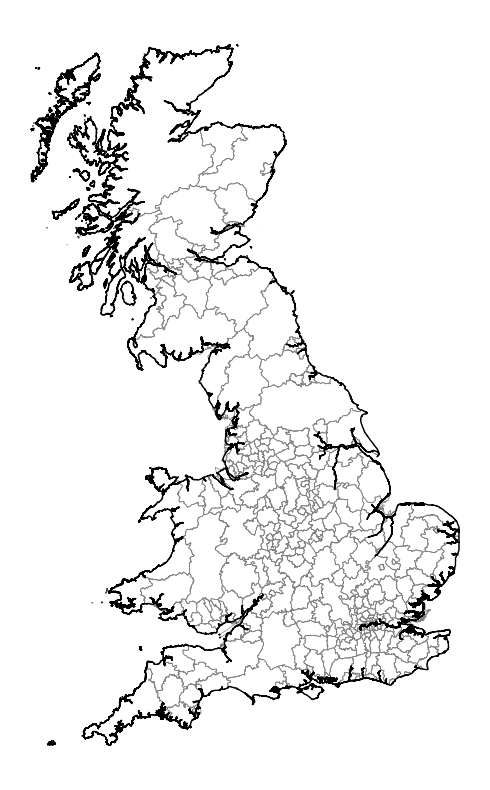

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))

# Plot UK boundary & TNUoS Regions (base layer)
la_map_bng.plot(ax=ax, color='none', edgecolor='grey', linewidth=0.5)
gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

ax.axis('off')

plt.show()

### TNUoS regions

Structure:
1. Align CRS for TNUoS regions with GB boundary map
2. Plot network on map

In [39]:
# Check CRS. Create a gpd for TNUoS regions with BNG CRS

print(f"The CRS for gb_boundary is {gb_boundary.crs}")
print(f"The CRS for tnuos_regions is {tnuos_regions.crs}")

if gb_boundary.crs != tnuos_regions.crs:
    tnuos_regions_bng = tnuos_regions.to_crs(gb_boundary.crs)
else:
    tnuos_regions_bng = tnuos_regions
    
print(f"\nThe CRS for tnuos_regions_bng is {tnuos_regions_bng.crs}")

The CRS for gb_boundary is EPSG:27700
The CRS for tnuos_regions is EPSG:4326

The CRS for tnuos_regions_bng is EPSG:27700


<Axes: >

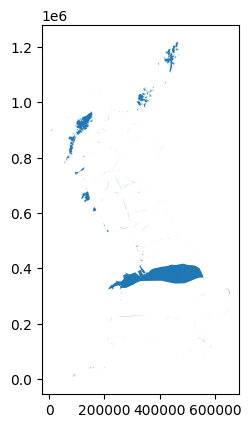

In [40]:
# Later analysis identified one region had an undefinable shape. I therefore 
# isolate that area to test what's going on.


valid_tnuos = tnuos_regions_bng[tnuos_regions_bng['layer'] != 'GZ16'].union_all()
missing_tnuos = gb_boundary.difference(valid_tnuos, align=False)
missing_tnuos.plot()

In [41]:
# I double-check the failing region.

invalid = ~tnuos_regions_bng.is_valid
invalid.sum(), tnuos_regions_bng[invalid].index.tolist()


(np.int64(1), [8])

In [42]:
# the map suggests a bow-tie; this checks that 'bow-tie'

from shapely.validation import explain_validity

bad = tnuos_regions_bng.loc[~tnuos_regions_bng.is_valid]

bad["reason"] = bad.geometry.apply(explain_validity)
bad[["reason"]]

/Users/martinkelly/Documents/Coding/.venv/lib/python3.13/site-packages/geopandas/geodataframe.py:1968: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,reason
8,Self-intersection[328628.100801074 410257.8540...


In [43]:
# Correct the issue. Splits the polygon into 2 trianges
tnuos_regions_bng["geometry"] = (
    tnuos_regions_bng.geometry.make_valid()
)

In [44]:
tnuos_regions_bng = tnuos_regions_bng.drop(index=[0]).reset_index(drop=True)

In [45]:
# Need to make a TNUoS shapefile with EPSG:4326 in order to download full GB road systems map
tnuos_regions_full = tnuos_regions_bng.to_crs(tnuos_regions.crs)

In [46]:
# Add TNUoS charges to TNUoS maps
tnuos_regions_bng = tnuos_regions_bng.merge(
    tnuos_charges_wind,
    how="left",
    left_on="id",
    right_on="Zone"
)

tnuos_regions_bng = tnuos_regions_bng.drop(columns=["Zone"])

In [47]:
# Trim off Orkney & Shetlands
tnuos_regions_bng_clip = gpd.clip(tnuos_regions_bng, clip_box)

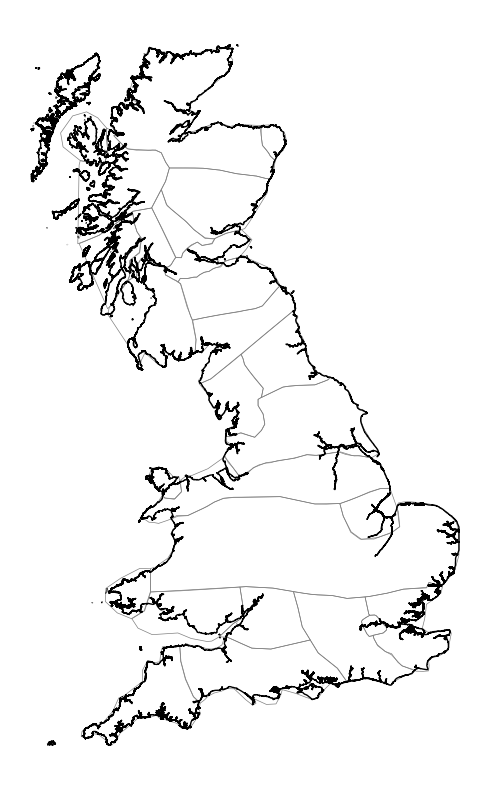

In [48]:
# Plot TNUoS regions
fig, ax = plt.subplots(figsize=(10, 10))

# Plot UK boundary & TNUoS Regions (base layer)
tnuos_regions_bng_clip.plot(ax=ax, color='none', edgecolor='grey', linewidth=0.5)
gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

ax.axis('off')

plt.show()

In [49]:
### Merge TNUos Boundaries to enable future clipping w/out Scottish Islands

tnuos_regions_union = gpd.GeoDataFrame(
    geometry=[tnuos_regions_bng.union_all()],
    crs="EPSG:27700"
)

### Terrain

In [50]:
terrain

<xarray.Dataset> Size: 526kB
Dimensions:      (band: 1, x: 264, y: 492)
Coordinates:
  * band         (band) int64 8B 1
  * x            (x) float64 2kB 1.25e+03 3.75e+03 ... 6.563e+05 6.588e+05
  * y            (y) float64 4kB 1.229e+06 1.226e+06 ... 3.75e+03 1.25e+03
    spatial_ref  int64 8B ...
Data variables:
    band_data    (band, y, x) float32 520kB ...

In [51]:
terrain = terrain.rename({'band_data': 'altitude'})

In [52]:
terrain.info

<bound method Dataset.info of <xarray.Dataset> Size: 526kB
Dimensions:      (band: 1, x: 264, y: 492)
Coordinates:
  * band         (band) int64 8B 1
  * x            (x) float64 2kB 1.25e+03 3.75e+03 ... 6.563e+05 6.588e+05
  * y            (y) float64 4kB 1.229e+06 1.226e+06 ... 3.75e+03 1.25e+03
    spatial_ref  int64 8B ...
Data variables:
    altitude     (band, y, x) float32 520kB ...>

In [53]:
# Convert altitude to slope:
dx = float(abs(terrain.x[1] - terrain.x[0]))
dy = float(abs(terrain.y[1] - terrain.y[0]))

# Altitude
z = terrain['altitude'].squeeze().values

# Gradient
dz_dy, dz_dx = np.gradient(z, dy, dx)

# Slope (degrees)
slope = np.degrees(
    np.arctan(np.sqrt(dz_dx**2 + dz_dy**2))
)

# Add back into terrain
terrain['slope'] = (('y', 'x'), slope)

In [54]:
# Clip terrain data to GB
terrain_gb = terrain.rio.clip(
    gb_boundary_clip.geometry,
    gb_boundary_clip.crs,
    drop=True
)

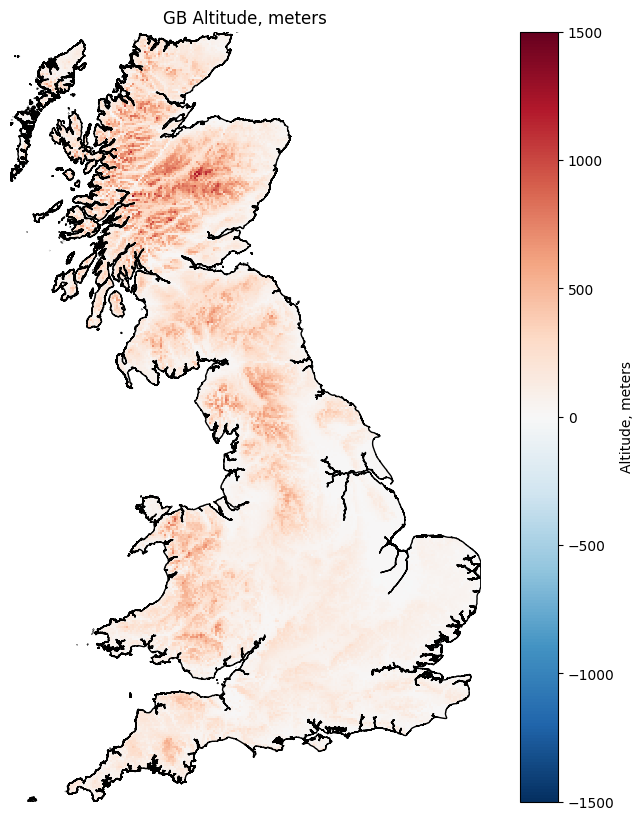

In [55]:
# Plot terrain onto GB map

fig, ax = plt.subplots(figsize=(10, 10))

# Set colours for key
norm = colors.TwoSlopeNorm(
    vmin=-1500,   
    vcenter=0,   # white at zero
    vmax=1500
)

# Plot altitude
m = terrain_gb['altitude'].plot(
    ax=ax,
    cmap='RdBu_r', 
    norm=norm,
    alpha=1,
)

# Plot GB boundary & TNUoS Regions (base layer)
gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

ax.set_title("GB Altitude, meters")
m.colorbar.set_label('Altitude, meters')
ax.axis('off')

plt.show()

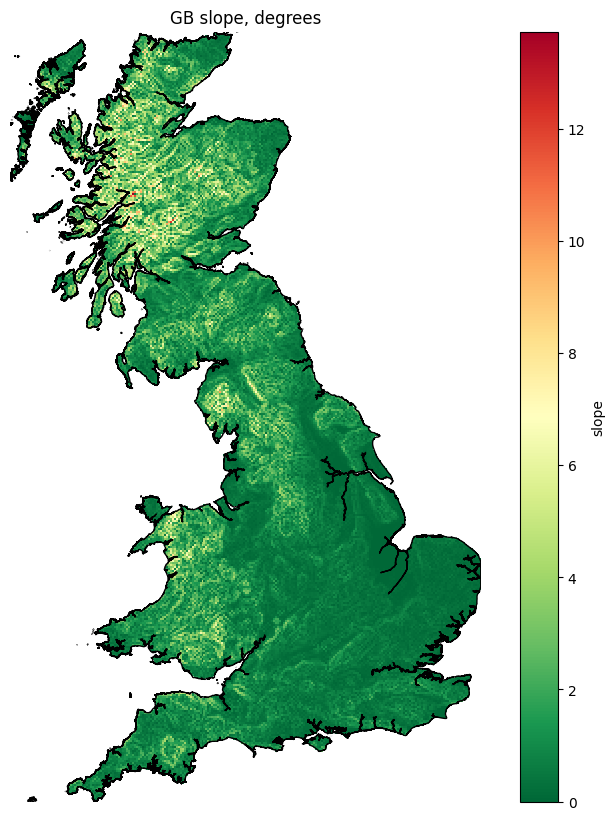

In [56]:
# Plot slope onto GB map

fig, ax = plt.subplots(figsize=(10, 10))

# Plot slope
terrain_gb['slope'].plot(
    ax=ax,
    cmap='RdYlGn_r', 
    alpha=1
)

# Plot GB boundary & TNUoS Regions (base layer)
gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

ax.set_title("GB slope, degrees")
ax.axis('off')

plt.show()

### REPD data

Structure:
1. Remove excess columns (repd_slim)
2. Remove obsolete projects (repd_slim_short)
3. Remove missing capacity (repd_clean)
4. Group techs into tech group; remove defunct techs (repd_clean_techgroup)
5. Convert to Geo-dataframe (repd_gpd)
6. Remove NI renewable sites (repd_gpd_gb)

In [57]:
# 1. Remove excess columns
repd_thin = repd.loc[:,
                    ('Ref ID', 
                    'Site Name', 
                    'Technology Type', 
                    'Installed Capacity (MWelec)', 
                    'X-coordinate', 'Y-coordinate',
                    'Development Status (short)')]

In [58]:
# 2. Remove obsolete projects
print(repd_thin['Development Status (short)'].value_counts())


Development Status (short)
Awaiting Construction          5001
Operational                    3045
Application Submitted          1674
Application Refused             856
Revised                         784
Application Withdrawn           618
Under Construction              414
Abandoned                       384
Planning Permission Expired     337
Appeal Refused                  314
Appeal Withdrawn                 49
Decommissioned                   31
No Application Required          13
Appeal Lodged                     4
Name: count, dtype: int64


In [59]:
# Remove sites without planning permission
repd_thin_short = repd_thin[repd_thin['Development Status (short)'].isin(['Operational', 'Under Construction', 'Awaiting Construction'])]

repd_thin_short['Development Status (short)'] = (
    repd_thin_short['Development Status (short)']
    .replace('Awaiting Construction', 'Planned')
)

# Report removed datapoints
original = len(repd_thin)
new = len(repd_thin_short)
removed = original - new
pct = int((removed / original) * 100)

print(f'\n{removed} of {original} ({pct}%) sites removed; {original - removed} remaining')


5064 of 13524 (37%) sites removed; 8460 remaining


/var/folders/j4/9zgf2vfj1djc1z4q879727140000gn/T/ipykernel_25014/1667901274.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repd_thin_short['Development Status (short)'] = (


In [60]:
# 3. Remove missing capacity
repd_thin_short = repd_thin_short.copy()

repd_thin_short["Installed Capacity (MWelec)"] = pd.to_numeric(
    repd_thin_short["Installed Capacity (MWelec)"], errors="coerce"
)

repd_clean = repd_thin_short[repd_thin_short["Installed Capacity (MWelec)"].notna()].copy()

# Report removed datapoints
original = len(repd_thin_short)
new = len(repd_clean)
removed = original - new
pct = int((removed / original) * 100)

print(f'\n{removed} of {original} ({pct}%) sites removed; {original - removed} remaining')


715 of 8460 (8%) sites removed; 7745 remaining


In [61]:
# 4. Group techs into tech group; remove defunct techs

print(repd_clean['Technology Type'].unique())

['Biomass (co-firing)' 'EfW Incineration' 'Biomass (dedicated)'
 'Advanced Conversion Technologies' 'Anaerobic Digestion' 'Large Hydro'
 'Small Hydro' 'Landfill Gas' 'Solar Photovoltaics'
 'Sewage Sludge Digestion' 'Tidal Stream' 'Shoreline Wave' 'Wind Offshore'
 'Wind Onshore' 'Hot Dry Rocks (HDR)' 'Pumped Storage Hydroelectricity'
 'Liquid Air Energy Storage' 'Battery' 'Flywheels' 'Hydrogen'
 'Compressed Air Energy Storage' 'Fuel Cell (Hydrogen)']


In [62]:
# Group tech types by first defining a dictionary then creating a new column

tech_dict = {
    # Biomass & waste
    'Biomass (co-firing)': 'Biomass & waste',
    'Biomass (dedicated)': 'Biomass & waste',
    'EfW Incineration': 'Biomass & waste',
    'Advanced Conversion Technologies': 'Biomass & waste',
    'Anaerobic Digestion': 'Biomass & waste',
    'Landfill Gas': 'Biomass & waste',
    'Sewage Sludge Digestion': 'Biomass & waste',

    # Offshore wind
    'Wind Offshore': 'Offshore wind',

    # Onshore wind
    'Wind Onshore': 'Onshore wind',

    # Solar
    'Solar Photovoltaics': 'Solar',

    # Marine & Hydro
    'Large Hydro': 'Marine & Hydro',
    'Small Hydro': 'Marine & Hydro',
    'Tidal Stream': 'Marine & Hydro',
    'Tidal Lagoon': 'Marine & Hydro',
    'Shoreline Wave': 'Marine & Hydro',

    # Storage (incl. pumped hydro)
    'Battery': 'Storage',
    'Pumped Storage Hydroelectricity': 'Storage',
    'Flywheels': 'Storage',
    'Liquid Air Energy Storage': 'Storage',
    'Compressed Air Energy Storage': 'Storage',
    'Fuel Cell (Hydrogen)': 'Storage',
    'Hydrogen': 'Storage',

    # Other
    'Hot Dry Rocks (HDR)': 'Other',     # geothermal heat extraction fits closer here
    'Geothermal': 'Other',

    # Unknown / heat pump
    'Unknown': 'Delete',
    'Air Source Heat Pumps': 'Delete',
}

In [63]:
# New tech type column:
repd_clean_techgroup = repd_clean.copy()
repd_clean_techgroup['tech_group'] = repd_clean_techgroup['Technology Type'].map(tech_dict).fillna('Delete')


# Report removed datapoints
original = len(repd_clean)
new = len(repd_clean_techgroup)
removed = original - new
pct = int((removed / original) * 100)

print(f'\n{removed} of {original} ({pct}%) sites removed; {original - removed} remaining')


0 of 7745 (0%) sites removed; 7745 remaining


In [64]:
# 5. Convert to Geo-dataframe (repd_gpd)

repd_gpd = gpd.GeoDataFrame(repd_clean_techgroup, geometry=gpd.points_from_xy(repd_clean_techgroup['X-coordinate'], repd_clean_techgroup['Y-coordinate']), crs=gb_boundary.crs)

In [65]:
# 6. Remove NI renewable sites (repd_gpd_gb)

# First, isolate NI renewables
repd_gpd_ni = gpd.sjoin(repd_gpd, ni_boundary, predicate='within')

# Remove NI renewables from repd_gpd
repd_gpd_gb = repd_gpd.loc[~repd_gpd.index.isin(repd_gpd_ni.index)].copy()
repd_gpd_gb = repd_gpd_gb.reset_index(drop=True)

# Report removed datapoints
original = len(repd_gpd)
new = len(repd_gpd_gb)
removed = original - new
pct = int((removed / original) * 100)

print(f'\n{removed} of {original} ({pct}%) sites removed; {original - removed} remaining')


249 of 7745 (3%) sites removed; 7496 remaining


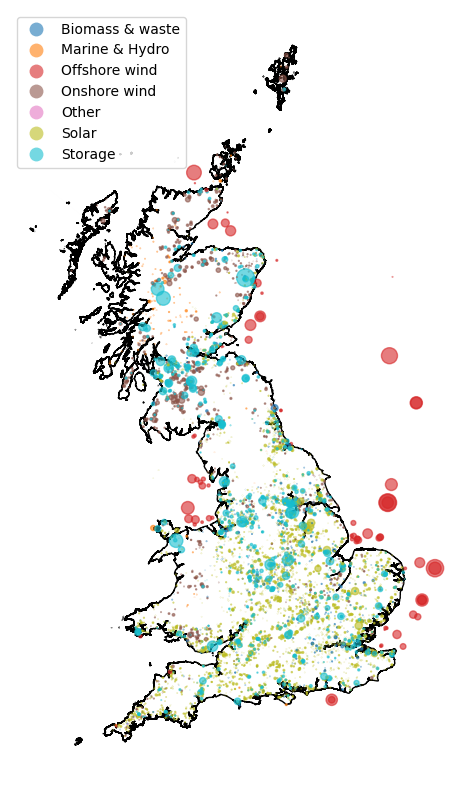

In [66]:
### Plot renewable capacity

fig, ax = plt.subplots(figsize=(10, 10))

# Plot UK boundary first (base layer)
gb_boundary.plot(ax=ax, color='white', edgecolor='black', linewidth=1)

# Plot renewable sites where colour shows technology type and size shows capacity.
repd_gpd_gb.plot(
    ax=ax,
    column='tech_group',
    legend=True,
    alpha=0.6,
    markersize=repd_gpd_gb['Installed Capacity (MWelec)'] / repd_gpd_gb['Installed Capacity (MWelec)'].max() * 200
    )

ax.axis('off')

plt.show()

In [67]:
# 7. Isolate wind sites
wind_tech = ['Onshore wind',
            'Offshore wind'
            ]

repd_wind = repd_gpd_gb[(repd_gpd_gb['tech_group'].isin(wind_tech))]

# Report removed datapoints
original = len(repd_gpd_gb)
new = len(repd_wind)
removed = original - new
pct = int((removed / original) * 100)

print(f'\n{removed} of {original} ({pct}%) sites removed; {original - removed} remaining')


6504 of 7496 (86%) sites removed; 992 remaining


In [68]:
repd_wind = repd_wind.copy()

repd_wind["x"] = repd_wind.geometry.x
repd_wind["y"] = repd_wind.geometry.y

In [69]:
repd_wind = repd_wind[
    repd_wind["Installed Capacity (MWelec)"].notna() &
    np.isfinite(repd_wind["Installed Capacity (MWelec)"]) &
    repd_wind["x"].notna() &
    repd_wind["y"].notna()
]

In [70]:
cut_off_cap = 20

repd_large_wind = repd_wind[(repd_wind['Installed Capacity (MWelec)'] >= cut_off_cap)]

# Report removed datapoints
original = len(repd_wind)
new = len(repd_large_wind)
removed = original - new
pct = int((removed / original) * 100)

print(f'\n{removed} of {original} ({pct}%) sites removed; {original - removed} remaining')


613 of 988 (62%) sites removed; 375 remaining


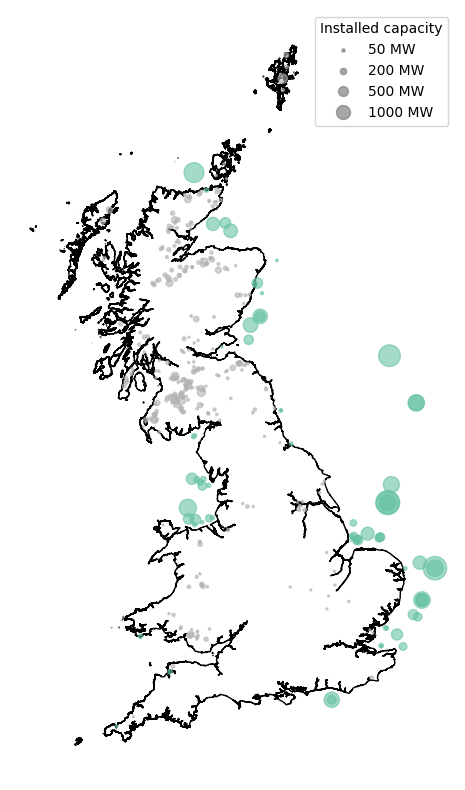

In [71]:
### Plot wind capacity

# Define marker sizes
max_cap = repd_large_wind["Installed Capacity (MWelec)"].max()
size_scale = 300

size_values = [50, 200, 500, 1000]  # MW

from matplotlib.lines import Line2D

size_handles = [
    Line2D(
        [], [],
        marker='o',
        linestyle='',
        color='grey',
        markersize=((v / max_cap) * size_scale) ** 0.5,  # sqrt for visual match
        label=f"{v} MW",
        alpha=0.7
    )
    for v in size_values
]

fig, ax = plt.subplots(figsize=(10, 10))

# Plot UK boundary first (base layer)
gb_boundary.plot(ax=ax, color='white', edgecolor='black', linewidth=1)

# Plot renewable sites where colour shows technology type and size shows capacity.
repd_large_wind.plot(
    ax=ax,
    column='tech_group',
    categorical=True,
    cmap='Set2',
    alpha=0.6,
    markersize=repd_large_wind['Installed Capacity (MWelec)'] / max_cap * size_scale
    )

# Add size legend
ax.legend(
    handles=size_handles,
    title="Installed capacity",
    loc="upper right"
)

ax.axis('off')

plt.show()

In [72]:
print(repd_large_wind["Installed Capacity (MWelec)"].min())

20.0


/Users/martinkelly/Documents/Coding/.venv/lib/python3.13/site-packages/geopandas/geodataframe.py:1896: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  result = super().__getitem__(key)


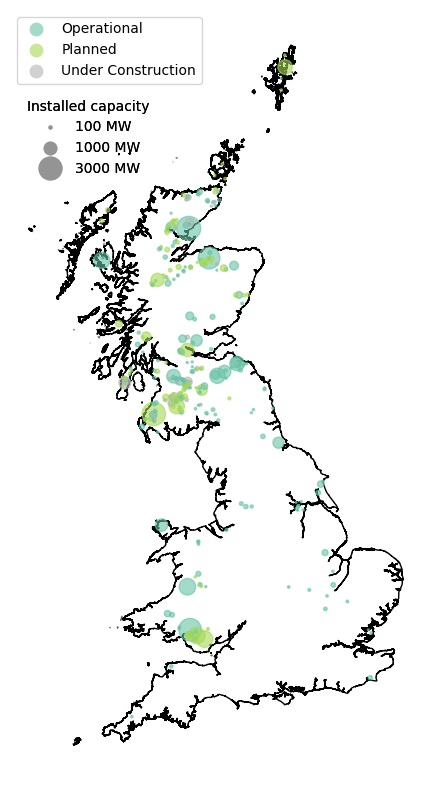

In [73]:
### Plot wind capacity

fig, ax = plt.subplots(figsize=(10, 10))

# Plot GB boundary
gb_boundary.plot(ax=ax, color='white', edgecolor='black', linewidth=1)

# Plot renewable sites where colour shows technology type and size shows capacity.
repd_large_wind[repd_wind['tech_group'] == 'Onshore wind'].plot(
    ax=ax,
    column='Development Status (short)',
    categorical=True,
    legend=True,
    cmap='Set2',
    alpha=0.6,
    markersize=repd_large_wind['Installed Capacity (MWelec)'] / max_cap * size_scale
    )

ax.axis('off')

status_legend = ax.get_legend()

capacity_levels = [100, 1000, 3000]

size_handles = [
    Line2D(
        [], [],
        marker='o',
        linestyle='None',
        markersize=(cap / max_cap * size_scale) ** 0.5,
        markerfacecolor='grey',
        markeredgecolor='none',
        alpha=0.6,
        label=f'{cap} MW'
    )
    for cap in capacity_levels
]

capacity_legend = ax.legend(
    handles=size_handles,
    title='Installed capacity',
    loc='upper left',
    bbox_to_anchor=(0.01, 0.9),  # x, y in axes fraction
    frameon=False
)

ax.add_artist(capacity_legend)
ax.add_artist(status_legend)

plt.show()

In [74]:
from scipy.stats import gaussian_kde
# Extract coordinates
x = repd_wind["x"].values
y = repd_wind["y"].values
weights = repd_wind["Installed Capacity (MWelec)"].values  # weight KDE by MW

# Compute KDE
kde = gaussian_kde(
    np.vstack([x, y]),
    weights=weights,
    bw_method=0.1  # smaller -> more localized peaks; larger -> smoother
)

# Define grid to evaluate KDE
padding_x = 100_000  # 200 km to left/right
xmin_wind, xmax_wind = x.min() - 10000, x.max() + 10000 + padding_x
ymin_wind, ymax_wind = y.min() - 10000, y.max() + 10000

xx, yy = np.mgrid[xmin_wind:xmax_wind:500j, ymin_wind:ymax_wind:500j]  # 500x500 grid
zz = kde(np.vstack([xx.ravel(), yy.ravel()])).reshape(xx.shape)

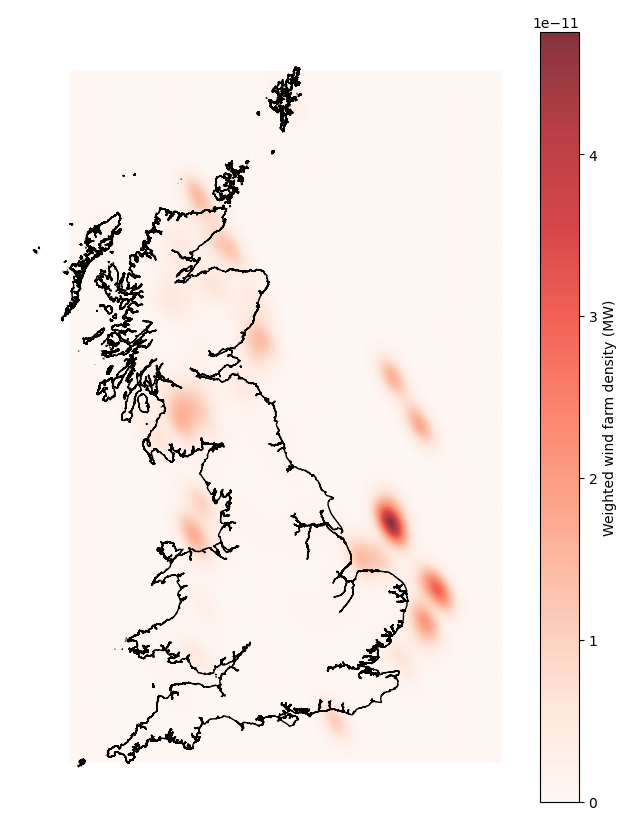

In [75]:
# Plot wind capacity
# Plot
fig, ax = plt.subplots(figsize=(10, 10))

im = ax.imshow(
    zz.T,  # transpose to match axis orientation
    origin='lower',
    extent=[xmin_wind, xmax_wind, ymin_wind, ymax_wind],
    cmap='Reds',
    alpha=0.8
)

plt.colorbar(im, ax=ax, label='Weighted wind farm density (MW)')

# Plot GB boundary
gb_boundary.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

ax.set_title(" ")
ax.axis('off')
plt.show()


In [76]:
# Isolate onshore sites for rasterisation
repd_onw = repd_wind[repd_wind['tech_group'] == 'Onshore wind']

In [77]:
# Plot existing ONW onto rasterised grid data
import rasterio
from rasterio import features
import xarray as xr

# Take reference from terrain_gb
ref_da = terrain_gb['altitude'].isel(band=0)  # shape (y, x)

height, width = ref_da.shape
x_coords_onw = ref_da['x'].values
y_coords_onw = ref_da['y'].values

# Affine transform based on the reference coordinates
pixel_size_x = x_coords_onw[1] - x_coords_onw[0]
pixel_size_y = abs(y_coords_onw[1] - y_coords_onw[0])  # y might decrease
x_min = x_coords_onw[0] - pixel_size_x / 2
y_max = y_coords_onw[0] + pixel_size_y / 2

transform = rasterio.transform.from_origin(
    west=x_min,
    north=y_max,
    xsize=pixel_size_x,
    ysize=pixel_size_y
)

# Rasterize ONW points using this grid
shapes = ((geom, cap) for geom, cap in zip(repd_onw.geometry, repd_onw['Installed Capacity (MWelec)']))

onw_capacity_raster = features.rasterize(
    shapes=shapes,
    out_shape=(height, width),
    transform=transform,
    all_touched=False,
    merge_alg=rasterio.enums.MergeAlg.add,
    dtype='float32'
)

# Build DataArray with the exact same coords as terrain_gb
onw_capacity_da = xr.DataArray(
    onw_capacity_raster,
    dims=('y', 'x'),
    coords={'y': y_coords_onw, 'x': x_coords_onw},
    name='existing_onw_mw'
)

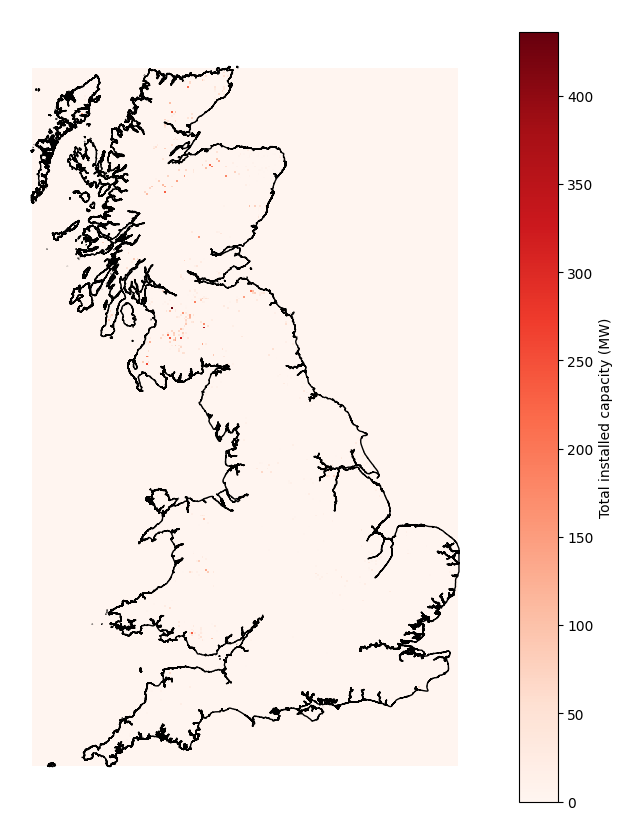

In [78]:
# plot onshore wind as raster

fig, ax = plt.subplots(figsize=(10, 10))
im = ax.imshow(
    np.flipud(onw_capacity_da.values),  # flip so y increases upward
    extent=[x_coords_onw.min(), x_coords_onw.max(), y_coords_onw.min(), y_coords_onw.max()],
    origin='lower',
    cmap='Reds',
    interpolation='nearest'
)
plt.colorbar(im, ax=ax, label='Total installed capacity (MW)')
ax.set_title('Wind Farm Capacity Raster (2.5 km grid)')

# Plot GB boundary
gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

ax.set_title(" ")
ax.axis('off')

plt.show()

In [79]:
# Distribute ONW across locations. Assume a max capacity of 62.5 MW per 25km square
mw_per_sq = 62.5

# Convert xarray to numpy for faster iteration
cap = onw_capacity_da.values.copy()

height, width = cap.shape

# Offsets to 8 neighbours (including diagonals)
neighbors = [(-1, -1), (-1, 0), (-1, 1),
             ( 0, -1),          ( 0, 1),
             ( 1, -1), ( 1, 0), ( 1, 1)]

changed = True
iteration = 0
while changed:
    changed = False
    iteration += 1
    # print(f"Iteration {iteration}")
    overflow_cells = np.argwhere(cap > mw_per_sq)
    
    for y, x in overflow_cells:
        overflow = cap[y, x] - mw_per_sq
        # Get valid neighbour coordinates
        valid_neighbors = [(y+dy, x+dx) for dy, dx in neighbors
                           if 0 <= y+dy < height and 0 <= x+dx < width]
        if not valid_neighbors:
            continue
        distribute = overflow / len(valid_neighbors)
        # Add portion to neighbours
        for ny, nx in valid_neighbors:
            cap[ny, nx] += distribute
        # Reduce current cell to max
        cap[y, x] = mw_per_sq
        changed = True

# Put back into xarray
onw_capacity_da_spread = xr.DataArray(
    cap,
    dims=('y', 'x'),
    coords={'y': onw_capacity_da['y'].values,
            'x': onw_capacity_da['x'].values},
    name='existing_onw_mw_spread'
)

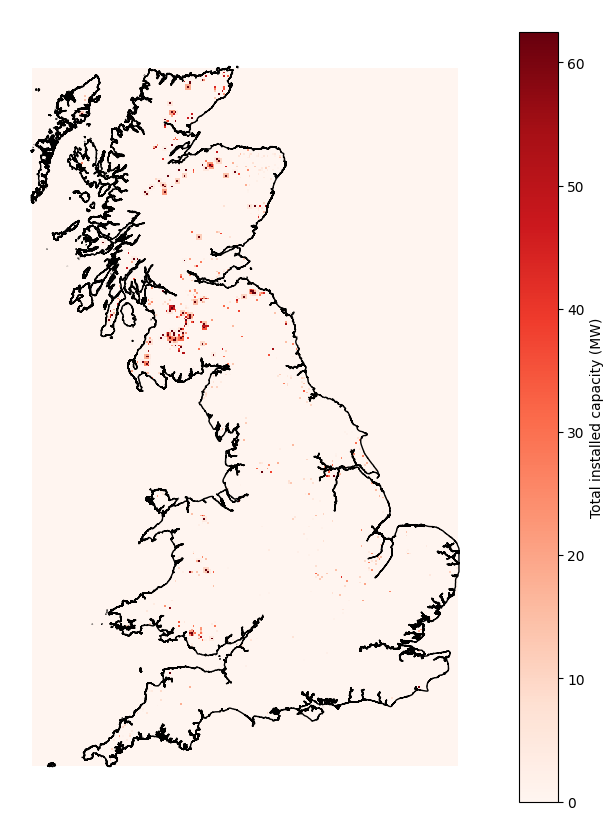

In [80]:
# plot onshore wind as raster

fig, ax = plt.subplots(figsize=(10, 10))
im = ax.imshow(
    np.flipud(onw_capacity_da_spread.values),  # flip so y increases upward
    extent=[x_coords_onw.min(), x_coords_onw.max(), y_coords_onw.min(), y_coords_onw.max()],
    origin='lower',
    cmap='Reds',
    interpolation='nearest'
)
plt.colorbar(im, ax=ax, label='Total installed capacity (MW)')
ax.set_title('Wind Farm Capacity Raster (2.5 km grid)')

# Plot GB boundary
gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

ax.set_title(" ")
ax.axis('off')

plt.show()

### Network data

In [81]:
# NGET data:
print(nget_cables.crs)
print(nget_substations.crs)
print(nget_oh_lines.crs)
print(nget_towers.crs)

EPSG:27700
EPSG:27700
EPSG:27700
EPSG:27700


In [82]:
nget_cables['OPERATING_'] = pd.to_numeric(nget_cables['OPERATING_'], errors='coerce')
nget_oh_lines['OPERATING_'] = pd.to_numeric(nget_oh_lines['OPERATING_'], errors='coerce')

In [83]:
# Remove non-transmission assets - cables
nget_cables_clean = nget_cables[
                                (nget_cables['CABLE_TYPE'] != 'DECOMMISSIONED') &
                                (nget_cables['OPERATING_'].isin([400, 275]))
                                ].reset_index(drop=True)

# Report removed datapoints
original = len(nget_cables)
new = len(nget_cables_clean)
removed = original - new
pct = int((removed / original) * 100)

print(f'\n{removed} of {original} ({pct}%) sites removed; {original - removed} remaining')


1339 of 3828 (34%) sites removed; 2489 remaining


In [84]:
# Remove non-transmission assets - lines
nget_lines_clean = nget_oh_lines[nget_oh_lines['OPERATING_'].isin([400, 275])].reset_index(drop=True)

# Report removed datapoints
original = len(nget_oh_lines)
new = len(nget_lines_clean)
removed = original - new
pct = int((removed / original) * 100)

print(f'\n{removed} of {original} ({pct}%) sites removed; {original - removed} remaining')


30 of 763 (3%) sites removed; 733 remaining


In [85]:
# Remove non-transmission assets - substations
nget_sub_clean = nget_substations[nget_substations['OPERATING_'].isin(['400kV', '275kV'])].reset_index(drop=True)

# Report removed datapoints
original = len(nget_substations)
new = len(nget_sub_clean)
removed = original - new
pct = int((removed / original) * 100)

print(f'\n{removed} of {original} ({pct}%) sites removed; {original - removed} remaining')


213 of 556 (38%) sites removed; 343 remaining


In [86]:
# Rename columns
nget_cables_clean = nget_cables_clean.rename(columns={'CABLE_ROUT':'name', 'OPERATING_': 'voltage'})
nget_lines_clean = nget_lines_clean.rename(columns={'CIRCUIT1':'name', 'OPERATING_': 'voltage'})
nget_sub_clean = nget_sub_clean.rename(columns={'Substation':'name', 'OPERATING_': 'voltage'})

In [87]:
# Trim off excess columns
nget_cables_trim = nget_cables_clean.loc[:,('name',
                                            'voltage',
                                            'geometry'    
                                        )]

nget_lines_trim = nget_lines_clean.loc[:,('name',
                                            'voltage',
                                            'geometry'    
                                        )]

nget_sub_trim = nget_sub_clean.loc[:,('name',
                                            'voltage',
                                            'geometry'    
                                        )]

In [88]:
# SSEN data:
print(ssen_substations.crs)
print(ssen_substations_super.crs)
print(ssen_oh_lines.crs)
print(ssen_oh_lines_super.crs)

EPSG:4326
EPSG:4326
EPSG:4326
EPSG:4326


In [89]:
# Update SSEN CRS
ssen_substations_bng = ssen_substations.to_crs(gb_boundary.crs)
ssen_substations_super_bng = ssen_substations_super.to_crs(gb_boundary.crs)
ssen_oh_lines_bng = ssen_oh_lines.to_crs(gb_boundary.crs)
ssen_oh_lines_super_bng = ssen_oh_lines_super.to_crs(gb_boundary.crs)

In [90]:
# Rename columns
ssen_substations_bng = ssen_substations_bng.rename(columns={'Name': 'name', 'Operating_V': 'voltage'})
ssen_substations_super_bng = ssen_substations_super_bng.rename(columns={'Name': 'name', 'Operating_V': 'voltage'})
ssen_oh_lines_bng = ssen_oh_lines_bng.rename(columns={'Operating_V': 'voltage'})
ssen_oh_lines_super_bng = ssen_oh_lines_super_bng.rename(columns={'Operating_V': 'voltage'})

In [91]:
# Trim off excess columns
ssen_sub_trim = ssen_substations_bng.loc[:,('name',
                                        'voltage',
                                        'geometry'    
                                        )]

ssen_super_sub_trim = ssen_substations_super_bng.loc[:,('name',
                                        'voltage',
                                        'geometry'    
                                        )]

ssen_oh_trim = ssen_oh_lines_bng.loc[:,('voltage',
                                            'geometry'    
                                        )]

ssen_lines_trim = ssen_oh_lines_super_bng.loc[:,('voltage',
                                            'geometry'    
                                        )]

In [92]:
# Transform scottish network data to BNG
scot_lines = gdf_lines.to_crs(gb_boundary.crs)
scot_substations = gdf_substations.to_crs(gb_boundary.crs)

In [93]:
print(f'{(scot_lines['operator']).unique()}\n')
print((scot_substations['operator']).unique())

['SP Energy Networks' None 'SSEN Transmission'
 'Scottish & Southern Energy' 'Scottish Hydro'
 'Scottish and Southern Electricity Networks' 'SP Transmission' 'SPN'
 'National Grid Electricity Transmission'
 'Scottish and Southern Electricity Networks (SSEN)' 'Mutual Energy'
 'SSE Power Distribution' 'SHETL' 'Scottish and Southern Energy'
 'Scottish Hydro Electric Transmission' 'SSEN' 'SSEN Distribution' 'SSE'
 'SHETL & SSED' 'Scottish Power' 'NGET']

[None 'Scottish Hydro Electric' 'Scottish hydro Electric'
 'Scottish and Southern Electricity Networks' 'Scottish Hydro-Electric'
 'SSE Power Distribution' 'Scottish Power' 'SP Energy Networks' 'SSE'
 'SSE Power Ditribution' 'Scottish Hydro' 'SP Distribution' 'NHS Highland'
 'Energetics Electricity' 'University of Edinburgh' 'gtc' 'Energetics'
 'Energy Assets Networks' 'SP Energy Distribution' 'gle' 'Network Rail'
 'Independent Power Networks Ltd' 'GTC' 'Scottish Power PLC' 'gte'
 'energetics electricity' 'energetics' 'SP Energy Network'
 

In [94]:
spen = ['Scottish Power' ,
    'SP Energy Networks',
    'Scottish Power PLC',
    'SP Energy Network',
    'S P Energy Networks',
    'SP energy Networks',
    'SP energy Networka',
    'Scottish Power Energy Network',
    'SP Energy',
    'SP Energy Networka',
    'SP Transmission',
    'SPN']

In [95]:
spen_substations = scot_substations[scot_substations['operator'].isin(spen)]

# Report removed datapoints
original = len(scot_substations)
new = len(spen_substations)
removed = original - new
pct = int((removed / original) * 100)

print(f'\n{removed} of {original} ({pct}%) sites removed; {original - removed} remaining')


4655 of 5709 (81%) sites removed; 1054 remaining


In [96]:
spen_lines = scot_lines[scot_lines['operator'].isin(spen)]

# Report removed datapoints
original = len(scot_lines)
new = len(spen_lines)
removed = original - new
pct = int((removed / original) * 100)

print(f'\n{removed} of {original} ({pct}%) sites removed; {original - removed} remaining')


2134 of 2389 (89%) sites removed; 255 remaining


In [97]:
spen_lines['voltage'].value_counts()

voltage
275000           111
400000            81
132000            48
400000;275000      9
33000              3
275000;0           1
0                  1
Name: count, dtype: int64

In [98]:
# Transmission voltages in Scotland are 132kV*, 275kV and 400kV
# https://www.ssen-transmission.co.uk/customer-connections-3/What_is_the_transmission_network/

print(f'{len(spen_substations)}\n')
print(spen_substations['voltage'].value_counts())

1054

voltage
11000                       23
275000                      19
132000                      18
33000                       17
33000;11000                 11
132000;33000                 8
275000;132000                5
275000;33000                 5
400000                       4
400000;132000                3
132000;33000;25000           3
400000;275000;132000         2
400000;132000;33000          2
275000;132000;33000          1
132000;33000;25000;11000     1
400000;33000                 1
525000                       1
400000;220000                1
11000;414                    1
13800;12300                  1
110000                       1
6600                         1
Name: count, dtype: int64


In [99]:
trans_volt = ['275000',
            '132000',
            '400000',
            '132000;33000',
            '275000;33000',
            '275000;132000',
            '132000;33000;25000',         
            '400000;132000;33000',       
            '400000;275000;132000',      
            '400000;132000',
            '275000;132000;33000',
            '132000;33000;25000;11000',
            '400000;33000',
            '400000;275000'
            ]

In [100]:
spen_trans_substations = spen_substations[spen_substations['voltage'].isin(trans_volt)]

# Report removed datapoints
original = len(spen_substations)
new = len(spen_trans_substations)
removed = original - new
pct = int((removed / original) * 100)

print(f'\n{removed} of {original} ({pct}%) sites removed; {original - removed} remaining')


982 of 1054 (93%) sites removed; 72 remaining


In [101]:
spen_trans_lines = spen_lines[spen_lines['voltage'].isin(trans_volt)]

# Report removed datapoints
original = len(spen_lines)
new = len(spen_trans_substations)
removed = original - new
pct = int((removed / original) * 100)

print(f'\n{removed} of {original} ({pct}%) sites removed; {original - removed} remaining')


183 of 255 (71%) sites removed; 72 remaining


In [102]:
# Trim off excess colummns
spen_lines_trim = spen_trans_lines.loc[:,('voltage',
                                            'geometry'    
                                        )]

spen_sub_trim = spen_trans_substations.loc[:,('voltage',
                                            'geometry'    
                                        )]

In [103]:
# Force all points to centroids to ensure rogue Shetland substation is removed
ssen_sub_trim["geometry"] = ssen_sub_trim.geometry.centroid
ssen_super_sub_trim["geometry"] = ssen_super_sub_trim.geometry.centroid
spen_sub_trim["geometry"] = spen_sub_trim.geometry.centroid
nget_sub_trim["geometry"] = nget_sub_trim.geometry.centroid

In [104]:
# Combine network dataframes
gb_lines = gpd.clip(pd.concat([nget_cables_trim,
              nget_lines_trim, 
              ssen_oh_trim, 
              ssen_lines_trim, 
              spen_lines_trim
              ]), clip_box)

gb_subs = gpd.clip(pd.concat([nget_sub_trim, 
              ssen_sub_trim, 
              ssen_super_sub_trim, 
              spen_sub_trim
              ]), clip_box)

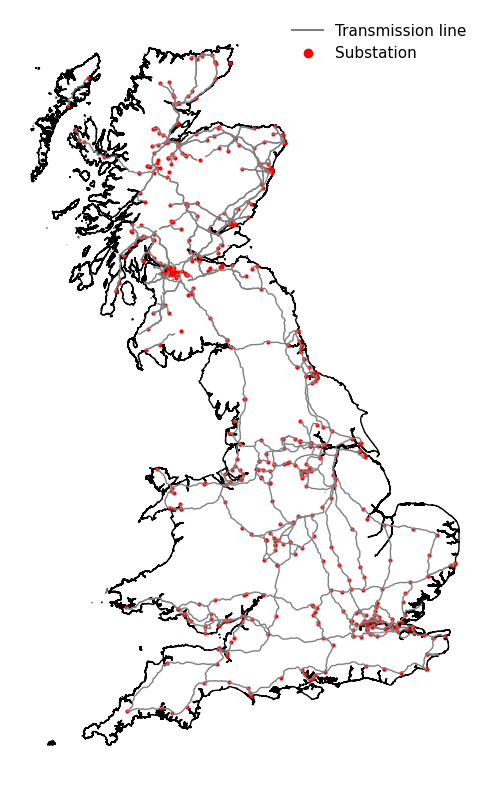

In [105]:
# Plot the network onto GB map

fig, ax = plt.subplots(figsize=(10, 10))

# Plot GB boundary & TNUoS Regions (base layer)
gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)
#tnuos_regions_bng.plot(ax=ax, color='none', edgecolor='blue', linewidth=0.5)

# Plot network onto map
gb_lines.plot(ax=ax, color='grey', edgecolor='grey', linewidth=1)
gb_subs.plot(ax=ax, color='red', edgecolor='red', markersize=4)

# Legends
line_handle = Line2D(
    [], [],
    color='grey',
    linewidth=1.5,
    label='Transmission line'
)

substation_handle = Line2D(
    [], [],
    marker='o',
    linestyle='None',
    markersize=6,
    markerfacecolor='red',
    markeredgecolor='red',
    label='Substation'
)

# Add legend
ax.legend(
    handles=[line_handle, substation_handle],
    loc='upper right',
    frameon=False,
    fontsize=11
)

ax.axis('off')

plt.show()


In [106]:
terrain_gb['slope'].max()

<xarray.DataArray 'slope' ()> Size: 4B
array(13.733116, dtype=float32)
Coordinates:
    spatial_ref  int64 8B 0

### Protected areas

In [107]:
green_belt_eng_bng = green_belt_eng.to_crs(gb_boundary.crs)
green_belt_sco_bng = green_belt_sco.to_crs(gb_boundary.crs)

# Merge & clip gdf
green_belt = gpd.clip(gpd.GeoDataFrame(pd.concat([green_belt_eng_bng, green_belt_sco_bng], ignore_index=True), crs=green_belt_sco_bng.crs), clip_box)

In [108]:
# Combine data; clip on mainland
sac_gb = gpd.sjoin(gpd.GeoDataFrame(pd.concat([sac_eng, sac_sco, sac_wal], ignore_index=True), crs=sac_eng.crs),
                      gb_boundary_clip, predicate='within')

spa_gb = gpd.sjoin(gpd.GeoDataFrame(pd.concat([spa_eng, spa_sco], ignore_index=True), crs=spa_eng.crs),
                      gb_boundary_clip, predicate='within')

nature_res_gb = gpd.sjoin(gpd.GeoDataFrame(pd.concat([nature_res_eng, nature_res_sco, nature_res_sco], ignore_index=True), crs=nature_res_eng.crs),
                      gb_boundary_clip, predicate='within')

aonb_gb = gpd.clip(gpd.GeoDataFrame(pd.concat([eng_aonb, sco_aonb, wal_aonb], ignore_index=True), crs=eng_aonb.crs), clip_box)

sssi_gb = gpd.clip(gpd.GeoDataFrame(pd.concat([sssi_eng, sssi_sco, sssi_wal], ignore_index=True), crs=sssi_eng.crs), clip_box)

np_gb = gpd.GeoDataFrame(pd.concat([np_eng, np_sco_1, np_sco_2, np_wal], ignore_index=True), crs=np_eng.crs)

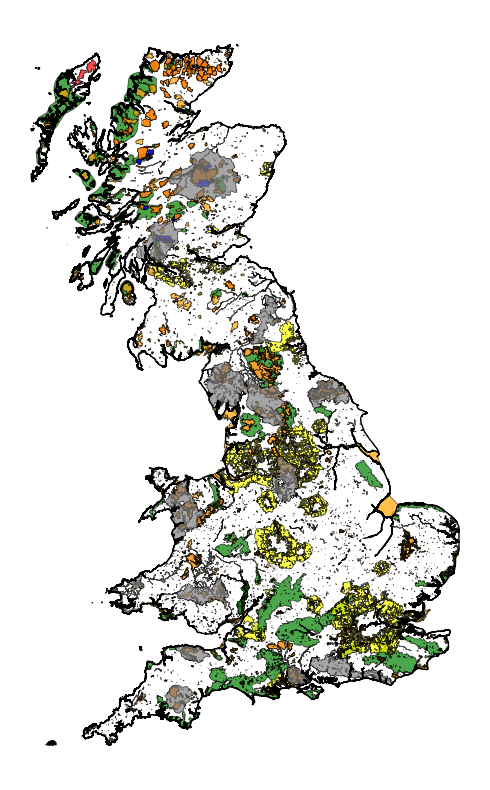

In [109]:
fig, ax = plt.subplots(figsize=(10, 10))

# Plot various environmental regions - hard & soft boundaries for new ONW farms.
aonb_gb.plot(ax=ax, color='green', edgecolor='black', linewidth=0.5, alpha=0.7)

green_belt.plot(ax=ax, color='yellow', edgecolor='black', linewidth=0.5, alpha=0.7)

nature_res_gb.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.5, alpha=0.7)

sac_gb.plot(ax=ax, color='red', edgecolor='black', linewidth=0.5, alpha=0.7)

spa_gb.plot(ax=ax, color='pink', edgecolor='black', linewidth=0.5, alpha=0.7)

sssi_gb.plot(ax=ax, color='orange', edgecolor='black', linewidth=0.5, alpha=0.7)

np_gb.plot(ax=ax, color='grey', edgecolor='black', linewidth=0.5, alpha=0.7)

# Other restrictions
#water_clip.plot(ax=ax, color='blue', edgecolor='blue', linewidth=0.05)
#gb_roads_bng.plot(ax=ax, color='grey', edgecolor='grey', linewidth=0.05)

#urban_gb.plot(ax=ax, color='none', edgecolor='grey', linewidth=0.5, alpha=0.7)

gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

ax.axis('off')

plt.show()


In [110]:
# # Concatinate protected landscapes
# protected_land_temp = gpd.GeoDataFrame(pd.concat([aonb_gb,
#                                                    green_belt, 
#                                                    nature_res_gb,
#                                                    sac_gb,
#                                                    spa_gb,
#                                                    sssi_gb,
#                                                    np_gb, 
#                                                    ], ignore_index=True), crs=np_eng.crs)

# protected_land_map = gpd.GeoDataFrame(
#     geometry=[protected_land_temp.union_all()],
#     crs="EPSG:27700"
# )

In [111]:
# protected_land_map.to_file(data_folder+"protected_land_map.gpkg", driver="GPKG")

In [114]:
protected_land_map = gpd.read_file(data_folder+"protected_land_map.gpkg")

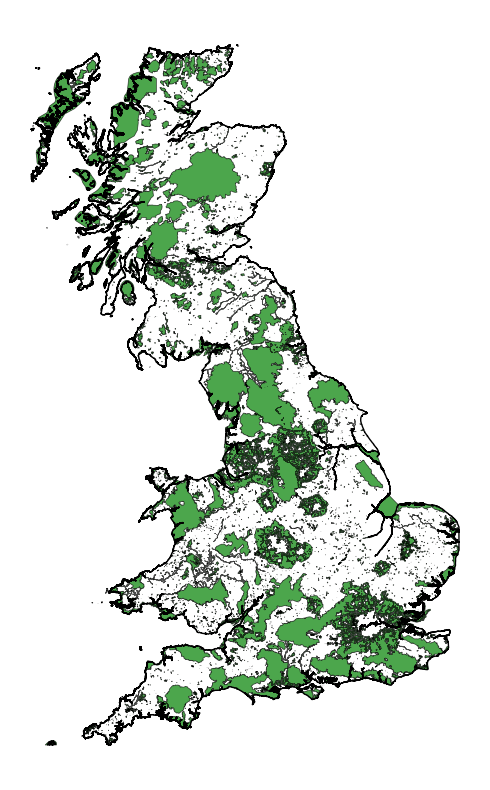

In [115]:
# Map all protected landscapes
fig, ax = plt.subplots(figsize=(10, 10))

# Plot various environmental regions - hard & soft boundaries for new ONW farms.
protected_land_map.plot(ax=ax, color='green', edgecolor='black', linewidth=0.5, alpha=0.7)

gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

ax.axis('off')

plt.show()

### Wind speed

In [116]:
print(wind_speed)

<xarray.Dataset> Size: 987kB
Dimensions:      (season: 4, y: 235, x: 131)
Coordinates:
  * season       (season) object 32B 'spring' 'summer' 'autumn' 'winter'
  * y            (y) int32 940B 12500 17500 22500 ... 1172500 1177500 1182500
  * x            (x) int32 524B 2500 7500 12500 17500 ... 642500 647500 652500
Data variables:
    wind_speed   (season, y, x) float64 985kB ...
    spatial_ref  int32 4B ...


In [117]:
wind_speed.wind_speed.rio.crs
wind_speed_bng = wind_speed.rio.write_crs(27700)

In [118]:
# Limit wind speed data to GB
wind_speed_gb = wind_speed_bng.rio.clip(
    gb_boundary_clip.geometry,
    gb_boundary_clip.crs,
    drop=True
)

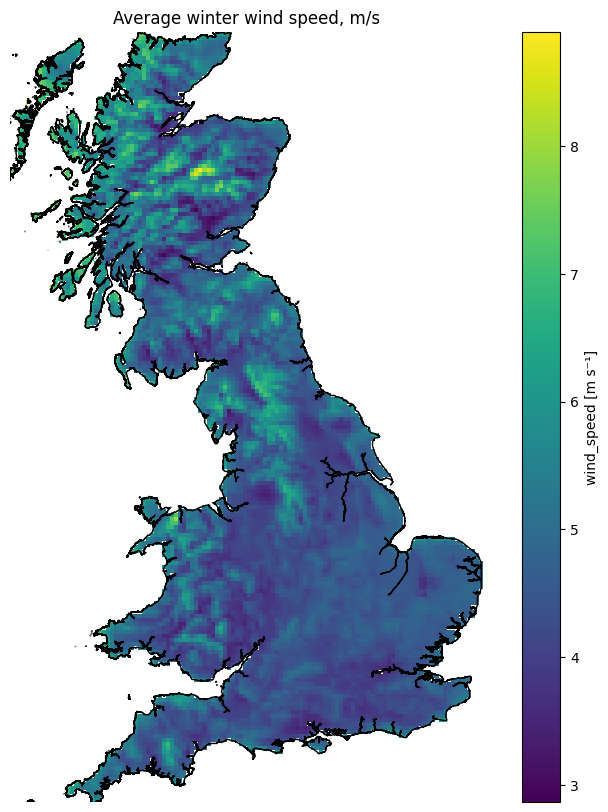

In [119]:
# Plot wind speed onto GB map

fig, ax = plt.subplots(figsize=(10, 10))

# Plot wind speeds onto map
wind_speed_gb['wind_speed'].sel(season='winter').plot(
    ax=ax, 
    alpha=1)

# Plot GB boundary
gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

ax.set_title("Average winter wind speed, m/s")
ax.axis('off')

plt.show()


In [120]:
# Converting wind speed to power

def calc_turbine_speed(speed, turbine_height=70, data_height=10, hellman_exponent=1/7):
    turbine_speed = speed * (turbine_height / data_height) ** hellman_exponent
    return turbine_speed

# Discrete power curve: for wind speeds 0 to 24 m/s
power_curve = np.array([
    0, 0, 0, 102, 257, 471, 750, 1194, 1713, 2227, 2465, 2500,
    2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2500, 2400, 2250        # Max of 2,500 suggests a 2.5 MW turbine
])

wind_speeds = np.arange(0, 25)

def speed_to_power(speed_array):
    speed_array = np.clip(speed_array, 0, 24)  # avoid out-of-bounds
    return np.interp(speed_array, wind_speeds, power_curve)

In [121]:
wind = wind_speed_gb["wind_speed"] 

turbine_speed = xr.apply_ufunc(
    calc_turbine_speed,
    wind,
    vectorize=True,
    dask="parallelized",
    output_dtypes=[float],
)

power = xr.apply_ufunc(
    speed_to_power,
    turbine_speed,
    vectorize=True,
    dask="parallelized",
    output_dtypes=[float],
)

wind_speed_gb["turbine_speed"] = turbine_speed
wind_speed_gb["power"] = power


In [122]:
hr_per_year = 8760
hr_per_season = hr_per_year / 4

wind_speed_gb['generation (MWh)'] = wind_speed_gb["power"] * hr_per_season * 1e-3
wind_speed_gb['Annual generation (MWh)'] = wind_speed_gb['generation (MWh)'].sum(dim="season", skipna=False)

In [123]:
# Estimate load factor
turbine_capacity_kw = power_curve.max()    
wind_speed_gb['load_factor_pct'] = wind_speed_gb['Annual generation (MWh)'] / (turbine_capacity_kw*1e-3 * hr_per_year)

### Roads (Can take 2 hrs first time; 5 mins later)

In [124]:
# # Re-download roads, now with the complete TNUoS GDF.

# # Road types to filter for
# custom_filter = ('["highway"~"motorway|trunk|primary|secondary"]')

# # List to store road maps in
# edges_list = []

# # Create a road map for each TNUoS region; skip any region where the mapping fails.
# for i in range(len(tnuos_regions_full)):
#     poly = tnuos_regions_full.geometry.iloc[i]

#     try:
#         G = ox.graph_from_polygon(
#             poly,
#             custom_filter=custom_filter,
#             simplify=True
#         )

#         # Convert graph to GeoDataFrame
#         edges = ox.graph_to_gdfs(
#             G,
#             nodes=False,
#             edges=True
#         )

#         edges["tnuos_id"] = i
#         edges_list.append(edges)

#         print(f"Region {i}: {len(edges)} road segments")

#     except Exception as e:
#         print(f"Region {i}: skipped ({e})")

# # Combine the maps
# gb_roads = gpd.GeoDataFrame(pd.concat(edges_list), crs="EPSG:4326")

In [125]:
# # Convert to BNG & save
# gb_roads.to_crs(epsg=27700).to_file(data_folder+"gb_roads.geojson", driver="GeoJSON")

In [126]:
# Load road network data
gb_roads = gpd.read_file(data_folder+"gb_roads.geojson")

Skipping field highway: unsupported OGR type: 5
Skipping field lanes: unsupported OGR type: 5
Skipping field maxspeed: unsupported OGR type: 5
Skipping field name: unsupported OGR type: 5
Skipping field ref: unsupported OGR type: 5
Skipping field width: unsupported OGR type: 5
Skipping field bridge: unsupported OGR type: 5
Skipping field junction: unsupported OGR type: 5
Skipping field tunnel: unsupported OGR type: 5
Skipping field est_width: unsupported OGR type: 5


In [127]:
gb_roads_bng = gb_roads.to_crs(epsg=27700)

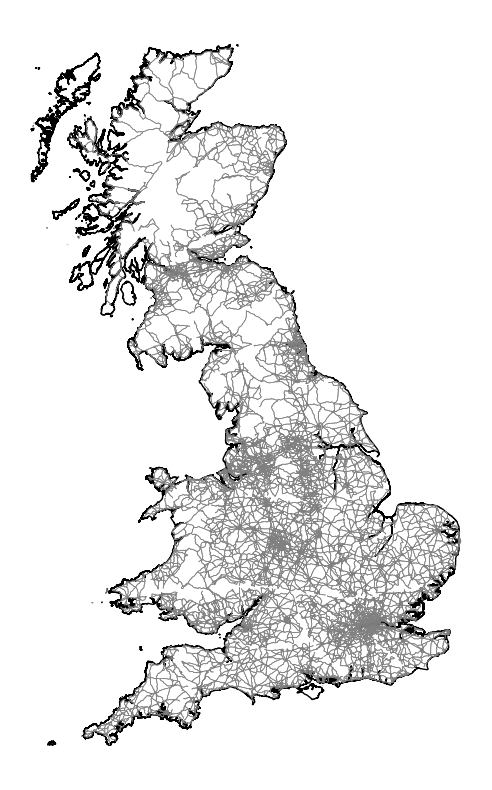

In [128]:
fig, ax = plt.subplots(figsize=(10, 10))

# Plot UK boundary & TNUoS Regions (base layer)
gb_roads_bng.plot(ax=ax, color='grey', edgecolor='grey', linewidth=0.5)
gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

ax.axis('off')

plt.show()

### Land cover

In [129]:
land_cover.head()

,OBJECTID_1,OBJECTID,Shape_Leng,ID,CODE_18,Area_Ha,Remark,Shape_Le_1,Shape_Le_2,Shape_Area,geometry
0,1,1,7807.997385,UK_NI_1,111,131.592175,None,0.0,7810.783783,1.316863e+06,"POLYGON ((111448.207 466362.314, 111494.532 46..."
1,2,2,6502.250189,UK_NI_2,111,134.987620,None,0.0,6504.302749,1.350728e+06,"POLYGON ((116313.965 484902.688, 116521.412 48..."
2,3,3,4333.745738,UK_NI_3,111,58.133906,None,0.0,4338.561321,5.826322e+05,"POLYGON ((33988.771 509071.806, 34086.102 5089..."
3,4,4,3384.272198,UK_NI_4,111,33.951014,None,0.0,3385.964864,3.398497e+05,"POLYGON ((97769.485 504753.73, 97818.093 50461..."
4,5,5,3982.899430,UK_NI_5,111,65.438749,None,0.0,3984.363556,6.548683e+05,"POLYGON ((112056.756 512813.54, 112065.77 5127..."


In [130]:
### TAKES 3 HOURS
# # Clip terrain map to GB. First need to 'explode' the geometries so NI terrain is listed seperately to GB terrain
# land_cover_temp = land_cover.explode(ignore_index=True)
# # Then clip...
# land_cover_gb_temp = gpd.clip(land_cover_temp, gb_boundary_clip)
# # Then re-dissolve
# land_cover_gb = land_cover_gb_temp.dissolve(
#     by="CODE_18",
#     as_index=False
# )

In [131]:
# land_cover_gb.to_crs(epsg=27700).to_file(data_folder+"land_cover_gb.gpkg", driver="GPKG")

In [132]:
land_cover_gb = gpd.read_file(data_folder+"land_cover_gb.gpkg")


In [133]:
# Add names to land_cover terrain types. First ensure the columns to merge on are of the same type:
land_cover_gb["CODE_18"] = land_cover_gb["CODE_18"].astype(str)
corine_df["CODE_18"] = corine_df["CODE_18"].astype(str)

land_cover_gb = land_cover_gb.merge(
    corine_df,
    on="CODE_18",
    how="left"
)

In [134]:
## Add 'values' to each land cover type
# Feloni & Karandinaki (2021); Ecology by design informed values for wetlands
# CORINE land cover weights by 3-digit code.
corine_weights = {
    "111": 0.0,  # Continuous urban fabric
    "112": 0.0,  # Discontinuous urban fabric
    "121": 0.0,  # Industrial or commercial units
    "122": 0.0,  # Road and rail networks and associated land
    "123": 0.0,  # Port areas
    "124": 0.0,  # Airports
    "131": 0.0,  # Mineral extraction sites
    "132": 0.4,  # Dump sites
    "133": 0.0,  # Construction sites
    "142": 0.0,  # Sport and leisure facilities

    "211": 0.4,  # Non-irrigated arable land
    "212": 0.4,  # Permanently irrigated land
    "221": 0.4,  # Vineyards
    "222": 0.4,  # Fruit trees and berry plantations
    "223": 0.4,  # Olive groves
    "231": 0.4,  # Pastures
    "242": 0.4,  # Complex cultivation patterns
    "243": 0.4,  # Land principally occupied by agriculture with natural vegetation

    "311": 0.0,  # Broad-leaved forest
    "312": 0.0,  # Coniferous forests
    "313": 0.0,  # Mixed forest

    "321": 1.0,  # Natural grassland
    "322": 0.9,  # Moors and heathland
    "323": 1.0,  # Sclerophyllous vegetation
    "324": 0.5,  # Transitional woodland/shrub

    "331": 0.0,  # Beaches, dunes, sands
    "332": 0.9,  # Bare rock
    "333": 0.9,  # Sparsely vegetated areas
    "334": 0.0,  # Burnt areas

# https://www.ecologybydesign.co.uk/ecology-resources/wind-farms-site-selection-best-practice-guidance#:~:text=Ancient%20woodlands:%20These%20are%20woodlands,a%20range%20of%20specialized%20species.
    "411": 0.0,  # Inland marshes
    "412": 0.0,  # Peat bogs

    "421": 0.0,  # Salt amrshes
    "422": 0.0,  # Salines
    "423": 0.0,  # Intertidal flats

    "512": 0.0,  # Water bodies
    "522": 0.0,  # Estuaries
    "523": 0.0   # Sea and ocean
}

In [135]:
# Map land cover wieghts noto land_cover gdf
land_cover_gb["corine_weight"] = land_cover_gb["CODE_18"].map(corine_weights)

In [136]:
# Set colour scheme within 1st level names
level1_colors = (
    land_cover_gb
    .drop_duplicates("level1_name")
    .set_index("level1_name")["plot_color"]
    .to_dict()
)

level2_colors = (
    land_cover_gb
    .drop_duplicates("level2_name")
    .set_index("level2_name")["plot_color"]
    .to_dict()
)

level3_colors = (
    land_cover_gb
    .drop_duplicates("level3_name")
    .set_index("level3_name")["plot_color"]
    .to_dict()
)

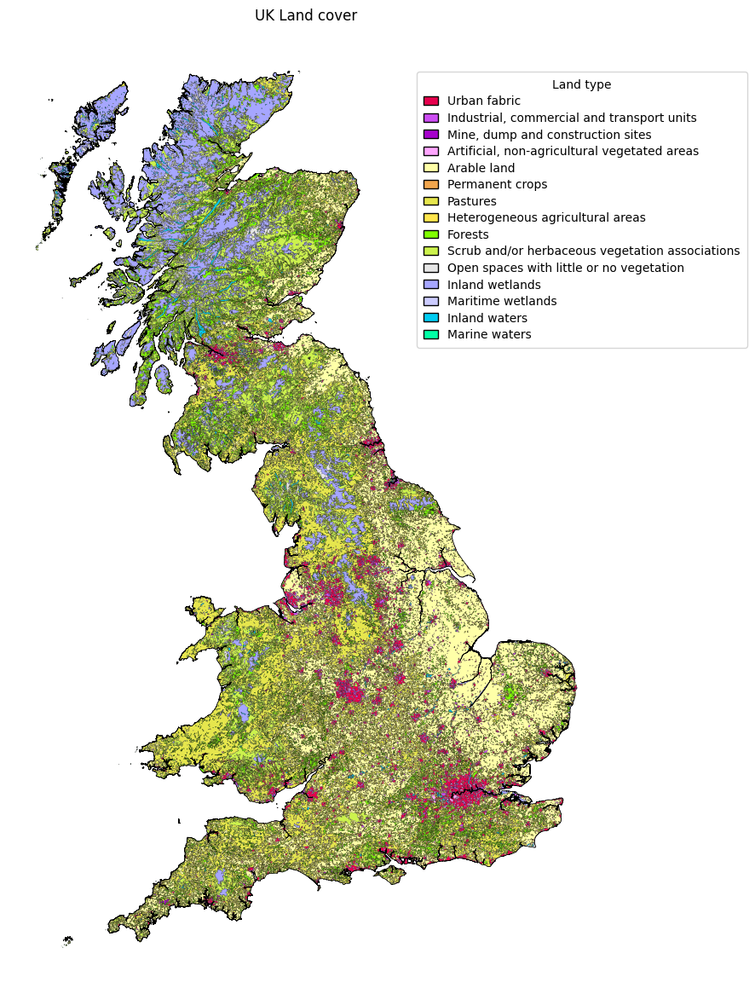

In [137]:
# Map land cover
from matplotlib.patches import Patch
fig, ax = plt.subplots(figsize=(12,12))

land_cover_gb.plot(
    ax=ax,
#    color=land_cover_gb["level1_name"].map(level1_colors),
    color=land_cover_gb["level2_name"].map(level2_colors),
#    color=land_cover_gb["level3_name"].map(level3_colors),
    linewidth=0.1,
    edgecolor="black"
)

legend_elements = [
    Patch(
#        facecolor=level1_colors[name],
        facecolor=level2_colors[name],
#        facecolor=level3_colors[name],
        edgecolor="black",
        label=name
    )
#    for name in level1_colors
    for name in level2_colors
#    for name in level3_colors
]

ax.legend(
    handles=legend_elements,
    title="Land type",
    loc="upper right",
    bbox_to_anchor=(1.25, 0.96),
    frameon=True,
    labelspacing=0.4,
    handlelength=1.2,
    borderpad=0.6
)

plt.tight_layout(rect=[0, 0, 0.85, 1])

gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=0.5)

ax.set_title("UK Land cover")
ax.axis('off')
plt.show()


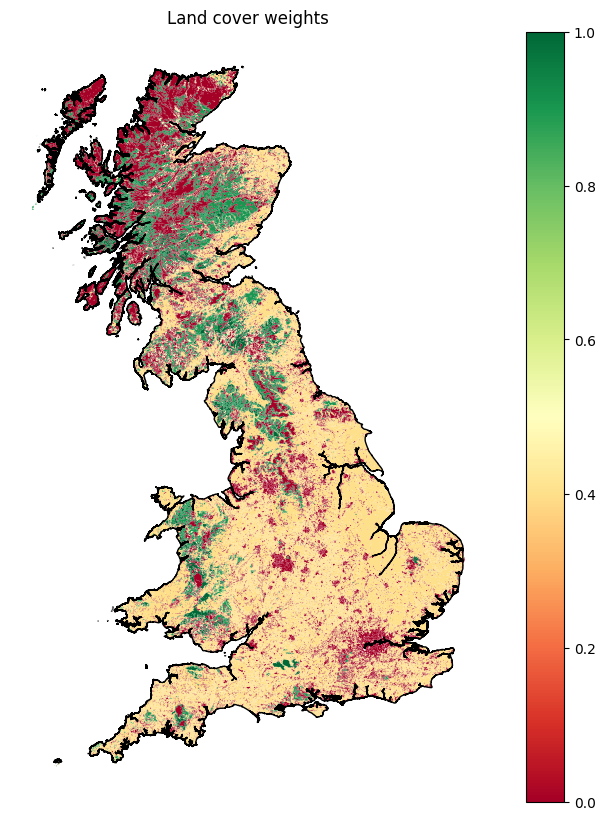

In [138]:
# Plot land cover weights

fig, ax = plt.subplots(figsize=(10, 10))

land_cover_no_sea = land_cover_gb[land_cover_gb['CODE_18'] != '523']

# Plot wind speeds onto map
land_cover_no_sea.plot(
    column='corine_weight',
    ax=ax,
    cmap='RdYlGn',    
    legend=True,
    linewidth=0,
    alpha=1)

# Plot GB boundary
gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

ax.set_title("Land cover weights")
ax.axis('off')

plt.show()

#### Excluded land

In [139]:
# Excluded terrains:
excluded_land = land_cover_gb[land_cover_gb['corine_weight']==0]

In [140]:
level2_colors_excluded = (
    excluded_land
    .drop_duplicates("level2_name")
    .set_index("level2_name")["plot_color"]
    .to_dict()
)

level3_colors_excluded = (
    excluded_land
    .drop_duplicates("level3_name")
    .set_index("level3_name")["plot_color"]
    .to_dict()
)

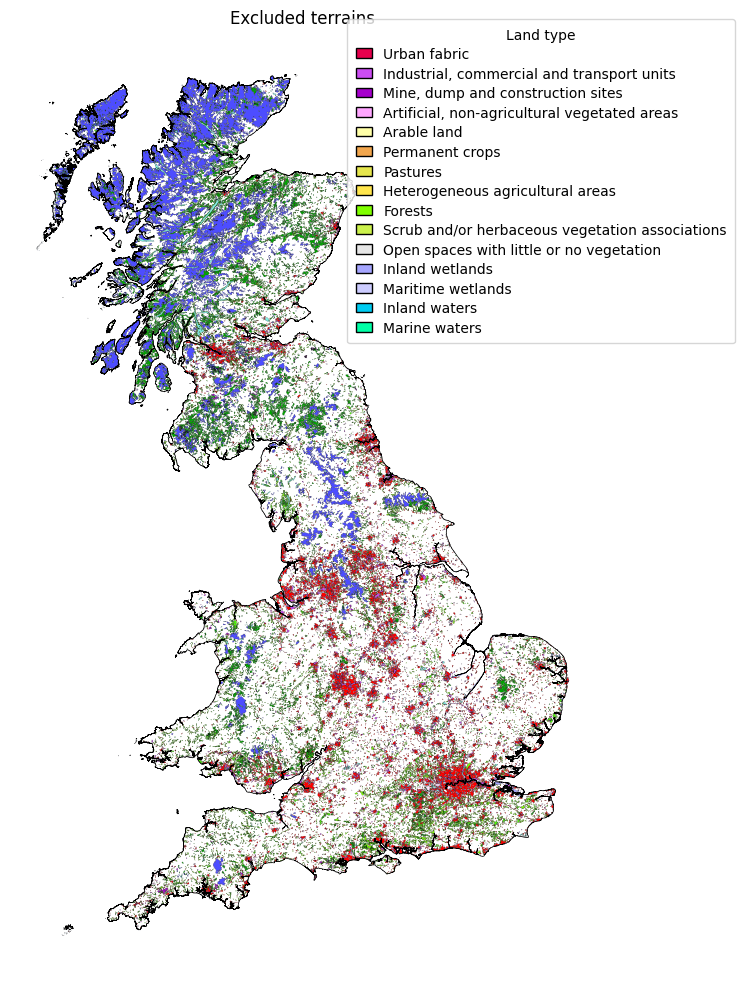

In [141]:
# Map excluded terrains
mask = excluded_land["level3_name"].isin(level3_colors_excluded.keys())
excluded_to_plot = excluded_land[mask]
fig, ax = plt.subplots(figsize=(10, 10))

# Map excluded terrains
excluded_to_plot.plot(
    ax=ax,
    color=excluded_to_plot["level3_name"].map(level3_colors_excluded),
    linewidth=0.1,
    edgecolor="black"
)

ax.legend(
    handles=legend_elements,
    title="Land type",
    loc="upper right",
    bbox_to_anchor=(1.25, 1.02),
    frameon=True,
    labelspacing=0.4,
    handlelength=1.2,
    borderpad=0.6
)

# GB boundary on top
gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=0.5)

ax.set_title("Excluded terrains")
ax.axis('off')
plt.tight_layout()
plt.show()


# 4. Prepare raster data

### 4.1 Rasterise infrastructure data

#### Connection cost - DO NOT RUN UNLESS FILE IMPORT FAILS

In [45]:
grid_gdf_clip = gpd.read_file(data_folder+"grid_gdf_clip.geojson")

In [143]:
# # 12 SECONDS ---- ### DISTANCE FROM NETWORK / ROADS ###

# # Plot grid across GB

# from shapely.geometry import Point

# # Define grid spacing 
# spacing = 1000 # meters

# # Set bounds
# minx, miny, maxx, maxy = gb_boundary.total_bounds

# # Generate grid points
# x_coords = np.arange(minx, maxx, spacing)
# y_coords = np.arange(miny, maxy, spacing)
# grid_points = [Point(x, y) for x in x_coords for y in y_coords]

# # Make GeoDataFrame and clip to GB
# grid_gdf = gpd.GeoDataFrame(geometry=grid_points, crs=gb_boundary.crs)
# grid_gdf_clip = gpd.clip(grid_gdf, tnuos_regions_union)

In [144]:
# # Distance from substation

# grid_gdf['dist_to_substation_m'] = grid_gdf_clip.geometry.apply(
#     lambda x: gb_subs_pt.distance(x).min()
# )

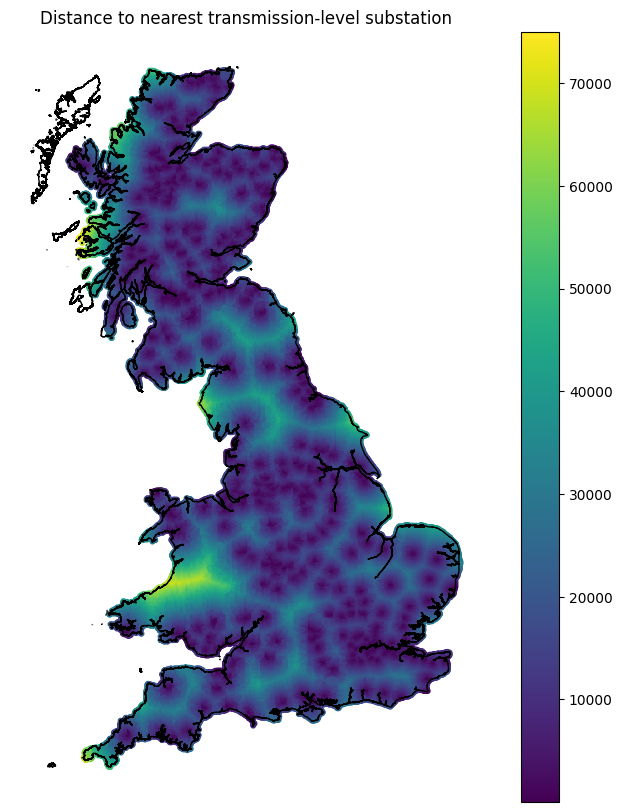

In [145]:
fig, ax = plt.subplots(figsize=(10, 10))

# Plot grid colored by distance
m = grid_gdf_clip.plot(
    ax=ax,
    column='dist_to_substation_m',
    cmap='viridis',
    markersize=10,
    legend=True
)

# GB boundary
gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

ax.set_title("Distance to nearest transmission-level substation")
# m.colorbar.set_label('Distance, meters')
ax.axis('off')
plt.show()

In [146]:
# # Distance from elec lines
# grid_gdf_clip['dist_to_line_m'] = grid_gdf_clip.geometry.apply(
#     lambda x: gb_lines.distance(x).min()
# )

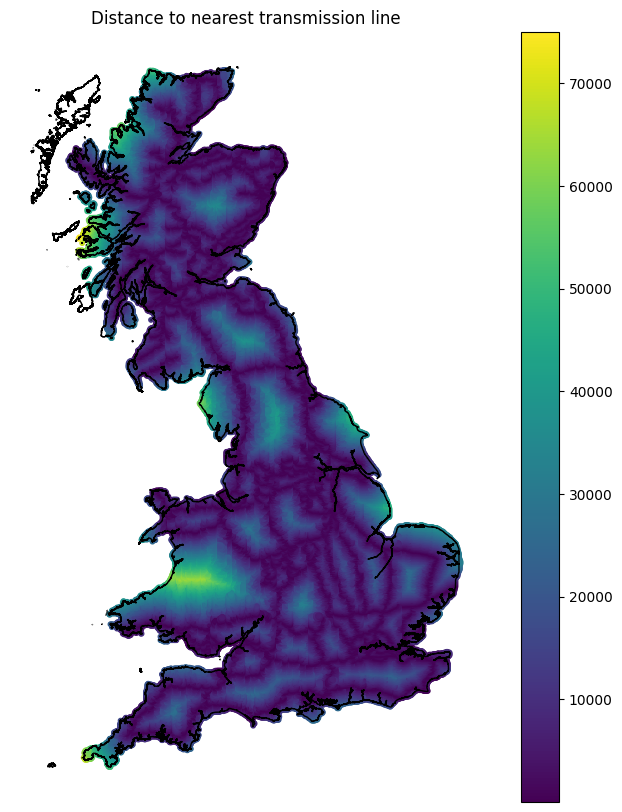

In [147]:
fig, ax = plt.subplots(figsize=(10, 10))

# Plot grid colored by distance
m = grid_gdf_clip.plot(
    ax=ax,
    column='dist_to_line_m',
    cmap='viridis',
    markersize=10,
    legend=True,
    #norm=LogNorm(vmin=1, vmax=grid_gdf["dist_to_line_m"].max())
)

# GB boundary
gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

ax.set_title("Distance to nearest transmission line")
# m.colorbar.set_label('Distance, meters')
ax.axis('off')
plt.show()

#### Distance from roads

In [148]:
# # Distance from roads lines (3 hrs)
# grid_gdf_clip['dist_to_road_m'] = grid_gdf_clip.geometry.apply(
#     lambda x: gb_roads_bng.distance(x).min()
# )

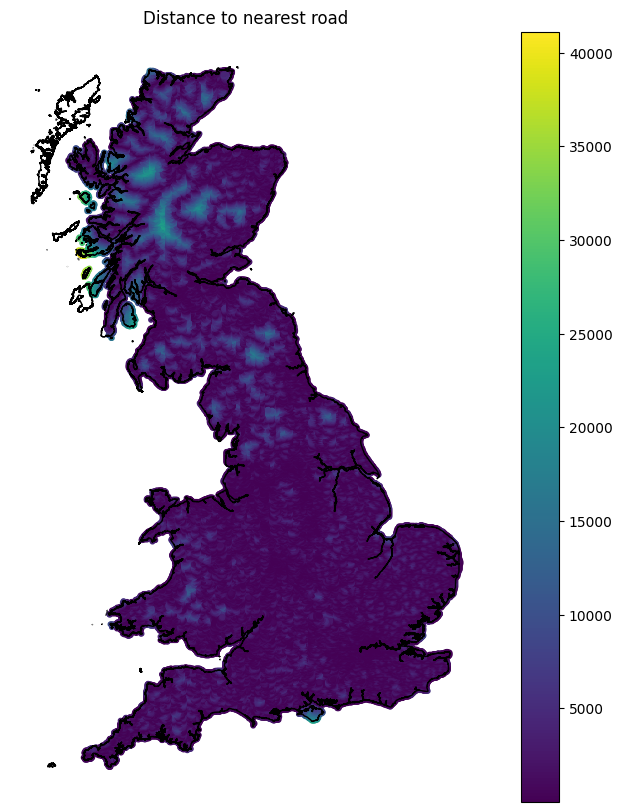

In [149]:
fig, ax = plt.subplots(figsize=(10, 10))

# Plot grid colored by distance
m = grid_gdf_clip.plot(
    ax=ax,
    column='dist_to_road_m',
    cmap='viridis',
    markersize=10,
    legend=True
)

# GB boundary
gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

ax.set_title("Distance to nearest road")
# m.colorbar.set_label('Distance, meters')
ax.axis('off')
plt.show()

In [150]:
grid_gdf_clip.to_file(data_folder+"grid_gdf_clip.geojson", driver="GeoJSON")

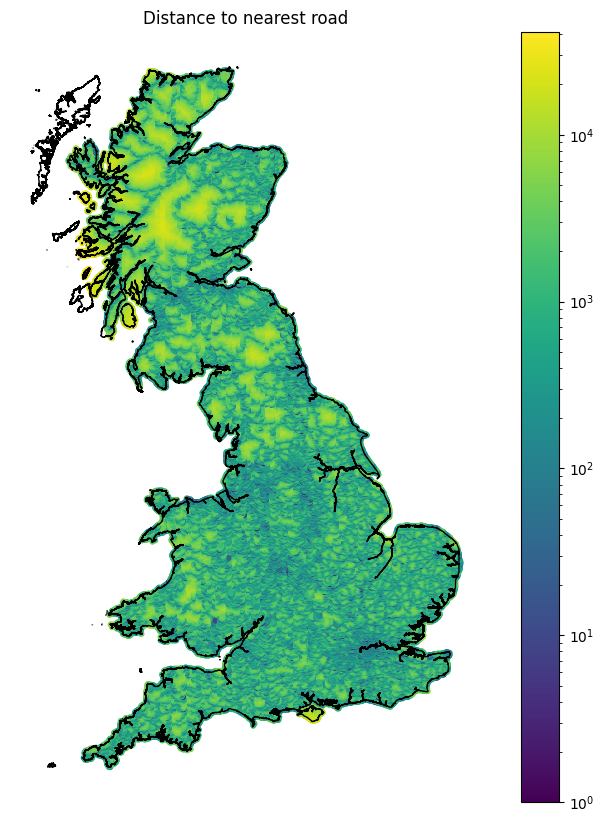

In [151]:
from matplotlib.colors import LogNorm

fig, ax = plt.subplots(figsize=(10, 10))

# Plot grid colored by distance
m = grid_gdf_clip.plot(
    ax=ax,
    column="dist_to_road_m",
    cmap="viridis",
    markersize=10,
    legend=True,
    norm=LogNorm(vmin=1, vmax=grid_gdf_clip["dist_to_road_m"].max())
)

# GB boundary
gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

ax.set_title("Distance to nearest road")
# m.colorbar.set_label('Distance, meters')
ax.axis('off')
plt.show()

### 4.2 TNUoS Charges

In [152]:
# This section creates a TNUoS charges xarray. It first links each point in wind_speed_gb to a TNUoS region.
xs = wind_speed_gb["x"].values
ys = wind_speed_gb["y"].values

In [153]:
from rasterio.features import rasterize
import numpy as np

# 1. Rasterise TNUoS polygons

# Grid shape & transform
grid_shape = wind_speed_gb['load_factor_pct'].shape  # (y, x)
grid_transform = wind_speed_gb.rio.transform()

# Rasterize polygons by ID
shapes = ((geom, val) for geom, val in zip(tnuos_regions_bng.geometry, tnuos_regions_bng.id))
tnuos_zone_raster = rasterize(
    shapes,
    out_shape=grid_shape,
    transform=grid_transform,
    fill=0,        # 0 = no zone
    dtype='int32'
)

# Add to wind grid
wind_speed_gb['tnuos_zone'] = (('y','x'), tnuos_zone_raster)

In [154]:
# 2. Map TNUoS tariffs to zone
shared_dict = tnuos_regions_bng.set_index('id')['Shared Year Round Tariff'].to_dict()
not_shared_dict = tnuos_regions_bng.set_index('id')['Not Shared Year Round Tariff'].to_dict()
adjust_dict = tnuos_regions_bng.set_index('id')['Adjustment Tariff'].to_dict()

# Vectorized mapping function
vector_map = np.vectorize(lambda x, d: d.get(x, np.nan))

# Wrap as DataArray with dims matching wind_speed_gb
tnuos_shared_da = xr.DataArray(
    vector_map(wind_speed_gb['tnuos_zone'].values, shared_dict),
    dims=wind_speed_gb['tnuos_zone'].dims,
    coords=wind_speed_gb['tnuos_zone'].coords
)
tnuos_not_shared_da = xr.DataArray(
    vector_map(wind_speed_gb['tnuos_zone'].values, not_shared_dict),
    dims=wind_speed_gb['tnuos_zone'].dims,
    coords=wind_speed_gb['tnuos_zone'].coords
)
tnuos_adjust_da = xr.DataArray(
    vector_map(wind_speed_gb['tnuos_zone'].values, adjust_dict),
    dims=wind_speed_gb['tnuos_zone'].dims,
    coords=wind_speed_gb['tnuos_zone'].coords
)

# Assign to the Dataset
wind_speed_gb['tnuos_shared'] = tnuos_shared_da
wind_speed_gb['tnuos_not_shared'] = tnuos_not_shared_da
wind_speed_gb['tnuos_adjustment'] = tnuos_adjust_da

In [155]:
# 3. Calc. TNUoS charges
wind_speed_gb['tnuos_rate_gbp_per_kw'] = (
    wind_speed_gb['tnuos_shared'] * wind_speed_gb['load_factor_pct'] +
    wind_speed_gb['tnuos_not_shared'] +
    wind_speed_gb['tnuos_adjustment']
)

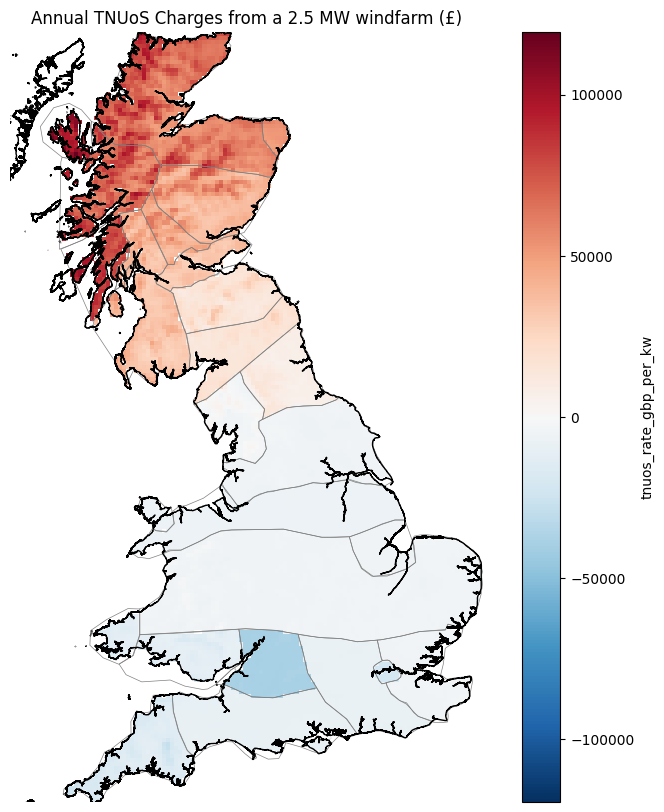

In [156]:
# Map estimted TNUoS charges & TNUoS regions

fig, ax = plt.subplots(figsize=(10, 10))

tnuos_per_turbine = wind_speed_gb['tnuos_rate_gbp_per_kw']*turbine_capacity_kw

# Plot wind speeds onto map
tnuos_per_turbine.plot(
    ax=ax, 
    alpha=1)

# Plot GB boundary
# Plot GB boundary & TNUoS Regions (base layer)
tnuos_regions_bng.plot(ax=ax, color='none', edgecolor='grey', linewidth=0.5)
gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

ax.set_title("Annual TNUoS Charges from a 2.5 MW windfarm (£)")
ax.axis('off')

plt.show()

In [157]:
# Illustrative TNUoS charges
wind_speed_gb['tnuos_rate_35lf'] = (
    wind_speed_gb['tnuos_shared'] * 0.35 +
    wind_speed_gb['tnuos_not_shared'] +
    wind_speed_gb['tnuos_adjustment']
)

Data:
- Road distance
- Substation distance
- Wind speed
- Elevation
- Slope

## 4.3 Prepare wind

In [158]:
# Capacity per site: 67.5 MW per 2500mx2500m square.
print(mw_per_sq)
base_turbine_capacity = 2.5  # MW

62.5


In [159]:
# Define criteria from wind xarray to keep.
# Remove generation - recalculate later once final raster data is complete, as increasing resolution is impacting the generation calculation
wind_criteria = ['wind_speed',
                 # 'Annual generation (MWh)',      
                 'tnuos_rate_gbp_per_kw']
wind_da = wind_speed_gb[wind_criteria]

# define new limits to match terrain_gb xarray
x_new = terrain_gb['x'].values
y_new = terrain_gb['y'].values

In [160]:
# Transform wind from 5000m to 2500m pixels
wind_da_upsampled = wind_da.interp(
    x=x_new,
    y=y_new,
    method='nearest'
)

In [161]:
# Trim wind data to boundary
xmin, ymin, xmax, ymax = gb_map_clipped.total_bounds

wind_da_cropped = wind_da_upsampled.sel(
    x=slice(xmin, xmax),
    y=slice(ymax, ymin)
)

## 4.4 Combine terrain & wind rasters

In [4]:
criteria_data = xr.open_dataset(data_folder+"criteria_data.nc")

In [5]:
# criteria_data = xr.Dataset({
#     'altitude': terrain_gb['altitude'],
#     'slope': terrain_gb['slope'],
#     'wind_speed': wind_da_cropped['wind_speed'],
# #    'annual_generation_MWh': wind_da_cropped['Annual generation (MWh)'],
#     'tnuos_rate_gbp_per_kw': wind_da_cropped['tnuos_rate_gbp_per_kw'],
#     'existing_onw_mw': onw_capacity_da_spread
# })

In [6]:
# # Calculate generation based on wind speed

# turbine_speed = xr.apply_ufunc(
#     calc_turbine_speed,
#     wind_da_upsampled['wind_speed'],
#     vectorize=True,
#     dask="parallelized",
#     output_dtypes=[float],
# )

# power_per_turbine_kw = xr.apply_ufunc(
#     speed_to_power,
#     turbine_speed,
#     vectorize=True,
#     dask="parallelized",
#     output_dtypes=[float],
# )

# annual_gen_per_turbine_MWh = (power_per_turbine_kw * hr_per_season * 1e-3).sum(dim="season")

# turbines_per_cell = mw_per_sq / base_turbine_capacity

# criteria_data['annual_generation_MWh'] = (
#     annual_gen_per_turbine_MWh * turbines_per_cell
# )

In [7]:
# # Estimate total TNUoS payment per square
# criteria_data['tnuos_charge_gbp'] = criteria_data['tnuos_rate_gbp_per_kw'] * (mw_per_sq * 1e3)   # TNUoS charges are in £/kW. Need to adjust capacity per sq from 2.5 MW to 2,500 kW

NameError: name 'x_coords_onw' is not defined

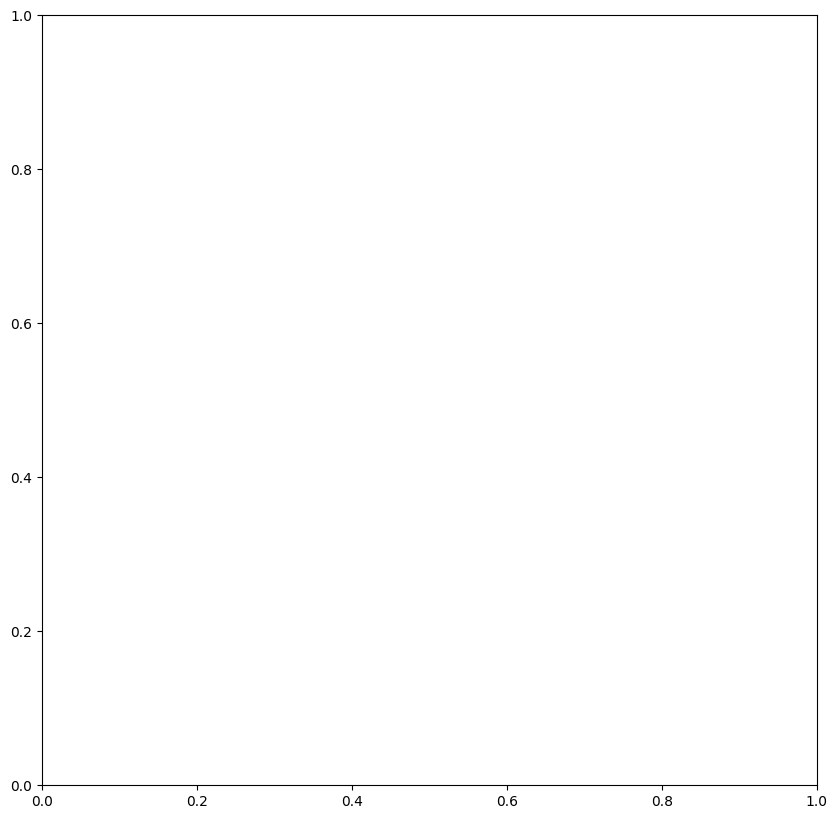

In [8]:
# Plot potential annual generation (MWh)

fig, ax = plt.subplots(figsize=(10, 10))

# Plot wind speeds onto map
wind_gen_map = criteria_data['annual_generation_MWh']*1e-3

im = ax.imshow(
    np.flipud(wind_gen_map.values),  # flip so y increases upward
    extent=[x_coords_onw.min(), x_coords_onw.max(), y_coords_onw.min(), y_coords_onw.max()],
    origin='lower',
    cmap='Greens',
    interpolation='nearest'
)

plt.colorbar(im, ax=ax, label='Potential Generation (GWh)')
ax.set_title('Wind Farm Capacity Raster (2.5 km grid)')

# Plot GB boundary
gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

ax.set_title("Annual generation from a 62.5 MW windfarm")
ax.axis('off')

plt.show()

# 5 Analysis

## 5.1 Set exclusion criteria

In [46]:
### MINIMUM DATA IMPORT TO RUN ANALYSIS

criteria_data = xr.open_dataset(data_folder+"criteria_data.nc")
gb_boundary_clip = gpd.read_file("/Users/martinkelly/Documents/Coding/ONW-location-code/Data/gb_boundary_clip.gpkg")
grid_gdf_clip = gpd.read_file(data_folder+"grid_gdf_clip.geojson")

### Rasterise exclusion criteria

In [47]:
# Exclusion criteria:
# 1. Urban
# 2. Environmentally protected areas
# 3. Water bodies / rivers / wetlands
# 4. Slope >15%

# print(type(excluded_land))
# print(type(protected_land_map))

In [48]:
# # Create a combined exclusion map. First, isolate only the geometries of excluded zones.
# excluded_land_geom = excluded_land[['geometry']].copy()
# water_clip_geom = water_clip[['geometry']].copy()
# protected_land_map_geom = protected_land_map[['geometry']].copy()

# excluded_gdf = gpd.GeoDataFrame(pd.concat([excluded_land_geom, 
# #                                           water_clip_geom, 
#                                            protected_land_map_geom
#                                            ], ignore_index=True))

In [49]:
# # Rasterise exclusion criteria

# import numpy as np
# import rasterio
# from rasterio import features
# import xarray as xr

# # Define raster grid based on criteria_data 
# x = criteria_data['x'].values  
# y = criteria_data['y'].values

# pixel_size_x = float(x[1] - x[0])
# pixel_size_y = abs(float(y[1] - y[0]))  

# x_min, x_max = x.min(), x.max()
# y_min, y_max = y.min(), y.max()

# x_res = len(x)
# y_res = len(y)

# # Create rasterio transform
# transform_raster = rasterio.transform.from_origin(
#     west=x_min,
#     north=y_max,  
#     xsize=pixel_size_x,
#     ysize=pixel_size_y
# )

# #  Rasterize excluded_gdf
# excluded_raster = features.rasterize(
#     ((geom, 1) for geom in excluded_gdf.geometry),
#     out_shape=(y_res, x_res),
#     transform=transform_raster,
#     fill=0,
#     dtype=np.uint8
# )

# # Create Xarray DataArray
# excluded_da = xr.DataArray(
#     excluded_raster,
#     dims=("y", "x"),
#     coords={"x": x, "y": y},
#     name="excluded"
# )

# excluded_masked = excluded_da.where(excluded_da == 1)


In [50]:
# # Add locations with existing wind capacity
# capacity_excluded = onw_capacity_da_spread >= 14.5

# combined_excluded = (excluded_da == 1) | capacity_excluded


# # Add to criteria_data 
# criteria_data['excluded_zones'] = combined_excluded


# print(criteria_data)
# print("Excluded pixels:", np.sum(combined_excluded.values))

In [51]:
# criteria_data.to_netcdf(data_folder+"criteria_data.nc")

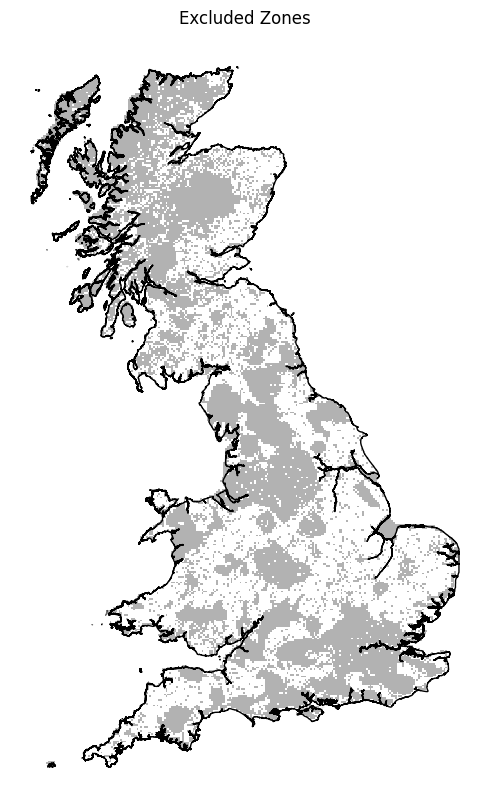

In [52]:
# Plot excluded zones
from matplotlib.colors import ListedColormap

cmap = ListedColormap(['white', 'grey'])

fig, ax = plt.subplots(figsize=(10, 10))

# Use masked DataArray so only 1s show
im = ax.imshow(
    criteria_data['excluded_zones'].values,  # full data (0 & 1)
    extent=[criteria_data['x'].min(), criteria_data['x'].max(),
            criteria_data['y'].min(), criteria_data['y'].max()],
    cmap=cmap,
    interpolation='none',  # no smoothing
    alpha=0.6
)

# Overlay GB boundary
gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

ax.set_title("Excluded Zones")
ax.axis('off')
plt.show()

## 5.2 Analytical Hierachy Process (AHP)

In [53]:
##### SEE BOTTOM TO AMEND WEIGHTING SCENARIO ###

# Define criteria, set-up pairwise comparison
criteria = [
    "Potential wind generation",
    "Distance to transmission lines",
    "Distance to substations",
    "Distance to roads",
    "Slope",
    "Land cover",
    "TNUoS Charge"
]

# Derived from comparing 6 papers:
# Ali et al (2017)
# Chaibi et al (2024)
# Feloni & Karandinaki (2011)
# Ifkrine (2022)
# Sotiropoulou (2021)
# Yaman (2024)

# Pairwise comparison matrix (PCM)
# Scenario 1: TNUoS is mid-importance
pcm1 = np.array([
    [1,     7,     9,     8,     8,     5,     6],
    [1/7,   1,     4,     3,     3,   1/2,     1],
    [1/9,  1/4,    1,   1/2,   1/2,   1/4,   1/3],
    [1/8,  1/3,    2,     1,     1,   1/3,   1/2],
    [1/8,  1/3,    2,     1,     1,   1/3,   1/2],
    [1/5,    2,    4,     3,     3,     1,     2],
    [1/6,    1,    3,     2,     2,   1/2,     1]
], dtype=float)

# Scenario 2: TNUoS is moderate importance
pcm2 = np.array([
    [1,     7,     9,     8,     8,     5,     2],
    [1/7,   1,     4,     3,     3,   1/2,   1/5],
    [1/9,  1/4,    1,   1/2,   1/2,   1/4,   1/8],
    [1/8,  1/3,    2,     1,     1,   1/3,   1/7],
    [1/8,  1/3,    2,     1,     1,   1/3,   1/7],
    [1/5,    2,    4,     3,     3,     1,   1/4],
    [1/2,    5,    8,     7,     7,     4,     1]
], dtype=float)

# Scenario 3: TNUoS is as important as wind
pcm3 = np.array([
    [1,     1,     1,     1,     1,     1,     1],
    [1,     1,     1,     1,     1,     1,     1],
    [1,     1,     1,     1,     1,     1,     1],
    [1,     1,     1,     1,     1,     1,     1],
    [1,     1,     1,     1,     1,     1,     1],
    [1,     1,     1,     1,     1,     1,     1],
    [1,     1,     1,     1,     1,     1,     1]
], dtype=float)


# pcm = pcm1
pcm = pcm2
# pcm = pcm3

pcm_df = pd.DataFrame(pcm, index=criteria, columns=criteria)
pcm_df

,Potential wind generation,Distance to transmission lines,Distance to substations,Distance to roads,Slope,Land cover,TNUoS Charge
Potential wind generation,1.000000,7.000000,9.0,8.0,8.0,5.000000,2.000000
Distance to transmission lines,0.142857,1.000000,4.0,3.0,3.0,0.500000,0.200000
Distance to substations,0.111111,0.250000,1.0,0.5,0.5,0.250000,0.125000
Distance to roads,0.125000,0.333333,2.0,1.0,1.0,0.333333,0.142857
Slope,0.125000,0.333333,2.0,1.0,1.0,0.333333,0.142857
Land cover,0.200000,2.000000,4.0,3.0,3.0,1.000000,0.250000
TNUoS Charge,0.500000,5.000000,8.0,7.0,7.0,4.000000,1.000000


In [54]:
# Calculate weights (eigenvector)
eigvals, eigvecs = np.linalg.eig(pcm)

# Index of maximum eigenvalue
max_eigval_index = np.argmax(eigvals.real)

# Principal eigenvector
weights = eigvecs[:, max_eigval_index].real

# Normalize
weights = weights / weights.sum()

weights_series = pd.Series(weights, index=criteria, name="Weight").round(3)
weights_series

Potential wind generation         0.412
Distance to transmission lines    0.083
Distance to substations           0.027
Distance to roads                 0.040
Slope                             0.040
Land cover                        0.107
TNUoS Charge                      0.291
Name: Weight, dtype: float64

In [55]:
# Consistency index & consistency ratio
# CI
n = pcm.shape[0]
lambda_max = eigvals[max_eigval_index].real

CI = (lambda_max - n) / (n - 1)

# CR
RI_table = {
    1: 0.00,
    2: 0.00,
    3: 0.58,
    4: 0.90,
    5: 1.12,
    6: 1.24,
    7: 1.32,
    8: 1.41,
    9: 1.45,
    10: 1.49
}

RI = RI_table[n]
CR = CI / RI

# Summarise results

summary = pd.DataFrame({
    "Weight": weights_series,
})

summary.loc["λ_max"] = lambda_max
summary.loc["CI"] = CI
summary.loc["CR"] = CR

summary.round(3)

,Weight
Potential wind generation,0.412
Distance to transmission lines,0.083
Distance to substations,0.027
Distance to roads,0.040
Slope,0.040
Land cover,0.107
TNUoS Charge,0.291
λ_max,7.263
CI,0.044
CR,0.033


## 5.3 Standardise appraisal criteria

### Rasterise remaining appraisal criteria

In [56]:
criteria

['Potential wind generation',
 'Distance to transmission lines',
 'Distance to substations',
 'Distance to roads',
 'Slope',
 'Land cover',
 'TNUoS Charge']

In [57]:
# criteria
# ['Potential wind generation',         XARRAY
#  'Distance to transmission lines',    OTHER
#  'Distance to substations',           OTHER
#  'Distance to roads',                 OTHER
#  'Slope',                             XARRAY
#  'Land cover',                      OTHER
#  'TNUoS Charge']                      XARRAY

# xarray:
print(type(criteria_data['slope'].values))
print(type(criteria_data['annual_generation_MWh'].values))
print(type(criteria_data['tnuos_charge_gbp'].values))

# Other data:
print(grid_gdf_clip['dist_to_substation_m'].dtypes)
print(grid_gdf_clip['dist_to_line_m'].dtypes)
print(grid_gdf_clip['dist_to_road_m'].dtypes)
print(land_cover_gb['corine_weight'].dtypes)

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
float64
float64
float64


NameError: name 'land_cover_gb' is not defined

In [ ]:
# Prepare raster grid
x = criteria_data['x'].values
y = criteria_data['y'].values
pixel_size_x = float(x[1] - x[0])
pixel_size_y = abs(float(y[1] - y[0]))

In [ ]:
# Distance to substation
shapes = ((geom, val) for geom, val in zip(grid_gdf_clip.geometry, grid_gdf_clip["dist_to_substation_m"]))
dist_to_line_raster = features.rasterize(
    shapes=shapes,
    out_shape=(len(y), len(x)),
    transform=rasterio.transform.from_origin(x[0], y[0], pixel_size_x, pixel_size_y),
    fill=np.nan,
    dtype=np.float32
)
dist_to_sub_da = xr.DataArray(dist_to_line_raster, dims=("y","x"), coords={"y":y, "x":x}, name="dist_to_substation_m")
criteria_data["dist_to_substation_m"] = dist_to_sub_da

NameError: name 'grid_gdf_clip' is not defined

In [ ]:
# Distance to transmission line
shapes = ((geom, val) for geom, val in zip(grid_gdf_clip.geometry, grid_gdf_clip["dist_to_line_m"]))
dist_to_line_raster = features.rasterize(
    shapes=shapes,
    out_shape=(len(y), len(x)),
    transform=rasterio.transform.from_origin(x[0], y[0], pixel_size_x, pixel_size_y),
    fill=np.nan,
    dtype=np.float32
)
dist_to_line_da = xr.DataArray(dist_to_line_raster, dims=("y","x"), coords={"y":y, "x":x}, name="dist_to_line_m")
criteria_data["dist_to_line_m"] = dist_to_line_da

In [ ]:
# Distance to road
shapes = ((geom, val) for geom, val in zip(grid_gdf_clip.geometry, grid_gdf_clip["dist_to_road_m"]))
dist_to_line_raster = features.rasterize(
    shapes=shapes,
    out_shape=(len(y), len(x)),
    transform=rasterio.transform.from_origin(x[0], y[0], pixel_size_x, pixel_size_y),
    fill=np.nan,
    dtype=np.float32
)
dist_to_road_da = xr.DataArray(dist_to_line_raster, dims=("y","x"), coords={"y":y, "x":x}, name="dist_to_road_m")
criteria_data["dist_to_road_m"] = dist_to_road_da

In [ ]:
# Land cover values
# Prepare shapes
transform = rasterio.transform.from_origin(x[0], y[0], pixel_size_x, pixel_size_y)
shapes = ((geom, val) for geom, val in zip(land_cover_gb.geometry, land_cover_gb["corine_weight"]))

# Rasterise
corine_raster = features.rasterize(
    shapes=shapes,
    out_shape=(len(y), len(x)),
    transform=transform,
    fill=np.nan,      
    dtype=np.float32
)

# Convert to xarray
corine_da = xr.DataArray(
    corine_raster,
    dims=("y", "x"),
    coords={"y": y, "x": x},
    name="corine_weight"
)

criteria_data["land_cover_value"] = corine_da

### Remove excluded

In [ ]:
# Start by removing excluded zone
masked = criteria_data.where(criteria_data['excluded_zones'] == 0)

### Standardise

In [ ]:
criteria_data

<xarray.Dataset> Size: 12MB
Dimensions:                (y: 386, x: 236, season: 4, band: 1)
Coordinates:
  * y                      (y) float64 3kB 9.762e+05 9.737e+05 ... 1.375e+04
  * x                      (x) float64 2kB 6.375e+04 6.625e+04 ... 6.513e+05
  * season                 (season) object 32B 'spring' 'summer' ... 'winter'
  * band                   (band) int32 4B 1
Data variables: (12/22)
    slope                  (y, x) float32 364kB nan nan nan nan ... nan nan nan
    tnuos_rate_gbp_per_kw  (y, x) float64 729kB ...
    existing_onw_mw        (y, x) float32 364kB ...
    annual_generation_MWh  (y, x) float64 729kB 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0
    tnuos_charge_gbp       (y, x) float64 729kB nan nan nan nan ... nan nan nan
    excluded_zones         (y, x) bool 91kB False False False ... False False
    ...                     ...
    tnuos_std              (y, x) float64 729kB ...
    existing_onw_std       (y, x) float32 364kB ...
    suitability            (y, x) float64 729kB ...
    wind_speed             (season, y, x) float64 3MB ...
    altitude               (band, y, x) float32 364kB ...
    spatial_ref            int32 4B ...

In [ ]:
# Standardise criteria. 
# Benefit criteria
criteria_data['wind_std'] = (masked['annual_generation_MWh'] - masked['annual_generation_MWh'].min(skipna=True)) / \
                             (masked['annual_generation_MWh'].max(skipna=True) - masked['annual_generation_MWh'].min(skipna=True))

criteria_data['land_cover_std'] = (masked['land_cover_value'] - masked['land_cover_value'].min(skipna=True)) / \
                               (masked['land_cover_value'].max(skipna=True) - masked['land_cover_value'].min(skipna=True))

# Cost criteria
criteria_data['dist_trans_std'] = (masked['dist_to_line_m'].max(skipna=True) - masked['dist_to_line_m']) / \
                                  (masked['dist_to_line_m'].max(skipna=True) - masked['dist_to_line_m'].min(skipna=True))

criteria_data['dist_sub_std'] = (masked['dist_to_substation_m'].max(skipna=True) - masked['dist_to_substation_m']) / \
                                (masked['dist_to_substation_m'].max(skipna=True) - masked['dist_to_substation_m'].min(skipna=True))

criteria_data['dist_road_std'] = (masked['dist_to_road_m'].max(skipna=True) - masked['dist_to_road_m']) / \
                                 (masked['dist_to_road_m'].max(skipna=True) - masked['dist_to_road_m'].min(skipna=True))

criteria_data['slope_std'] = (masked['slope'].max(skipna=True) - masked['slope']) / \
                             (masked['slope'].max(skipna=True) - masked['slope'].min(skipna=True))

criteria_data['tnuos_std'] = (masked['tnuos_charge_gbp'].max(skipna=True) - masked['tnuos_charge_gbp']) / \
                             (masked['tnuos_charge_gbp'].max(skipna=True) - masked['tnuos_charge_gbp'].min(skipna=True))

## 5.4 Suitability analysis

### Estimate suitability of each location

In [ ]:
# Create dictionary for weights
criteria_names = [
    'wind_std',
    'dist_trans_std',
    'dist_sub_std',
    'dist_road_std',
    'slope_std',
    'land_cover_std',
    'tnuos_std'
]

weights_dict = dict(zip(criteria_names, weights))

In [ ]:
# Apply weights to criteria
criteria_data['suitability'] = sum(
    weights_dict[name] * criteria_data[name] for name in criteria_names
)

In [ ]:
# Save analysis
criteria_data[['suitability']].to_netcdf(
    data_folder + "wind_suitability_final.nc"
)

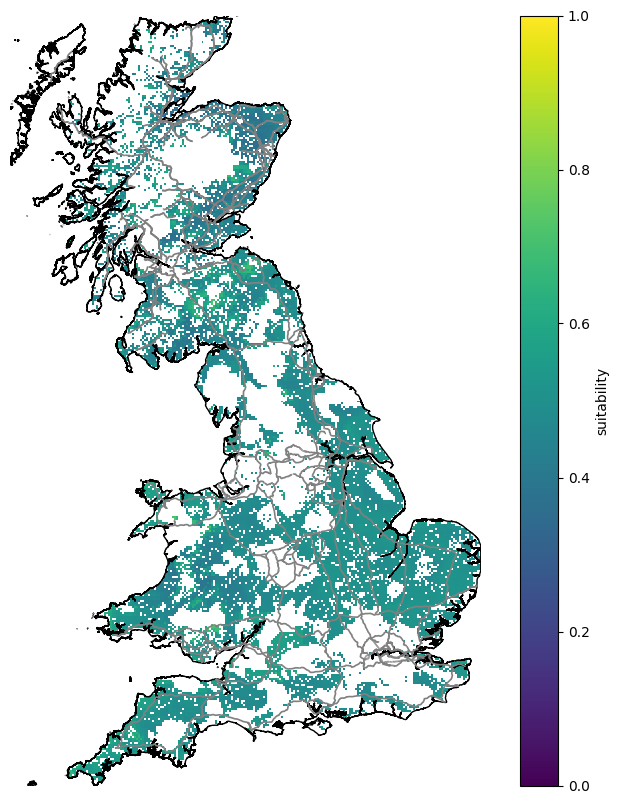

In [ ]:
# Plot sustainability chart

fig, ax = plt.subplots(figsize=(10, 10))

criteria_data['suitability'].plot(ax=ax, cmap='viridis', vmin=0, vmax=1)

# Plot network
gb_lines.plot(ax=ax, color='grey', edgecolor='grey', linewidth=1.2)

# GB Boundary
gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

#ax.set_title("Wind Farm Suitability (AHP-weighted)")
ax.set_title("")
ax.axis('off')

plt.show()

### Identify top 20

In [ ]:
from shapely.geometry import Point

# Flatten suitability array
suit_flat = criteria_data['suitability'].values.flatten()

# Mask out NaNs
valid_idx = np.where(~np.isnan(suit_flat))[0]
valid_scores = suit_flat[valid_idx]

# Get top 160 indices
top160_valid_idx = valid_idx[np.argsort(valid_scores)[-160:][::-1]]

# Convert flat indices to 2D
y_idx, x_idx = np.unravel_index(top160_valid_idx, criteria_data['suitability'].shape)

# Extract coordinates
x_coords = criteria_data['suitability'].x.values[x_idx]
y_coords = criteria_data['suitability'].y.values[y_idx]

# Grid resolution
x_vals_suitability = criteria_data['suitability'].x.values
y_vals_suitability = criteria_data['suitability'].y.values
dx = x_vals_suitability[1] - x_vals_suitability[0]
dy = y_vals_suitability[1] - y_vals_suitability[0]

# Extract top 160 scores
top160_scores = suit_flat[top160_valid_idx]

# Create GeoDataFrame with scores
top160_gdf = gpd.GeoDataFrame(
    pd.DataFrame({
        'rank': np.arange(1, 161),
        'suitability': top160_scores
    }),
    geometry=[
    box(x - dx/2, y - dy/2, x + dx/2, y + dy/2)
    for x, y in zip(x_coords, y_coords)
],
    crs=criteria_data.rio.crs
)

# Add criterion value for top 160
for crit in criteria_names:
    crit_flat = criteria_data[crit].values.flatten()
    top160_gdf[crit] = crit_flat[top160_valid_idx]

# Add additional variables
extra_vars = ['tnuos_charge_gbp', 'annual_generation_MWh', 'dist_to_line_m']
for var in extra_vars:
    var_flat = criteria_data[var].values.flatten()
    top160_gdf[var] = var_flat[top160_valid_idx]

# Multiply criterion values with weights
for crit in criteria_names:
    top160_gdf[crit + "_weighted"] = top160_gdf[crit] * weights_dict[crit]


top160_gdf

,rank,suitability,geometry,wind_std,dist_trans_std,dist_sub_std,dist_road_std,slope_std,land_cover_std,tnuos_std,tnuos_charge_gbp,annual_generation_MWh,dist_to_line_m,wind_std_weighted,dist_trans_std_weighted,dist_sub_std_weighted,dist_road_std_weighted,slope_std_weighted,land_cover_std_weighted,tnuos_std_weighted
0,1,0.734969,"POLYGON ((317500 212500, 317500 210000, 315000...",0.475334,0.960960,0.963042,0.999555,0.967779,1.000000,0.851216,-4.161085e+05,225809.708556,2733.844482,0.195831,0.079605,0.026079,0.039977,0.038707,0.106847,0.247924
1,2,0.733599,"POLYGON ((317500 215000, 317500 212500, 315000...",0.475334,0.999229,0.986066,0.993270,0.844960,1.000000,0.851216,-4.161085e+05,225809.708556,54.262501,0.195831,0.082775,0.026702,0.039726,0.033794,0.106847,0.247924
2,3,0.731341,"POLYGON ((317500 617500, 317500 615000, 315000...",0.753234,0.777909,0.774361,0.982144,0.952510,1.000000,0.519762,8.744289e+05,357827.921945,15550.988281,0.310322,0.064441,0.020969,0.039281,0.038096,0.106847,0.151385
3,4,0.728071,"POLYGON ((270000 347500, 270000 345000, 267500...",0.517563,0.979820,0.975492,0.993232,0.795140,1.000000,0.785852,-1.616113e+05,245870.889361,1413.249146,0.213229,0.081167,0.026416,0.039725,0.031802,0.106847,0.228886
4,5,0.721415,"POLYGON ((317500 620000, 317500 617500, 315000...",0.753234,0.790052,0.750950,0.896326,0.780841,1.000000,0.519762,8.744289e+05,357827.921945,14700.756836,0.310322,0.065447,0.020336,0.035849,0.031230,0.106847,0.151385
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155,156,0.644551,"POLYGON ((395000 540000, 395000 537500, 392500...",0.479723,0.656964,0.577249,0.994954,0.848024,1.000000,0.673973,2.739980e+05,227895.178581,24019.501953,0.197639,0.054422,0.015632,0.039793,0.033917,0.106847,0.196300
156,157,0.644418,"POLYGON ((275000 752500, 275000 750000, 272500...",0.691913,0.975856,0.918103,0.945415,0.627382,0.833333,0.349226,1.538419e+06,328697.071149,1690.806763,0.285059,0.080839,0.024862,0.037812,0.025092,0.089039,0.101715
157,158,0.644408,"POLYGON ((190000 210000, 190000 207500, 187500...",0.538164,0.897700,0.903080,0.946712,0.944989,0.000000,0.852211,-4.199804e+05,255657.502199,7163.290039,0.221716,0.074365,0.024455,0.037864,0.037795,0.000000,0.248213
158,159,0.644228,"POLYGON ((342500 775000, 342500 772500, 340000...",0.728710,0.860343,0.698543,0.822392,0.839953,0.833333,0.337495,1.584095e+06,346177.515159,9778.984375,0.300218,0.071270,0.018916,0.032892,0.033594,0.089039,0.098298


In [ ]:
# Identify 20 blocks of continuous 8-cells. Finds all possible 8-cell combinations; chooses highest scoring

import numpy as np
import scipy.ndimage as nd
from shapely.geometry import box
from shapely.ops import unary_union
import geopandas as gpd

# Hide low-value cells
suit = criteria_data['suitability'].values
mask = ~np.isnan(suit) & (suit > 0.2) 

# Identiu all cells with neighbours
structure = np.ones((3,3), dtype=int)
labeled, num_features = nd.label(mask, structure=structure)

# Identify all cells with neighbours that form a group of 8
cluster_sizes = nd.sum(mask, labeled, index=np.arange(1, num_features+1))
valid_clusters = np.where(cluster_sizes >= 8)[0] + 1  # labels start at 1

all_blocks = []
for lbl in valid_clusters:
    ys, xs = np.where(labeled == lbl)
    cluster_mask = np.zeros_like(suit, dtype=bool)
    cluster_mask[ys, xs] = True

    # Rank cells by suitability
    cluster_scores = suit[ys, xs]
    sorted_idx = np.argsort(cluster_scores)[::-1]
    ys_sorted = ys[sorted_idx]
    xs_sorted = xs[sorted_idx]

    used = np.zeros_like(suit, dtype=bool)

    for y0, x0 in zip(ys_sorted, xs_sorted):
        if used[y0, x0]:
            continue

        stack = [(y0, x0)]
        block_cells = []

        while stack and len(block_cells) < 8:
            y, x = stack.pop()
            if not cluster_mask[y, x] or used[y, x]:
                continue
            block_cells.append((y, x))
            used[y, x] = True

            # Add neighbors (8-connectivity)
            for dy in [-1,0,1]:
                for dx in [-1,0,1]:
                    ny, nx = y+dy, x+dx
                    if 0 <= ny < suit.shape[0] and 0 <= nx < suit.shape[1]:
                        stack.append((ny, nx))

        if len(block_cells) == 8:
            block_score = np.sum([suit[y, x] for y, x in block_cells])
            all_blocks.append({'cells': block_cells, 'score': block_score})

# sort 8-cell blocks
all_blocks_sorted = sorted(all_blocks, key=lambda b: b['score'], reverse=True)

# Pick top blocks; ensurre they don't overlap
selected_blocks = []
used_mask = np.zeros_like(suit, dtype=bool)

for block in all_blocks_sorted:
    ys_block, xs_block = zip(*block['cells'])
    if np.any(used_mask[ys_block, xs_block]):
        continue
    used_mask[ys_block, xs_block] = True
    selected_blocks.append(block)
    if len(selected_blocks) >= 20:
        break

# Convert blocks from points to polygons. Makes it easier to map
dx = criteria_data['suitability'].x.values[1] - criteria_data['suitability'].x.values[0]
dy = criteria_data['suitability'].y.values[1] - criteria_data['suitability'].y.values[0]

block_polygons = []
for rank, block in enumerate(selected_blocks, start=1):
    ys_block, xs_block = zip(*block['cells'])
    cells = []
    for y, x in block['cells']:
        x0 = criteria_data['suitability'].x.values[x] - dx/2
        x1 = criteria_data['suitability'].x.values[x] + dx/2
        y0 = criteria_data['suitability'].y.values[y] - dy/2
        y1 = criteria_data['suitability'].y.values[y] + dy/2
        cells.append(box(x0, y0, x1, y1))

    block_polygons.append({
        'rank': rank,
        'score': block['score'],
        'annual_generation_MWh': np.nansum(criteria_data['annual_generation_MWh'].values[ys_block, xs_block]),
        'tnuos_charge_gbp': np.nansum(criteria_data['tnuos_charge_gbp'].values[ys_block, xs_block]),
        'dist_to_line_m': np.nanmin(criteria_data['dist_to_line_m'].values[ys_block, xs_block]),
        'geometry': unary_union(cells),
        'cells': len(block['cells'])
    })

# Convert to gdf
blocks_gdf = gpd.GeoDataFrame(block_polygons, crs=criteria_data.rio.crs)

### Plot

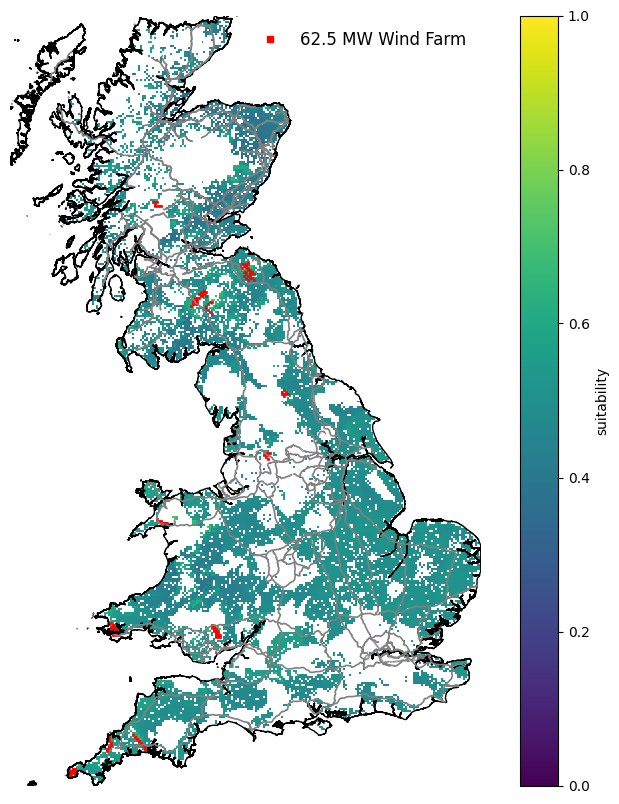

In [ ]:
# Plot! CONTINUOUS BOXES
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D

fig, ax = plt.subplots(figsize=(10, 10))

criteria_data['suitability'].plot(ax=ax, cmap='viridis', vmin=0, vmax=1)

# Plot network
gb_lines.plot(ax=ax, color='grey', edgecolor='grey', linewidth=1.2)

# Plot continuous blocks
blocks_gdf.plot(ax=ax, facecolor='red', edgecolor='red', linewidth=0.5)


# GB Boundary
gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

# Legend for the red boxes
red_box_patch = Line2D(
    [], [],
    marker='s',
    linestyle='None',
    markersize=5,      
    markerfacecolor='red',
    markeredgecolor='red',
    label=f'{mw_per_sq} MW Wind Farm'
)

ax.legend(
    handles=[red_box_patch],
    loc='upper right',
    fontsize=12,
    frameon=False
)

#ax.set_title("Wind Farm Suitability (AHP-weighted)")
ax.set_title("")
ax.axis('off')

plt.show()

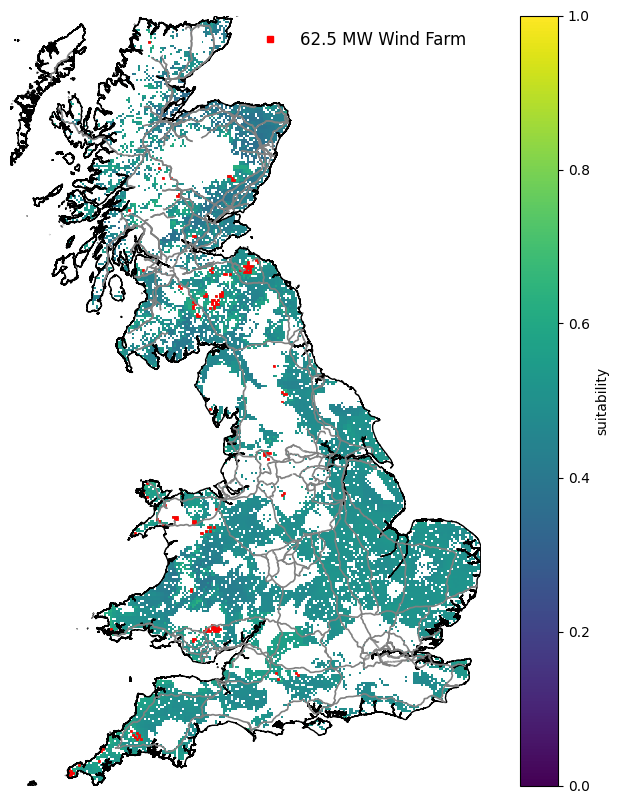

In [ ]:
# Plot! SEPERATE PLOTS
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D

fig, ax = plt.subplots(figsize=(10, 10))

criteria_data['suitability'].plot(ax=ax, cmap='viridis', vmin=0, vmax=1)

# Plot network
gb_lines.plot(ax=ax, color='grey', edgecolor='grey', linewidth=1.2)

# Plot top 160 sites
top160_gdf.plot(ax=ax, facecolor='red', edgecolor='red', linewidth=0.5)

# GB Boundary
gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

# Legend for the red boxes
red_box_patch = Line2D(
    [], [],
    marker='s',
    linestyle='None',
    markersize=5,      
    markerfacecolor='red',
    markeredgecolor='red',
    label=f'{mw_per_sq} MW Wind Farm'
)

ax.legend(
    handles=[red_box_patch],
    loc='upper right',
    fontsize=12,
    frameon=False
)

#ax.set_title("Wind Farm Suitability (AHP-weighted)")
ax.set_title("")
ax.axis('off')

plt.show()

# 6. Financial Analysis

## 6.1 Capex

In [ ]:
# Installation cost
# https://benvyz.github.io/benv0093/coursework.html
# https://www.gov.uk/government/publications/electricity-generation-costs-2023
# Assume: $2m/MW = £1.48m/MW capex
# £1,100 / kW (DESNZ 2023)
capex_GBP_per_mw = 1100 * 1e3
# merged_blocks_south['capex_gbp'] = mw_per_sq * capex_GBP_per_mw * merged_blocks_south['cells']
# merged_blocks_north['capex_gbp'] = mw_per_sq * capex_GBP_per_mw * merged_blocks_north['cells']    

top160_gdf['capex_gbp'] = mw_per_sq * capex_GBP_per_mw 
blocks_gdf['capex_gbp'] = mw_per_sq * capex_GBP_per_mw * 8 

In [ ]:
print(f'£{160*mw_per_sq*capex_GBP_per_mw:,.0f}m')

£11,000,000,000m


In [ ]:
# Connection cost
# Assume 590 USD/MW * km 
GBP_per_USD = 0.75
connection_cost_per_mw_per_km = 590*GBP_per_USD 
print(connection_cost_per_mw_per_km)

# merged_blocks_south['connection_cost'] = (connection_cost_per_mw_per_km * mw_per_sq * merged_blocks_south['cells']) * merged_blocks_south['dist_to_line_m'] * 1e-3  # Distance to line is in m. Need converting to km.
    
# merged_blocks_north['connection_cost'] = (connection_cost_per_mw_per_km * mw_per_sq * merged_blocks_north['cells']) * merged_blocks_north['dist_to_line_m'] * 1e-3  # Distance to line is in m. Need converting to km.

top160_gdf['connection_cost'] =  (connection_cost_per_mw_per_km * mw_per_sq ) * top160_gdf['dist_to_line_m'] * 1e-3  # Distance to line is in m. Need converting to km. 
blocks_gdf['connection_cost'] = (connection_cost_per_mw_per_km * mw_per_sq * 8 ) * blocks_gdf['dist_to_line_m'] * 1e-3  # Distance to line is in m. Need converting to km.

442.5


## 6.2 Revenue

In [ ]:
# Annual revenue: strike price (£/MWh) * annual generation (MWh)
# AR6 results: https://assets.publishing.service.gov.uk/media/66d6ad7c6eb664e57141db4b/Contracts_for_Difference_Allocation_Round_6_results.pdf
inf_12_to_25 = 1.45     # Inflation adjustment
onw_sp = 50.9*inf_12_to_25 #£/MWh
print(onw_sp)

# merged_blocks_south['revenue_gbp'] = onw_sp * merged_blocks_south['annual_generation_MWh']
# merged_blocks_north['revenue_gbp'] = onw_sp * merged_blocks_north['annual_generation_MWh'] 

top160_gdf['revenue_gbp'] = onw_sp * top160_gdf['annual_generation_MWh']
blocks_gdf['revenue_gbp'] = onw_sp * blocks_gdf['annual_generation_MWh'] 

73.80499999999999


## 6.3 NPV

In [ ]:
## AGGGREGATE RESULTS

# Columns to aggregate
result_cols = [
    'revenue_gbp',
    'capex_gbp',
    'connection_cost',
    'tnuos_charge_gbp',
    'annual_generation_MWh'
]

def summarise_gdf(gdf, name, result_cols):
    return pd.Series(
        {col: gdf[col].sum() if col in gdf.columns else 0 for col in result_cols},
        name=name
    )

# hybrid_scenario = pd.concat([merged_blocks_north, merged_blocks_south], ignore_index=True)

summary_results = pd.DataFrame([
    summarise_gdf(top160_gdf, 'Top 160 cells', result_cols),
    summarise_gdf(blocks_gdf, 'Top 20 blocks', result_cols),
    # summarise_gdf(hybrid_scenario, 'Hybrid scenario', result_cols)
])

summary_results

,revenue_gbp,capex_gbp,connection_cost,tnuos_charge_gbp,annual_generation_MWh
Top 160 cells,2.923499e+09,1.100000e+10,56361068.0,3.394848e+07,3.961113e+07
Top 20 blocks,2.466740e+09,1.100000e+10,40459588.0,1.358528e+07,3.342240e+07


In [ ]:
# NPV functino
def calc_NPV(annual_revenue, CAPEX, TNUoS, lifetime_yrs=25, dis=0.052, OPEX=0):

    t = np.arange(1, lifetime_yrs + 1)
    discounted_cash_flows = (annual_revenue - OPEX - TNUoS) / (1 + dis) ** t #annual netflow
    NPV = discounted_cash_flows.sum() - CAPEX
    #print(discounted_cash_flows.sum())
    return round(NPV, 0)

In [ ]:

summary_results['NPV (£bn)'] = summary_results.apply(
    lambda row: calc_NPV(
        annual_revenue=row['revenue_gbp'],
        CAPEX=row['capex_gbp']+row['connection_cost'],
        TNUoS=row['tnuos_charge_gbp'],
        OPEX = row['annual_generation_MWh'] * 6
    )*1e-9,
    axis=1
).round(1)

## 6.4 LCOE

In [ ]:
def calc_LCOE(capex, annual_generation, TNUoS, lifetime_yrs=25, dis=0.052, OPEX=0):

    years = np.arange(1, lifetime_yrs + 1)

    # discount factors
    discount_factors = 1 / (1 + dis) ** years

    # discounted totals
    total_discounted_cost = capex + np.sum((TNUoS + OPEX) * discount_factors)
    total_discounted_generation = np.sum(annual_generation * discount_factors)
    
    lcoe = total_discounted_cost / total_discounted_generation
    return round(lcoe, 2)

In [ ]:
summary_results['LCOE (£/MWh)'] = summary_results.apply(
    lambda row: calc_LCOE(
        annual_generation=row['annual_generation_MWh'],
        capex=row['capex_gbp']+row['connection_cost'],
        TNUoS=row['tnuos_charge_gbp'],
        OPEX = row['annual_generation_MWh'] * 6
    ),
    axis=1
).round(1)

## 6.5 Summary

In [ ]:
summary_results['capacity_GW'] = (summary_results['capex_gbp']/capex_GBP_per_mw)*1e-3
summary_results['Av. Load Factor (%)'] = (summary_results['annual_generation_MWh']/(summary_results['capacity_GW']*1e3*hr_per_year)).round(2)
summary_results['Av. TNUoS (£/kW)'] = (summary_results['tnuos_charge_gbp']/(summary_results['capacity_GW']*1e6)).round(2)

summary_table = summary_results.copy()

summary_table['revenue_gbp'] = summary_table['revenue_gbp']*1e-6
summary_table['capex_gbp'] = summary_table['capex_gbp']*1e-6
summary_table['connection_cost'] = summary_table['connection_cost']*1e-6
summary_table['tnuos_charge_gbp'] = summary_table['tnuos_charge_gbp']*1e-6
summary_table['annual_generation_MWh'] = summary_table['annual_generation_MWh']*1e-6

summary_table = summary_table.rename(columns={
                    'revenue_gbp':'Annual Revenue (£m)',
                    'capex_gbp': 'Capex (£m)',
                    'connection_cost': 'Connection Cost (£m)',
                    'tnuos_charge_gbp': 'TNUoS Charge (£m)',
                    'annual_generation_MWh': 'Annual Generation (TWh)',
                    'capacity_GW': 'Capacity (GW)'
                    })

summary_table['Av. Load Factor (%)'] = summary_table['Av. Load Factor (%)'].astype(float).map("{:,.2f}".format)
summary_table['Av. TNUoS (£/kW)'] = summary_table['Av. TNUoS (£/kW)'].astype(float).map("{:,.2f}".format)

summary_table = summary_table.applymap(
    lambda x: f"{x:,.1f}" if isinstance(x, (int, float)) else x
)

summary_table

/var/folders/j4/9zgf2vfj1djc1z4q879727140000gn/T/ipykernel_25014/3849156336.py:25: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  summary_table = summary_table.applymap(


,Annual Revenue (£m),Capex (£m),Connection Cost (£m),TNUoS Charge (£m),Annual Generation (TWh),NPV (£bn),LCOE (£/MWh),Capacity (GW),Av. Load Factor (%),Av. TNUoS (£/kW)
Top 160 cells,"2,923.5","11,000.0",56.4,33.9,39.6,25.6,27.1,10.0,0.45,3.39
Top 20 blocks,"2,466.7","11,000.0",40.5,13.6,33.4,20.1,30.3,10.0,0.38,1.36


In [ ]:
# summary_table_a = summary_table.copy
# summary_table_b = summary_table.copy

# 7. Charts for paper

In [ ]:
### EXCLUSION CHARTS
# Protected zones
# Unsuitable land types

### APPRAISAL CRITERIA charts
# wind speed
# transmission lines
# substations
# roads
# slope
# land cover
# tnuos charge
# criteria

## 7.1 Context

/Users/martinkelly/Documents/Coding/.venv/lib/python3.13/site-packages/geopandas/geodataframe.py:1896: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  result = super().__getitem__(key)


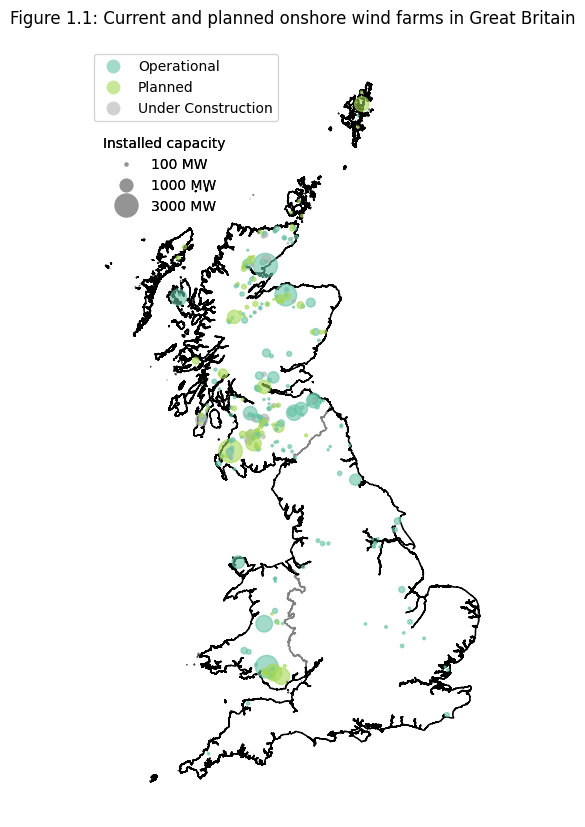

In [ ]:
### ONW capacity

fig, ax = plt.subplots(figsize=(10, 10))

# Plot Eng-Sco-Wal borders to help narrative
gb_map_clipped.plot(ax=ax, color='none', edgecolor='grey', linewidth=1)

# Plot GB boundary
gb_boundary.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

# Plot renewable sites where colour shows technology type and size shows capacity.
repd_large_wind[repd_wind['tech_group'] == 'Onshore wind'].plot(
    ax=ax,
    column='Development Status (short)',
    categorical=True,
    legend=True,
    cmap='Set2',
    alpha=0.6,
    markersize=repd_large_wind['Installed Capacity (MWelec)'] / max_cap * size_scale
    )

ax.axis('off')

status_legend = ax.get_legend()

capacity_levels = [100, 1000, 3000]

size_handles = [
    Line2D(
        [], [],
        marker='o',
        linestyle='None',
        markersize=(cap / max_cap * size_scale) ** 0.5,
        markerfacecolor='grey',
        markeredgecolor='none',
        alpha=0.6,
        label=f'{cap} MW'
    )
    for cap in capacity_levels
]

capacity_legend = ax.legend(
    handles=size_handles,
    title='Installed capacity',
    loc='upper left',
    bbox_to_anchor=(0.01, 0.9),  # x, y in axes fraction
    frameon=False
)

ax.add_artist(capacity_legend)
ax.add_artist(status_legend)

ax.set_title("Figure 1.1: Current and planned onshore wind farms in Great Britain")

plt.show()

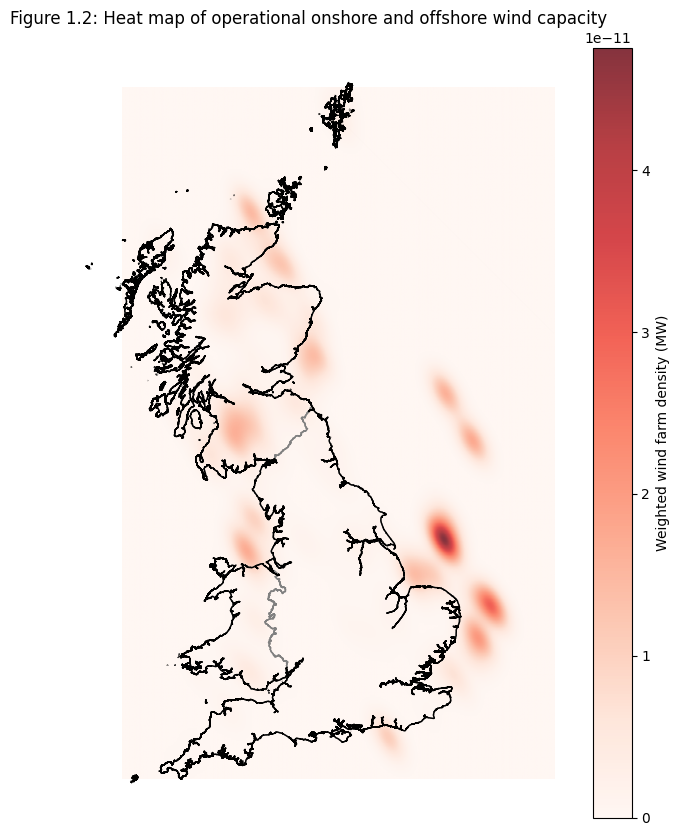

In [ ]:
# Plot wind capacity
fig, ax = plt.subplots(figsize=(10, 10))

im = ax.imshow(
    zz.T,  # transpose to match axis orientation
    origin='lower',
    extent=[xmin_wind, xmax_wind, ymin_wind, ymax_wind],
    cmap='Reds',
    alpha=0.8
)

plt.colorbar(im, ax=ax, label='Weighted wind farm density (MW)')

# Plot Eng-Sco-Wal borders to help narrative
gb_map_clipped.plot(ax=ax, color='none', edgecolor='grey', linewidth=1)

# Plot GB boundary
gb_boundary.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

ax.set_title("Figure 1.2: Heat map of operational onshore and offshore wind capacity")
ax.axis('off')
plt.show()


## 7.2 Exclusion criteria

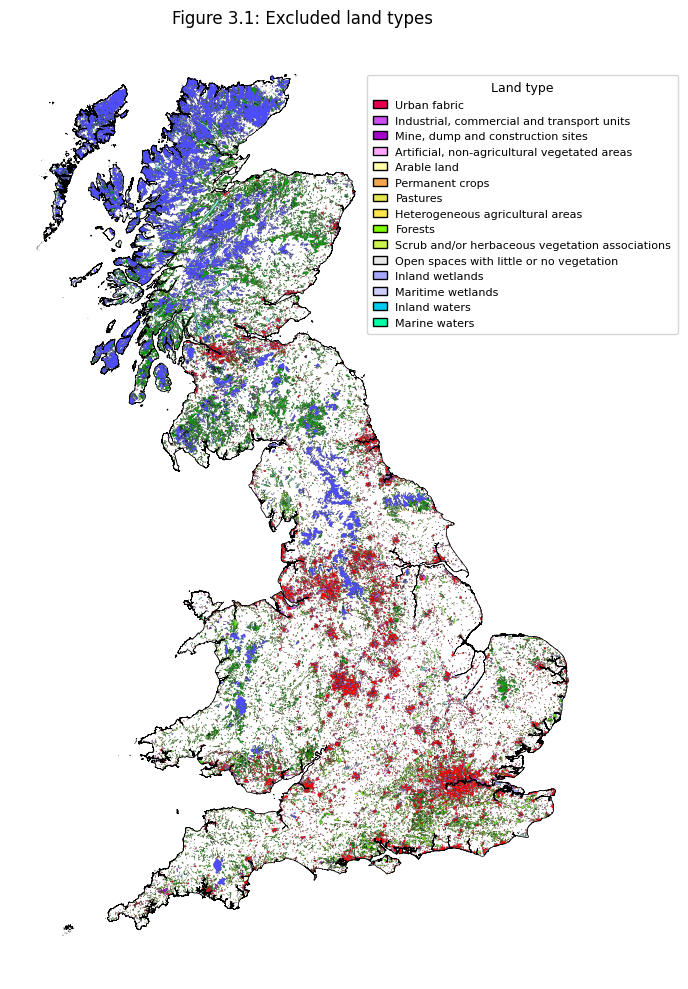

In [ ]:
# Unsuitable land types
mask = excluded_land["level3_name"].isin(level3_colors_excluded.keys())
excluded_to_plot = excluded_land[mask]
fig, ax = plt.subplots(figsize=(10, 10))

# Map excluded terrains
excluded_to_plot.plot(
    ax=ax,
    color=excluded_to_plot["level3_name"].map(level3_colors_excluded),
    linewidth=0.1,
    edgecolor="black"
)

ax.legend(
    handles=legend_elements,
    title="Land type",
    loc="upper right",
    bbox_to_anchor=(1.15, 0.96),
    frameon=True,
    labelspacing=0.5,
    handlelength=1.2,
    borderpad=0.6,
    fontsize=8,          
    title_fontsize=9    
)

# GB boundary on top
gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=0.5)

ax.set_title("Figure 3.1: Excluded land types")
ax.axis('off')
plt.tight_layout()
plt.show()

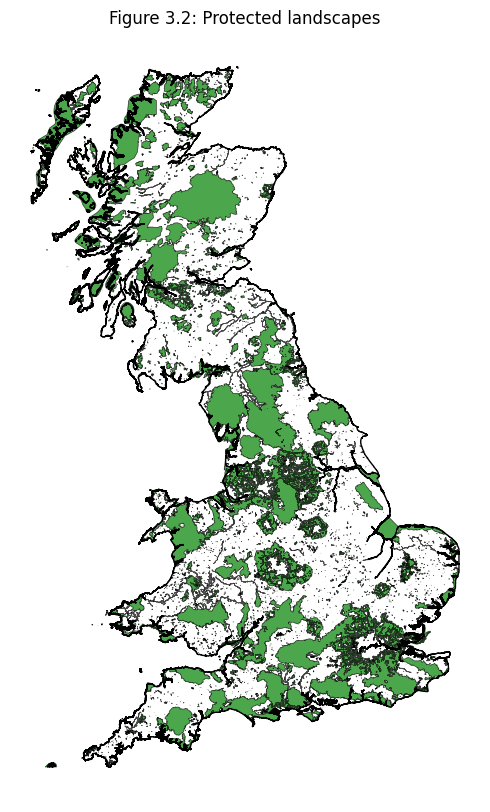

In [ ]:
# Map all protected landscapes

# Area of Natural Beauty
# Green belt
# Natural reserves
# Special Areas of Conversation
# Special Protection Areas
# Sites of Special Scientific Interest
# National Parks

fig, ax = plt.subplots(figsize=(10, 10))

# Plot various environmental regions - hard & soft boundaries for new ONW farms.
protected_land_map.plot(ax=ax, color='green', edgecolor='black', linewidth=0.5, alpha=0.7)

gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

ax.set_title("Figure 3.2: Protected landscapes")

ax.axis('off')

plt.show()

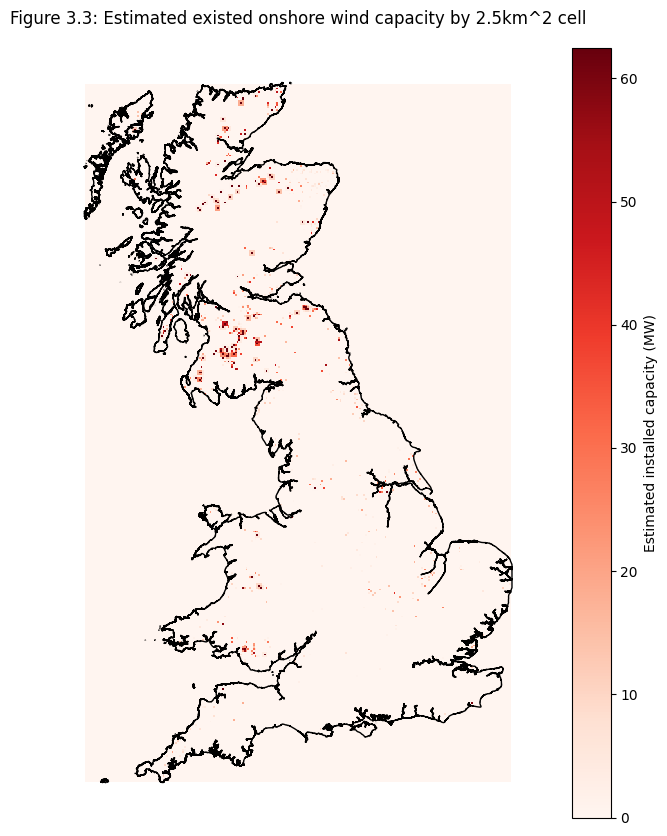

In [ ]:
# Existing ONW capacity

# plot onshore wind as raster

fig, ax = plt.subplots(figsize=(10, 10))
im = ax.imshow(
    np.flipud(onw_capacity_da_spread.values),  # flip so y increases upward
    extent=[x_coords_onw.min(), x_coords_onw.max(), y_coords_onw.min(), y_coords_onw.max()],
    origin='lower',
    cmap='Reds',
    interpolation='nearest'
)
plt.colorbar(im, ax=ax, label='Estimated installed capacity (MW)')
ax.set_title('Wind Farm Capacity Raster (2.5 km grid)')

# Plot GB boundary
gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

ax.set_title("Figure 3.3: Estimated existed onshore wind capacity by 2.5km^2 cell")

ax.axis('off')

plt.show()

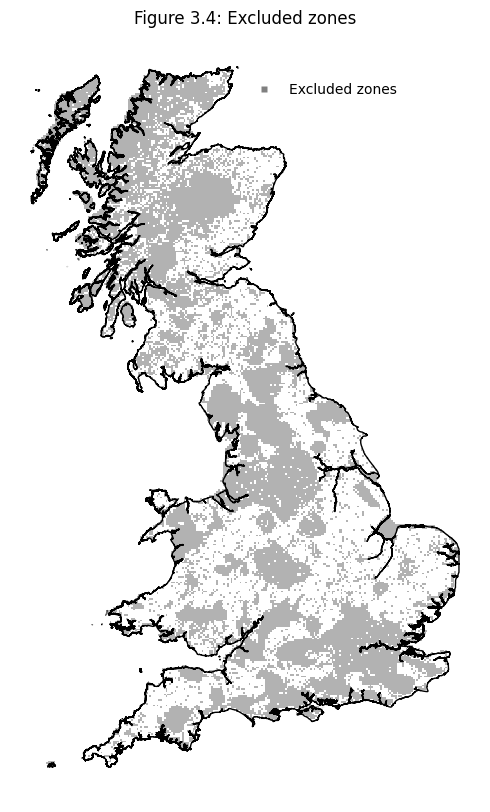

In [ ]:
# Plot excluded zones
from matplotlib.colors import ListedColormap

cmap = ListedColormap(['white', 'grey'])

fig, ax = plt.subplots(figsize=(10, 10))

# Use masked DataArray so only 1s show
im = ax.imshow(
    criteria_data['excluded_zones'].values,  # full data (0 & 1)
    extent=[criteria_data['x'].min(), criteria_data['x'].max(),
            criteria_data['y'].min(), criteria_data['y'].max()],
    cmap=cmap,
    interpolation='none',  # no smoothing
    alpha=0.6
)

# Overlay GB boundary
gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

# Legend for grey cells
grey_box_patch = Line2D(
    [], [],
    marker='s',
    linestyle='None',
    markersize=5,      
    markerfacecolor='grey',
    markeredgecolor='none',
    label='Excluded zones'
)

ax.legend(
    handles=[grey_box_patch],
    loc='upper right',
    fontsize=10,
    bbox_to_anchor=(0.85, 0.95),  # x, y in axes fraction
    frameon=False
)

ax.set_title("Figure 3.4: Excluded zones")

ax.axis('off')
plt.show()

## 7.3 Decision criteria

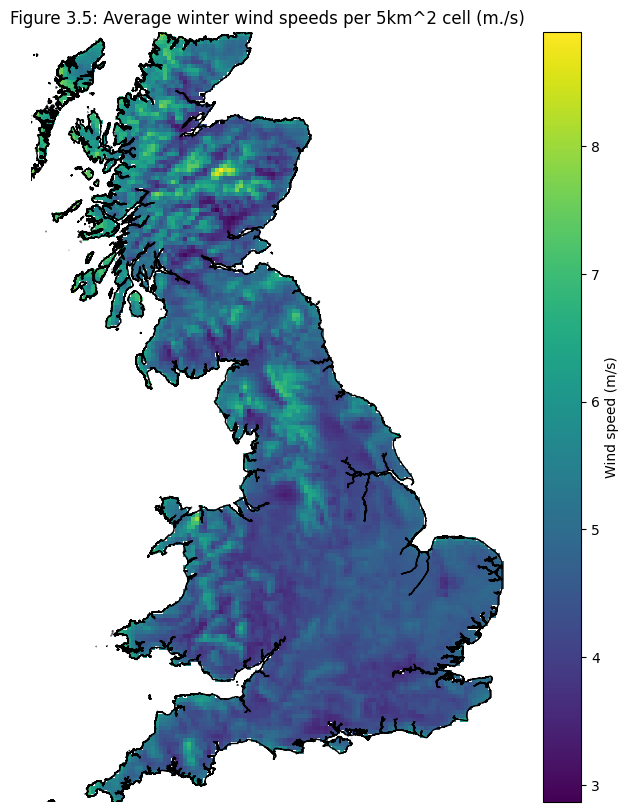

In [ ]:
# Average winter wind speed

fig, ax = plt.subplots(figsize=(10, 10))

# Plot wind speeds onto map
wind_speed_gb['wind_speed'].sel(season='winter').plot(
    ax=ax, 
    alpha=1,
    cbar_kwargs={
        "label": "Wind speed (m/s)"
    }
)

# Plot GB boundary
gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

ax.set_title("Figure 3.5: Average winter wind speeds per 5km^2 cell (m./s)")

ax.axis('off')

plt.show()


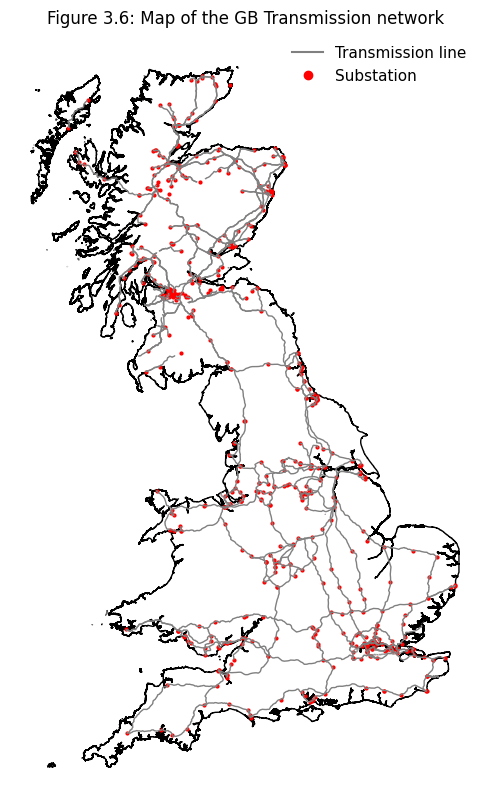

In [ ]:
# Plot the network onto GB map

fig, ax = plt.subplots(figsize=(10, 10))

# Plot GB boundary & TNUoS Regions (base layer)
gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)
#tnuos_regions_bng.plot(ax=ax, color='none', edgecolor='blue', linewidth=0.5)

# Plot network onto map
gb_lines.plot(ax=ax, color='grey', edgecolor='grey', linewidth=1)
gb_subs.plot(ax=ax, color='red', edgecolor='red', markersize=4)

# Legends
line_handle = Line2D(
    [], [],
    color='grey',
    linewidth=1.5,
    label='Transmission line'
)

substation_handle = Line2D(
    [], [],
    marker='o',
    linestyle='None',
    markersize=6,
    markerfacecolor='red',
    markeredgecolor='red',
    label='Substation'
)

# Add legend
ax.legend(
    handles=[line_handle, substation_handle],
    loc='upper right',
    frameon=False,
    fontsize=11
)

ax.set_title("Figure 3.6: Map of the GB Transmission network")

ax.axis('off')

plt.show()


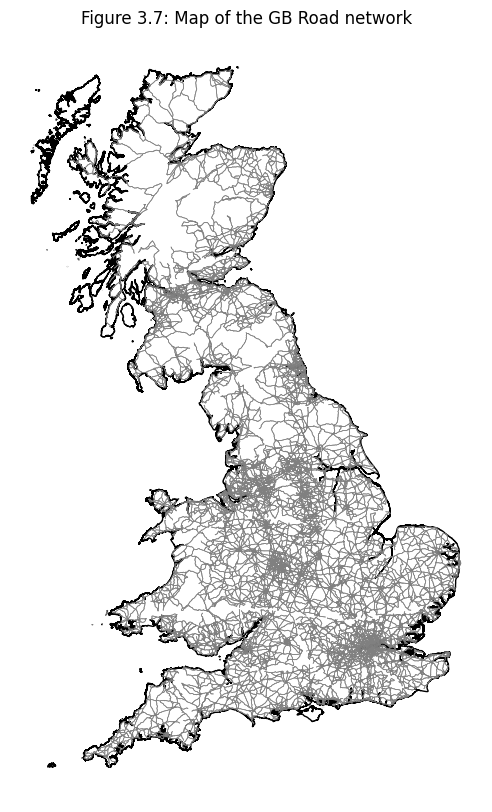

In [ ]:
# Road network
fig, ax = plt.subplots(figsize=(10, 10))

# Plot UK boundary & roads
gb_roads_bng.plot(ax=ax, color='grey', edgecolor='grey', linewidth=0.5)
gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

ax.axis('off')

ax.set_title("Figure 3.7: Map of the GB Road network")

plt.show()

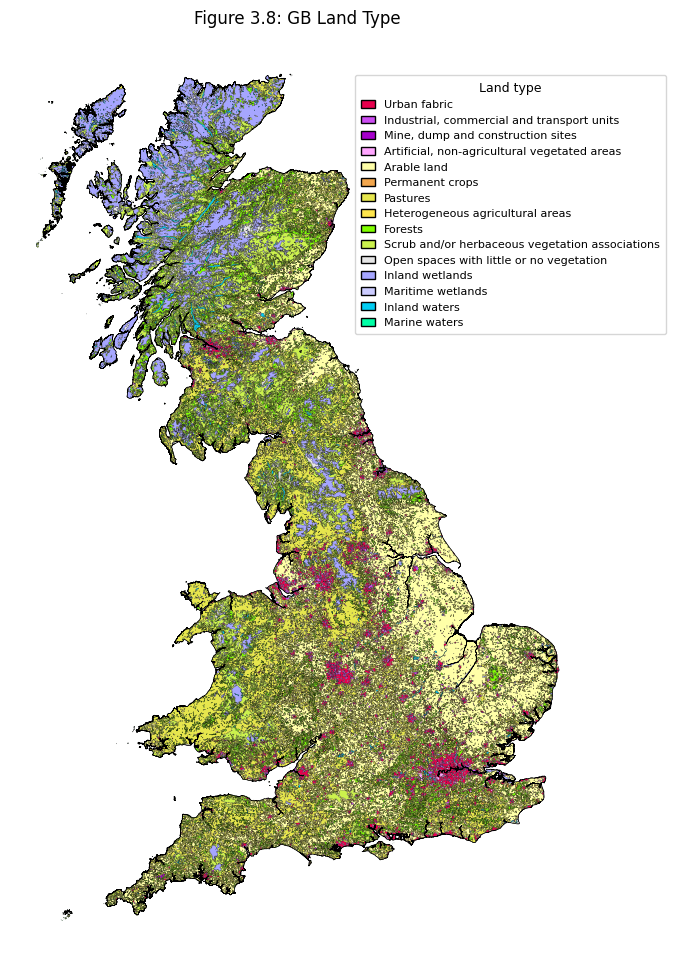

In [ ]:
# Map land cover
from matplotlib.patches import Patch
fig, ax = plt.subplots(figsize=(10,10))

land_cover_gb.plot(
    ax=ax,
#    color=land_cover_gb["level1_name"].map(level1_colors),
    color=land_cover_gb["level2_name"].map(level2_colors),
#    color=land_cover_gb["level3_name"].map(level3_colors),
    linewidth=0.1,
    edgecolor="black"
)

legend_elements = [
    Patch(
#        facecolor=level1_colors[name],
        facecolor=level2_colors[name],
#        facecolor=level3_colors[name],
        edgecolor="black",
        label=name
    )
#    for name in level1_colors
    for name in level2_colors
#    for name in level3_colors
]

ax.legend(
    handles=legend_elements,
    title="Land type",
    loc="upper right",
    bbox_to_anchor=(1.15, 0.96),
    frameon=True,
    labelspacing=0.5,
    handlelength=1.2,
    borderpad=0.6,
    fontsize=8,          
    title_fontsize=9    
)

plt.tight_layout(rect=[0, 0, 0.85, 1])

gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=0.5)

ax.set_title("Figure 3.8: GB Land Type")

ax.axis('off')
plt.show()


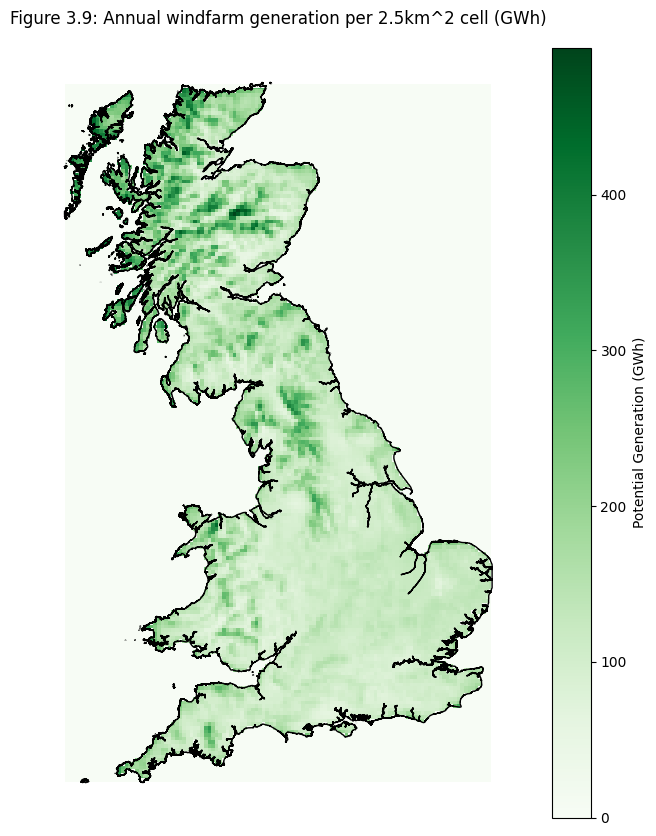

In [ ]:
# Plot potential annual generation (MWh)

fig, ax = plt.subplots(figsize=(10, 10))

# Plot wind speeds onto map
wind_gen_map = criteria_data['annual_generation_MWh']*1e-3

im = ax.imshow(
    np.flipud(wind_gen_map.values),  # flip so y increases upward
    extent=[x_coords_onw.min(), x_coords_onw.max(), y_coords_onw.min(), y_coords_onw.max()],
    origin='lower',
    cmap='Greens',
    interpolation='nearest'
)

plt.colorbar(im, ax=ax, label='Potential Generation (GWh)')
ax.set_title('Wind Farm Capacity Raster (2.5 km grid)')

# Plot GB boundary
gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

ax.set_title("Figure 3.9: Annual windfarm generation per 2.5km^2 cell (GWh)")

ax.axis('off')

plt.show()

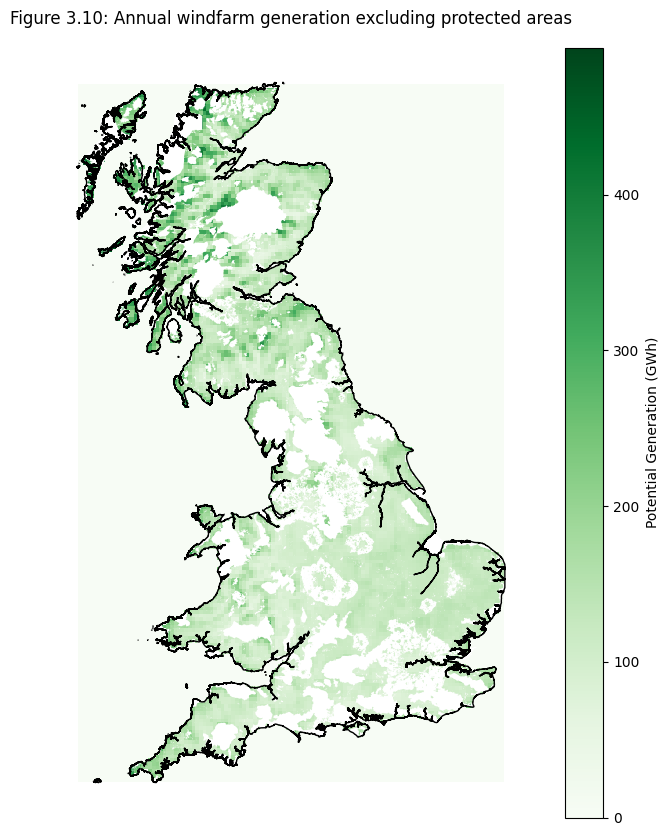

In [ ]:
# Potential generation w/out protected land (MWh)

fig, ax = plt.subplots(figsize=(10, 10))

# Plot wind speeds onto map
wind_gen_map = criteria_data['annual_generation_MWh']*1e-3

im = ax.imshow(
    np.flipud(wind_gen_map.values),  # flip so y increases upward
    extent=[x_coords_onw.min(), x_coords_onw.max(), y_coords_onw.min(), y_coords_onw.max()],
    origin='lower',
    cmap='Greens',
    interpolation='nearest'
)

protected_land_map.plot(ax=ax, color='white', edgecolor='none', linewidth=1.5, alpha=1)

plt.colorbar(im, ax=ax, label='Potential Generation (GWh)')

# Plot GB boundary
gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

ax.set_title("Figure 3.10: Annual windfarm generation excluding protected areas")

ax.axis('off')

plt.show()


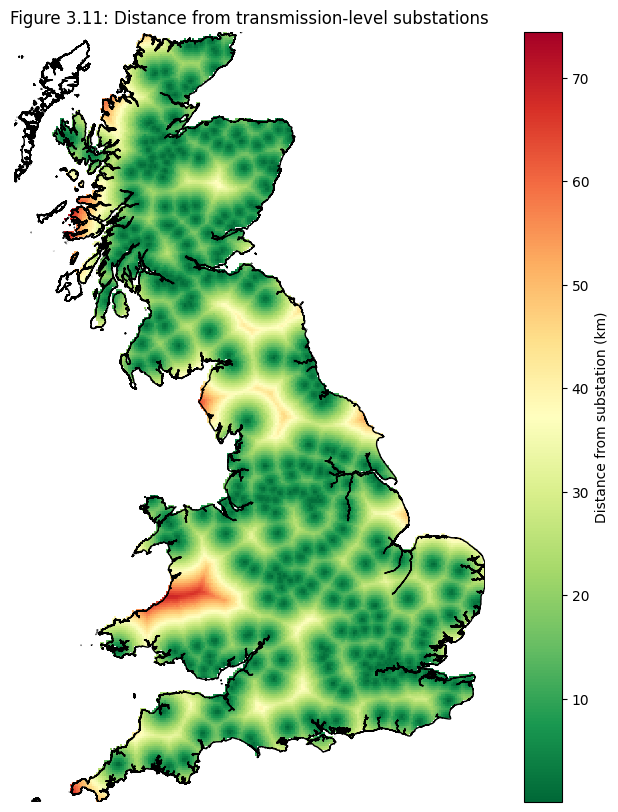

In [ ]:
# Substation distance

fig, ax = plt.subplots(figsize=(10, 10))

(criteria_data['dist_to_substation_m']*1e-3).plot(ax=ax,
                                                cmap='RdYlGn_r',
                                                cbar_kwargs={
                                                    "label": "Distance from substation (km)"
                                                }
                                                )

# GB Boundary
gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)


ax.set_title("Figure 3.11: Distance from transmission-level substations")

ax.axis('off')

plt.show()

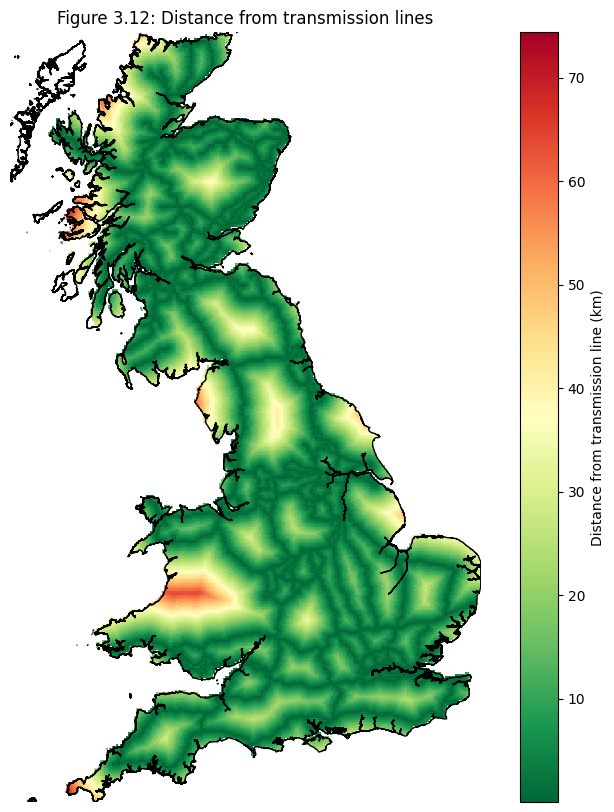

In [ ]:
# Transmission line distance

fig, ax = plt.subplots(figsize=(10, 10))

(criteria_data['dist_to_line_m']*1e-3).plot(ax=ax,
                                            cmap='RdYlGn_r',
                                            cbar_kwargs={
                                                "label": "Distance from transmission line (km)"
                                            }
                                            )

# GB Boundary
gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

ax.set_title("Figure 3.12: Distance from transmission lines")

ax.axis('off')

plt.show()

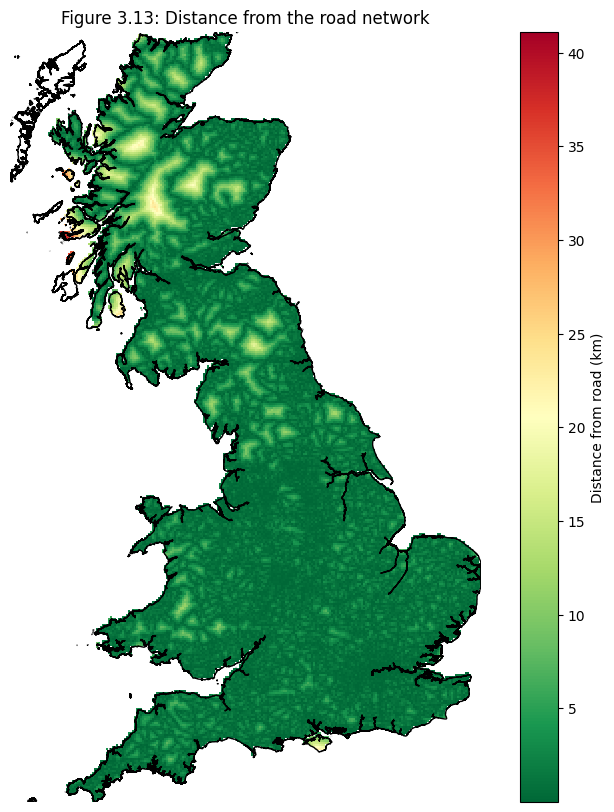

In [ ]:
# Road distance

fig, ax = plt.subplots(figsize=(10, 10))

(criteria_data['dist_to_road_m']*1e-3).plot(ax=ax,
                                            cmap='RdYlGn_r',
                                            cbar_kwargs={
                                                "label": "Distance from road (km)"
                                            }
                                            )

# GB Boundary
gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

ax.set_title("Figure 3.13: Distance from the road network")

ax.axis('off')

plt.show()

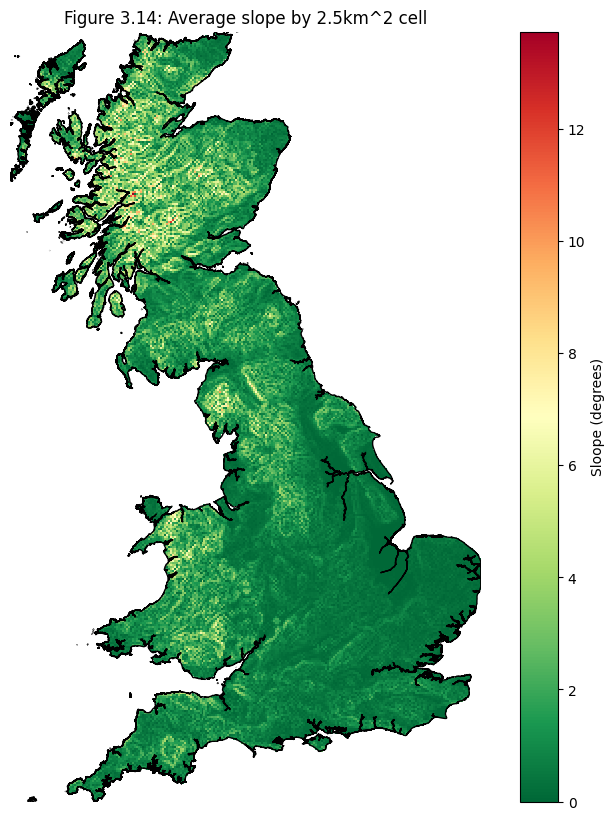

In [ ]:
# Slope
fig, ax = plt.subplots(figsize=(10, 10))

# Plot slope
terrain_gb['slope'].plot(
    ax=ax,
    cmap='RdYlGn_r', 
    alpha=1,
    cbar_kwargs={
        "label": "Sloope (degrees)"
    }
)

# Plot GB boundary & TNUoS Regions (base layer)
gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

ax.set_title("Figure 3.14: Average slope by 2.5km^2 cell")

ax.axis('off')

plt.show()

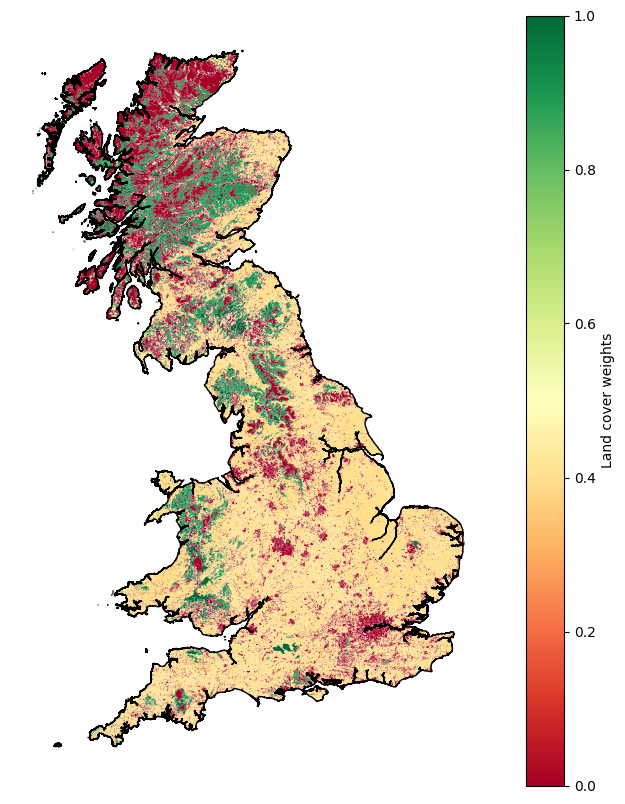

In [ ]:
# Land cover weights

fig, ax = plt.subplots(figsize=(10, 10))

land_cover_no_sea = land_cover_gb[land_cover_gb['CODE_18'] != '523']

# Plot wind speeds onto map
land_cover_no_sea.plot(
    column='corine_weight',
    ax=ax,
    cmap='RdYlGn',    
    legend=True,
    linewidth=0,
    alpha=1,
    legend_kwds={
        "label": "Land cover weights"
    }
)

# Plot GB boundary
gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

ax.set_title("")
ax.axis('off')

plt.show()

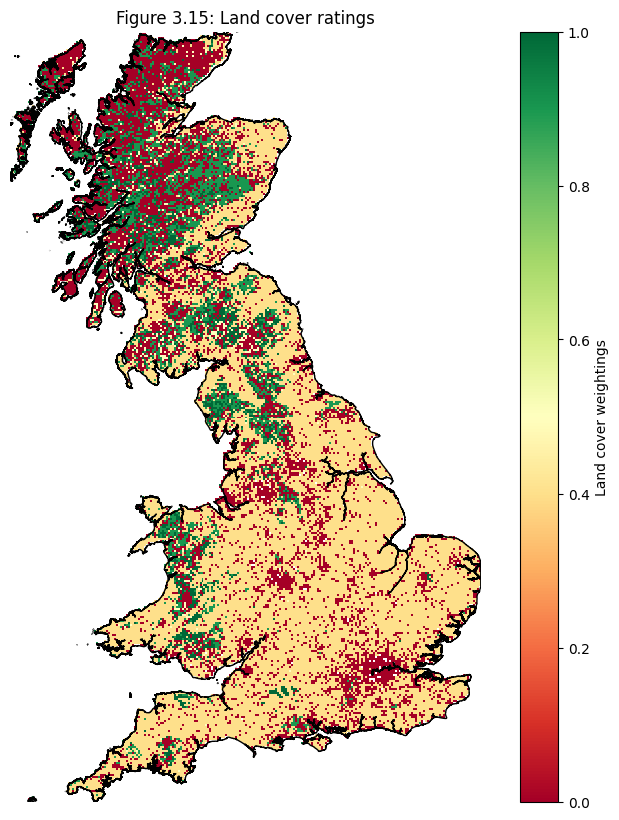

In [ ]:
# Land cover weightings
fig, ax = plt.subplots(figsize=(10, 10))

# Plot slope
corine_da.plot(
    ax=ax,
    cmap='RdYlGn', 
    alpha=1,
    cbar_kwargs={
        "label": "Land cover weightings"
    }
)

# Plot GB boundary & TNUoS Regions (base layer)
gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

ax.set_title("Figure 3.15: Land cover ratings")

ax.axis('off')

plt.show()

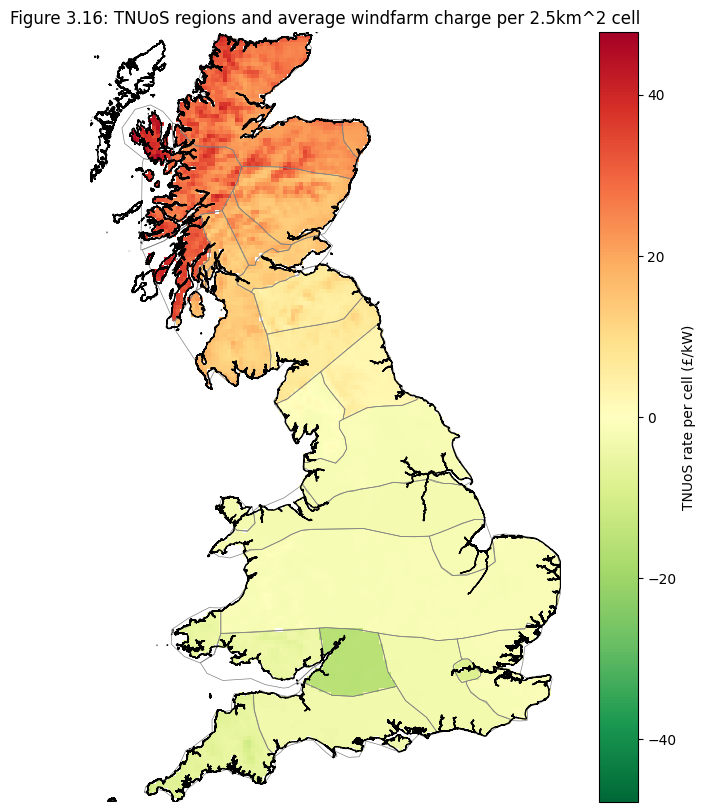

In [ ]:
# TNUoS weights by pixel
# Map estimted TNUoS charges & TNUoS regions

tnuos_rate = criteria_data['tnuos_charge_gbp']/(mw_per_sq*1e3)

fig, ax = plt.subplots(figsize=(10, 10))

# Plot TNUoS weights
tnuos_rate.plot(
    ax=ax,
    cmap='RdYlGn_r', 
    alpha=1,
    cbar_kwargs={
        "label": "TNUoS rate per cell (£/kW)"
    }
)

# Plot GB & TNUoS boundaries
tnuos_regions_bng.plot(ax=ax, color='none', edgecolor='grey', linewidth=0.5)
gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)


ax.set_title("Figure 3.16: TNUoS regions and average windfarm charge per 2.5km^2 cell")

ax.axis('off')

plt.show()

## 7.4 Suitability

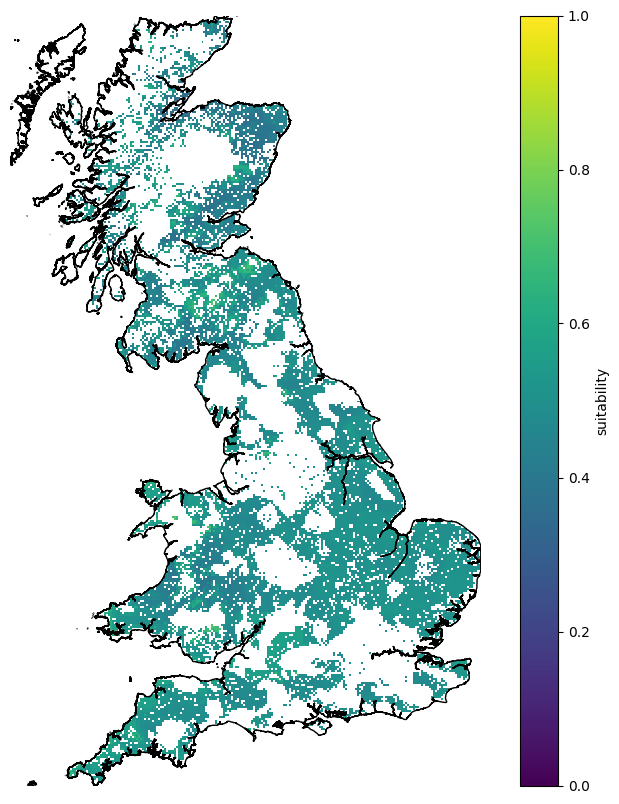

In [ ]:
# Plot sustainability chart

fig, ax = plt.subplots(figsize=(10, 10))

criteria_data['suitability'].plot(ax=ax, cmap='viridis', vmin=0, vmax=1)

# Plot network
# gb_lines.plot(ax=ax, color='black', edgecolor='grey', linewidth=1.2, alpha=0.7)

# GB Boundary
gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

#ax.set_title("Wind Farm Suitability (AHP-weighted)")
ax.set_title("")
ax.axis('off')

plt.show()

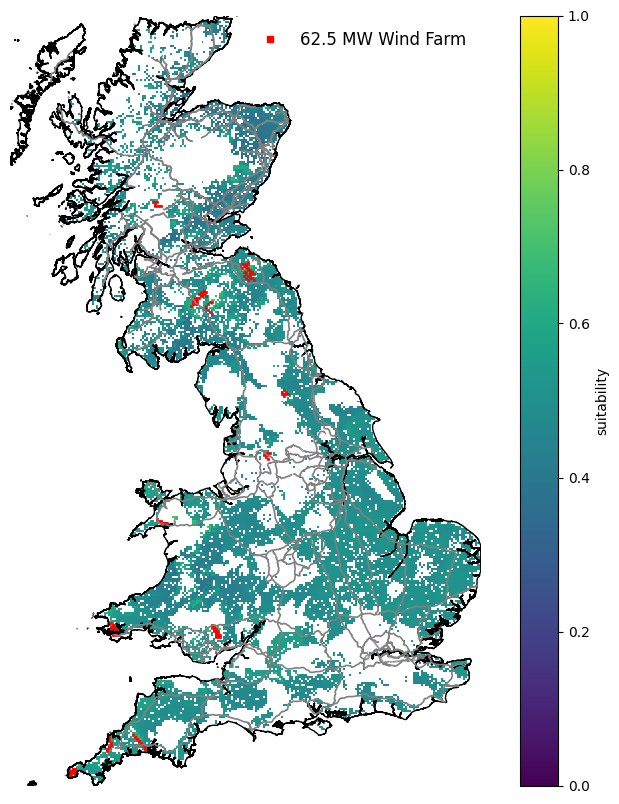

In [ ]:
# Plot! CONTINUOUS BOXES
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D

fig, ax = plt.subplots(figsize=(10, 10))

criteria_data['suitability'].plot(ax=ax, cmap='viridis', vmin=0, vmax=1)

# repd_large_wind.plot(
#     ax=ax,
#     column='tech_group',
#     categorical=True,
#     cmap='Set2',
#     alpha=0.6,
#     markersize=repd_large_wind['Installed Capacity (MWelec)'] / max_cap * size_scale
#     )

# Plot network
gb_lines.plot(ax=ax, color='grey', edgecolor='grey', linewidth=1.2)

# Plot continuous blocks
blocks_gdf.plot(ax=ax, facecolor='red', edgecolor='red', linewidth=0.5)

# Plot top 160 sites
# top160_gdf.plot(
#     ax=ax,
#     color='red',
#     edgecolor='black',
#     linewidth=0.3,
#     alpha=1,
#     marker='s',      # square marker
#     markersize=5    
# )

# GB Boundary
gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

# Legend for the red boxes
red_box_patch = Line2D(
    [], [],
    marker='s',
    linestyle='None',
    markersize=5,      
    markerfacecolor='red',
    markeredgecolor='red',
    label=f'{mw_per_sq} MW Wind Farm'
)

ax.legend(
    handles=[red_box_patch],
    loc='upper right',
    fontsize=12,
    frameon=False
)

#ax.set_title("Wind Farm Suitability (AHP-weighted)")
ax.set_title("")
ax.axis('off')

plt.show()

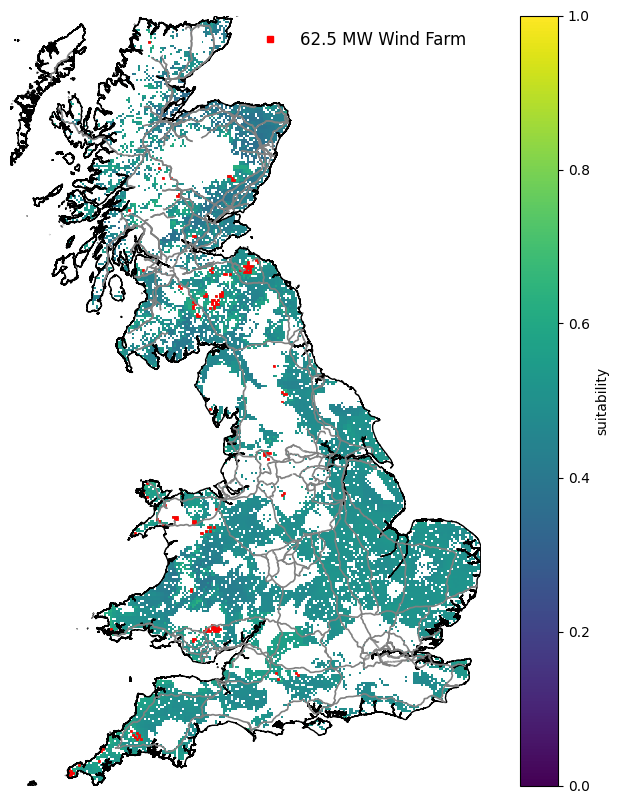

In [ ]:
# Plot! SEPERATE PLOTS
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D

fig, ax = plt.subplots(figsize=(10, 10))

criteria_data['suitability'].plot(ax=ax, cmap='viridis', vmin=0, vmax=1)

# repd_large_wind.plot(
#     ax=ax,
#     column='tech_group',
#     categorical=True,
#     cmap='Set2',
#     alpha=0.6,
#     markersize=repd_large_wind['Installed Capacity (MWelec)'] / max_cap * size_scale
#     )

# Plot network
gb_lines.plot(ax=ax, color='grey', edgecolor='grey', linewidth=1.2)

# Plot continuous blocks
# blocks_gdf.plot(ax=ax, facecolor='red', edgecolor='black', linewidth=0.5)

# Plot top 160 sites
top160_gdf.plot(ax=ax, facecolor='red', edgecolor='red', linewidth=0.5)

# GB Boundary
gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

# Legend for the red boxes
red_box_patch = Line2D(
    [], [],
    marker='s',
    linestyle='None',
    markersize=5,      
    markerfacecolor='red',
    markeredgecolor='red',
    label=f'{mw_per_sq} MW Wind Farm'
)

ax.legend(
    handles=[red_box_patch],
    loc='upper right',
    fontsize=12,
    frameon=False
)

#ax.set_title("Wind Farm Suitability (AHP-weighted)")
ax.set_title("")
ax.axis('off')

plt.show()

In [ ]:
# ### HYBRID PLOT ###

# # Hybrid plot: all Eng & Wal sites, plus an additional 10 continuous sites in Scotland

# import matplotlib.patches as mpatches

# fig, ax = plt.subplots(figsize=(10, 10))

# criteria_data['suitability'].plot(ax=ax, cmap='viridis', vmin=0, vmax=1)

# # Plot network
# gb_lines.plot(ax=ax, color='grey', edgecolor='grey', linewidth=1.2)

# # Plot continuous blocks
# merged_blocks_north.plot(ax=ax, facecolor='red', edgecolor='red', linewidth=0.5)

# # Plot 32 sites in E&W
# merged_blocks_south.plot(ax=ax, facecolor='red', edgecolor='red', linewidth=0.5)

# # GB Boundary
# gb_boundary_clip.plot(ax=ax, color='none', edgecolor='black', linewidth=1)

# # Legend for the red boxes
# red_box_patch = Line2D(
#     [], [],
#     marker='s',
#     linestyle='None',
#     markersize=5,      
#     markerfacecolor='red',
#     markeredgecolor='red',
#     label=f'{mw_per_sq} MW Wind Farm'
# )

# ax.legend(
#     handles=[red_box_patch],
#     loc='upper right',
#     fontsize=12,
#     frameon=False
# )

# #ax.set_title("Wind Farm Suitability (AHP-weighted)")
# ax.set_title("")
# ax.axis('off')

# plt.show()

In [ ]:
# # All wind charts
# fig, ax = plt.subplots(1, 2, figsize = (20, 10))

#  ax= ax[0,0], bins=20, kde=True, color='skyblue', edgecolor='black')

# End

In [ ]:
print(tnuos_rate.min())
print(tnuos_rate.max())

<xarray.DataArray 'tnuos_charge_gbp' ()> Size: 8B
array(-15.92829509)
<xarray.DataArray 'tnuos_charge_gbp' ()> Size: 8B
array(47.75515401)


In [ ]:
print((criteria_data['annual_generation_MWh']/(mw_per_sq*hr_per_year)).max())
print((criteria_data['annual_generation_MWh']/(mw_per_sq*hr_per_year)).quantile(0.606175))

<xarray.DataArray 'annual_generation_MWh' ()> Size: 8B
array(0.90310756)
<xarray.DataArray 'annual_generation_MWh' ()> Size: 8B
array(0.12679597)
Coordinates:
    quantile  float64 8B 0.6062
